# Sound Recognition - Deep Learning: Model Definition

### Carlos Granados, 12.2020

Test of different deep models for sound recongnition. Features obtained by wavelet transformations, MFCCs, spectral representation, chroma, Mel-scale and Tonnetz.

The sounds were obtained from the [Urban Sound Dataset](https://urbansounddataset.weebly.com/).

## 0. Load Packages

In [2]:
# Standard python libraries:
import os
import numpy as np
import math

# To specify path to a file, for any OS!
from pathlib import Path

# To manage ZIP files:
from zipfile import ZipFile

# To manage TAR files:
import tarfile

# To work with streams:
from io import BytesIO

# To work with sound files:
import soundfile as sf
import librosa
from librosa.feature import melspectrogram, mfcc, chroma_stft, tonnetz
import scipy.signal as scipy_signal

#Librosa 0.8.0 DOI:10.5281/zenodo.3955228
# McFee, Brian, Colin Raffel, Dawen Liang, Daniel PW Ellis, Matt McVicar,
# Eric Battenberg, and Oriol Nieto. “librosa: Audio and music signal analysis
# in python.” In Proceedings of the 14th python in science conference, pp. 18-25. 2015.

# Wavelet transformation:
import pywt

# Libraries to make plots and related
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.pyplot import imshow

%matplotlib inline

# Machine Learning
# Auxiliary functions and utilities
import sklearn
from sklearn.utils import shuffle, resample
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

# Deep Learning - keras
import keras
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation
from keras.layers import GlobalMaxPooling1D
from keras.layers import Conv1D, MaxPooling1D
from keras.layers import Conv2D, MaxPooling2D, Flatten
from keras.utils import to_categorical
from keras.optimizers import Adam
from keras.callbacks import Callback
import tensorflow as tf

import pandas as pd

# To save and load models
from joblib import dump, load

# Print versions:
print('Matplotlib Version   : {}'.format(matplotlib.__version__))
print('scikit-learn Version : {}'.format(sklearn.__version__))
print('pywt Version         : {}'.format(pywt.__version__))
print('SoundFile Version    : {}'.format(sf.__version__))
print('librosa Version      : {}'.format(librosa.__version__))
print('Keras Version        : {}'.format(keras.__version__))
print('TensorFlow Version   : {}'.format(tf.__version__))

Matplotlib Version   : 3.1.2
scikit-learn Version : 0.23.2
pywt Version         : 1.1.1
SoundFile Version    : 0.10.3
librosa Version      : 0.8.0
Keras Version        : 2.4.3
TensorFlow Version   : 2.3.1


***
---




## 1. Sound Files - Reading the Data

In order to develope our machine learning model for sound recognition, we use the sound files given by from J. Salamon, C. Jacoby and J. P. Bello, "*A Dataset and Taxonomy for Urban Sound Research*", 22nd ACM International Conference on Multimedia, Orlando USA, Nov. 2014. [Webapge source](https://urbansounddataset.weebly.com/).

The files were readed and preprocessed in a previous excersise. All files were converted to a `mono` channel, using a sampling rate of `44100 Hz`. We need here only to load the obtained arrays with the features and the corresponding labels. To do so, we use the `load_save` function.

We define now a function that will help us to save and load files...

In [3]:
def load_save(var, act, data=None, file_name=None):
    """
    Function to load from a file or save to a file some numpy arrays
    var : (str), variable to load
        : = 'sound', 'labels'
    act : (str), action to perform
        : = 'load', 'save'
    data : (np array) data to save
    """
    # Folder and file names
    folder_name = './saved/'
    file0_name = 'audio_data.npy'
    file1_name = 'labels_data.npy'
    file2_name = 'feat_250_data.npy'
    file3_name = 'feat_mfcc_125_data.npy'
    # Full file names, inclusing path
    file = {}
    file['sound'] = os.path.join(folder_name, file0_name)
    file['labels'] = os.path.join(folder_name, file1_name)
    file['feat_wt'] = os.path.join(folder_name, file2_name)
    file['feat_mfcc'] = os.path.join(folder_name, file3_name)
    if var not in file.keys():
        file[var] = os.path.join(folder_name, file_name)
    
    full_path = file[var]
    
    if act == 'save':

        # Check if folder exists
        if not os.path.isdir(folder_name):
            cmd = 'mkdir {}'.format(folder_name)
            os.system(cmd)
        # Save to npy files
        np.save(full_path, data)
        print(var + ' saved')

    elif act == 'load':
        
        # Check if data is already in memory or not...
        try:
            if var == 'sound':
                audio_data
            elif var == 'labels':
                labels
            else:
                feat
        except NameError:
            data = np.load(full_path, allow_pickle=True)
            print(var + ' loaded')
        else:
            print(var + ' already loaded')

        return data           

Now we can load all the needed features

In [4]:
feat_mfcc  = load_save('feat_mfcc', 'load')
feat_spec  = load_save('feat_spectral', 'load', file_name='feat_spectral_2049_data.npy')
feat_chr   = load_save('feat_chr', 'load', file_name='feat_chroma_24_data.npy')
feat_mel   = load_save('feat_mel', 'load', file_name='feat_mel_128_data.npy')
feat_tonne = load_save('feat_tonne', 'load', file_name='feat_tonne_6_data.npy')

feat_mfcc loaded
feat_spectral loaded
feat_chr loaded
feat_mel loaded
feat_tonne loaded


In [5]:
print(feat_mfcc.shape)
print(feat_spec.shape)
print(feat_chr.shape)
print(feat_mel.shape)
print(feat_tonne.shape)

(281, 125)
(281, 2049)
(281, 24)
(281, 128)
(281, 6)


And now we concatenate all features in one large array... (`125 + 2049 + 24 + 128 + 6 = 2332` features!)

In [6]:
features_all = np.concatenate((feat_mfcc, feat_spec, feat_chr,
                               feat_mel, feat_tonne),
                             axis=1)

features_all.shape

(281, 2332)

We are ready now to start to define and to train our models.

---
***




## 2. Model Definition and Training

We move now to define different deep learning models. We use our small datasets to train the models. We define two classes: one to save all the losses and the accuracies and a second to have all required information in one object.

In [7]:
# Class to save the losses and the accuracy during the training

class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.acc = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))
        self.acc.append(logs.get('accuracy'))

In [8]:
class classEval():
    """
    Class to train and evaluate a Deep Learning model for Classification.
    It prepares the data (normalization, splitting) and obtain different
    metrics on the models.
    X          : (array) Features
    Y          : (array) Labels
    model      : (model) Model to be trained...
    epochs     : (int) Num. of epochs to train the model
    batch_size : (int)
    """
    # Initialize
    def __init__(self, X, Y, model, epochs=30, batch_size=64, test_size=0.2,
                 random_state=578, data_shuffle=True, data_norm=True,
                 dim_data=1, dim0=0, dim1=0, verbose=1):
        # Copy input variables
        # Data and data related
        self.X = X
        self.Y = Y
        self.test_size = test_size
        self.ran_state = random_state
        self.data_norm = data_norm
        self.data_shuffle = data_shuffle
        self.dim_data = dim_data
        self.dim0 = dim0
        self.dim1 = dim1
        # Model related
        self.classifier = model
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        # To save the losses during the training
        self.model_loss = []
        # Normalize the data
        if self.data_norm:
            self.norm = StandardScaler()
            self.X = self.norm.fit_transform(self.X)
        # Suffle data before the splitting and the training
        if self.data_shuffle:
            self.X, self.Y = shuffle(self.X, self.Y)
        # Split training and test data
        # Convention: 0 = training
        #             1 = testing
        #             2 = predicted
        self.X0, self.X1, self.y0, self.y1 = train_test_split(self.X, self.Y,
                                                              test_size=self.test_size,
                                                              random_state=self.ran_state)
        # Reshape vectors, if each data set is a 2D representation...
        if self.dim_data == 2:
            self.X0 = self.X0.reshape(-1, self.dim0, self.dim1, 1)
            self.X1 = self.X1.reshape(-1, self.dim0, self.dim1, 1)

        # Initialize model
        print('Training + Test data. Norm : {}. Shuffle : {}. test_size = {}.'.format(
              self.data_norm, self.data_shuffle, self.test_size))
        print('Epochs : {}. batch_size : {}'.format(
              self.epochs, self.batch_size))
        # To verify if the model have been trained or not_
        self.model_trained = False

    # Model summary
    def summary(self):
        """
        Function to print the summary of the defined model
        """
        print(self.classifier.summary())
        print('Training + Test data. Norm : {}. Shuffle : {}. test_size = {}.'.format(
              self.data_norm, self.data_shuffle, self.test_size))
        print('Epochs : {}. batch_size : {}. test_size = {}.'.format(
              self.epochs, self.batch_size))

    # Get data shapes
    def get_shapes(self):
        print('Training data shape X : {}'.format(self.X0.shape))
        print('Training data shape y : {}'.format(self.y0.shape))
        print('Test data shape X : {}'.format(self.X1.shape))
        print('Test data shape y : {}'.format(self.y1.shape))
        
    # To train the model
    def train(self):
        """
        Function to train the defined model
        """
        # Initialize array to record losses and accuracy...
        self.lossHistory = LossHistory()
        # Train the model
        self.classifier.fit(self.X0, self.y0,
                            batch_size=self.batch_size,
                            epochs=self.epochs,
                            validation_data=(self.X1, self.y1),
                            verbose=self.verbose,
                            callbacks=[self.lossHistory])
        self.model_trained = True
        return self.classifier
        
    # To get the losses once the model have been trained
    def get_loss(self):
        if self.model_trained:
            return self.lossHistory.losses
        return None

    # To get the accuracy of the model, calculated during the training
    def get_acc(self):
        if self.model_trained:
            return self.lossHistory.acc
        return None    
       
    # To obtain the predictions:
    def pred(self):
        """
        Function to make predictions from the trained model.
        It only return the prediction
        """
        self.y2 = self.classifier.predict(self.x1)
        return self.y1, self.y2
    
    # To make predictions and calculate scores:
    def pred_score(self, save_vals=False, print_vals=True):
        """
        Function to make predictions and calculate several scores.
        It not return the prediction, but print out several scores:
        1. Matrix confusion, 2. F1-Score and 3. Accuracy
        """
        self.save_vals = save_vals
        self.print_vals = print_vals
        # Make a prediction
        self.y2 = self.classifier.predict(self.X1)
        # Transform to 1 Col. vector
        self.y1_lab = np.array([np.argmax(yi) for yi in self.y1])
        self.y2_lab = np.array([np.argmax(yi) for yi in self.y2])
        # calculate scores
        self.f1_sc = f1_score(self.y1_lab, self.y2_lab, average='weighted')
        self.cmat = confusion_matrix(self.y1_lab, self.y2_lab) #, labels=["AC", "Car Horn", "Drilling"]
        self.n_rows, self.n_cols = self.y1_lab.shape[0], self.cmat.shape[1]
        self.t_lab, self.f_lab = [], []
        self.t_tot, self.f_tot = 0, 0
        for i in range(self.n_cols):
            # True for i-th label
            self.ti = self.cmat[i][i]
            # Total true
            self.t_tot += self.ti
            # False for i-th label
            self.fi = 0
            for j in range(self.n_cols):
                if j != i:
                    self.fi += self.cmat[i][j]
            # Total false
            self.f_tot += self.fi
            # Save number of false and true Class. for i-th label
            self.t_lab.append(self.ti)
            self.f_lab.append(self.fi)
        # Print scores
        if self.print_vals:
            print('Confusion Matrix Values:')
            print('------------------------')
            for i in range(self.n_cols):
                print('\nLabel {} :'.format(i))
                print('True  : {}'.format(self.t_lab[i]))
                print('False : {}'.format(self.f_lab[i]))
                print('Total : {}'.format(self.t_lab[i]+self.f_lab[i]))
            print('\nMeasurements:')
            print('------------------------\n')
            print('F1 Score : {}'.format(self.f1_sc))
            print('Accuracy : {}'.format(self.t_tot/self.n_rows))
            print('Misclassification Rate : {}'.format(self.f_tot/self.n_rows))
        if self.save_vals:
            return self.f1_sc, self.t_tot/self.n_rows
        
    # Save Model
    def save_mod(self, folder=None, name=None):
        """
        Function to save the model to a file
        """
        # Target folder and file names
        if folder == None:
            folder = './models/'
        if name == None:
            name = 'model.joblib'
        # Full file names, inclusing path
        file = os.path.join(folder, name)
        # Check if folder exists
        if not os.path.isdir(folder_name):
            cmd = 'mkdir {}'.format(folder_name)
            os.system(cmd)
        # Save to npy files
        dump(self.classifier, file)
        print('Model saved to path : {}'.format(file))

We also need a function to plot the losses and the accuracy, obtained in different settings...

In [9]:
# Colors
ggrey    = '#424242' #grey 900
gred     = '#E53935' #red 600
gpurple  = '#8E42AA' #purple 600
gindigo  = '#3949AB' #indigo 600
gblue    = '#1E88E5' #blue 600
gcyan    = '#00ACC1' #cyan 600
gteal    = '#00897B' #teal 600
ggreen   = '#43A047' #green 600
gyellow  = '#FDD835' #yellow 600
gorange  = '#F57C00' #orange 700
gdorange = '#F4511E' #deep orange 600
gbgrey   = '#546E7A' #blue grey 600
gdpurple = '#512DA8' #deep purple 700
colors = [gred, gblue, ggreen, gpurple, gyellow,
          gdorange, gdpurple, gteal, gcyan, gindigo,
          gbgrey, ggrey]

def plot_test(data, fig_lab, n_plots=2, ncols=2, plot_type='lin', fig_title=None, colors=colors, labels=None):
    n_data = len(data)
    di = int(n_data / n_plots)
    nrows = int(n_plots / 2)
    if nrows == 0:
        nrows = 1
    i0 = 0
    lab_x = 'Epochs'
    if fig_lab == 'loss':
        lab_i = 'Loss L '
        lab_y = 'Loss'
    elif fig_lab == 'acc':
        lab_i = 'Acc. L '
        lab_y = 'Accuracy'
    fig, ax = plt.subplots(ncols=ncols, figsize=(10,5))
    if fig_title != None:
        fig.suptitle(fig_title, fontsize=14)
    for i_row in range(nrows):
        for i_col in range(ncols):
            i1 = min(i0 + di, n_data)
            for i in range(i0, i1):
                n = len(data[i])
                if labels == None:
                    label = lab_i + str(i)
                else:
                    label = labels[i]
                if plot_type == 'lin':
                    ax[i_col].plot(range(1, n+1), data[i], label=label, c=colors[i])
                elif plot_type == 'log':
                    ax[i_col].semilogy(range(1, n+1), data[i], label=label, c=colors[i])
            i0 = i1
            ax[i_col].legend()
            ax[i_col].set_xlabel(lab_x)
            ax[i_col].set_ylabel(lab_y)
    plt.show()

---




### 2.1 Dropout Model

As a first classifier, we consider an artificial neural network with several layers and with `Dropout` layers between each layer.

In [10]:
# Some initial variables and parameters:

n_feat = features_all.shape[1]

# Choose an integer base representation
n_base = 2
nlog = int(math.log(n_feat, n_base))
n_feat_n = n_base**nlog
# Num. of neurons in each layer
n_neurons0 = n_base**(nlog+1)
n_neurons1 = int(n_neurons0 / (n_base))
n_neurons2 = int(n_neurons1 / (n_base))
n_neurons3 = int(n_neurons2 / (n_base))
n_neurons4 = int(n_neurons3 / (n_base))
n_neurons5 = int(n_neurons4 / (n_base))
n_neurons6 = int(n_neurons5 / (n_base))
n_neurons7 = int(n_neurons6 / (n_base))
n_neurons8 = int(n_neurons7 / (n_base))

# Transform labels array to a label vector
try:
    del labels
except NameError:
    None    
labels  = load_save('labels', 'load')
labels_vec = to_categorical(np.asarray(labels))
lab_dim = labels_vec.shape[1]
print('Num. of labels : {}'.format(lab_dim))
print('Number of neurons : {}'.format([n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4]))

labels loaded
Num. of labels : 3
Number of neurons : [4096, 2048, 1024, 512, 256]


Now let's define our first model. It is composed by 6 hidden layers: 3 `Dense` layers with `n_neurons0`, `n_neurons1`, `n_neurons2` neurons, respectively, and 3 `Dropout` layers intercalated with the previous ones. We use the `categorical_crossentropy` as a loss function and the `Adam` optimizer.

In [57]:
# Definition of the model

def modelDropout(l_neurons, l_dropout, dim_in, dim_out,
                 opt_fun='adam',
                 loss_fun='categorical_crossentropy'):
    nn = len(l_neurons)
    nd = len(l_dropout)
    if nn != nd:
        print('Error between the number of neurons and dropout terms')
        return None
    model = Sequential()
    # Input layer
    model.add(Dense(dim_in, activation='relu', input_shape=(dim_in,)))
    for i in range(nn):
        # i-th layer + Dropout
        model.add(Dense(l_neurons[i], activation='relu'))
        model.add(Dropout(l_dropout[i]))
    # Output layer
    model.add(Dense(dim_out, activation='softmax'))
    # Compile model
    model.compile(loss=loss_fun, optimizer=opt_fun,
                  metrics=['accuracy'])
    return model

We will perform a grid search on several of the parameters for the model. We will seearch for different layers, with different number of units, and different dropouts...

We start defining some of the required parameters:

In [16]:
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]
l_dropout = [0.6, 0.5, 0.4]

# To configure the number of layers and the number of neurons per layer
neurons_seed = [n_neurons1]  # All layers will have the same number of neurons
dropout_seed = [0.3]         # All laysrs will have the same droput
nl_min = 1                   # Min 1 hidden layer 
nl_max = 11                  # Max 10 hidden layers

The first model uses the same number of neurons per layer (`n_neurons1 = 2048`, and the same dropout `Dropout(0.3)` after each hidden layer. We will train each model with `epochs = 500`, using an `adam` as optimizer and a `categorical_crossentropy` as a loss function.

In [24]:
# Empty lists to save the losses at each iteration
losses_all = []
acc_all = []
score_test_all = []

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_n = neurons_seed * nl
    l_d = dropout_seed * nl
    print('Num. of neurons / layer : {}'.format(l_n))
    print('Dropout / layer : {}'.format(l_d))
    model_nl = None
    class_nl = None
    model_nl = modelDropout(l_n, l_d, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all.append(class_nl.get_loss())
    acc_all.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True)
    score_test_all.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [2048]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
Confusion Matrix Values:
------------------------

Label 0 :
True  : 5
False : 8
Total : 13

Label 1 :
True  : 20
False : 4
Total : 24

Label 2 :
True  : 14
False : 6
Total : 20

Measurements:
------------------------

F1 Score : 0.6754776064118674
Accuracy : 0.6842105263157895
Misclassification Rate : 0.3157894736842105
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [2048, 2048]
Dropout / layer : [0.3, 0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
Confusion Matrix Values:
------------------------

Label 0 :
True  : 5
False : 3
Total : 8

Label 1 :
True  : 18
False : 7
Total : 25

Label 2 :
True  : 17
False : 7
Total : 24

Measurements:
------------------------

F1 Score : 0.7029400786070308
Accuracy 

Confusion Matrix Values:
------------------------

Label 0 :
True  : 0
False : 13
Total : 13

Label 1 :
True  : 24
False : 0
Total : 24

Label 2 :
True  : 0
False : 20
Total : 20

Measurements:
------------------------

F1 Score : 0.24951267056530213
Accuracy : 0.42105263157894735
Misclassification Rate : 0.5789473684210527
-------------------------------------------


Num. of hidden layers : 10
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
Confusion Matrix Values:
------------------------

Label 0 :
True  : 0
False : 8
Total : 8

Label 1 :
True  : 22
False : 3
Total : 25

Label 2 :
True  : 12
False : 12
Total : 24

Measurements:
------------------------

F1 Score : 0.5471428283682801
Accuracy : 0.5964912280701754
Misclassification Rate : 0.40350877192982454
-----------------------

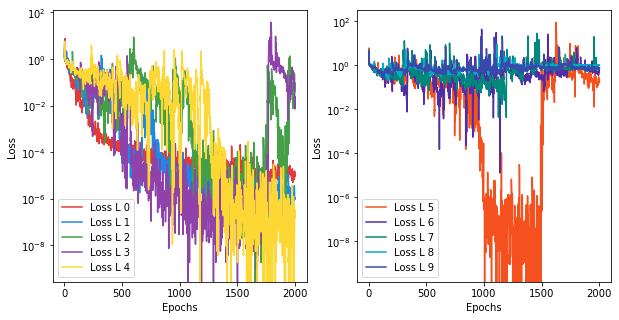

In [36]:
#Plot Loss

plot_test(losses_all, 'loss', plot_type='log')

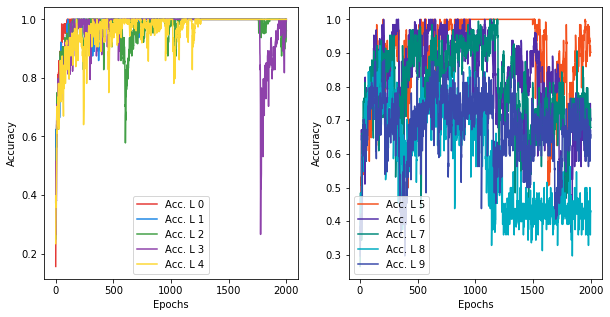

In [38]:
#Plot Accuracy

plot_test(acc_all, 'acc', plot_type='lin')

Check the scores for the test data:

In [46]:
import pandas as pd
scores = np.array(score_test_all)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.675478,0.684211
1,2.0,0.702940,0.701754
2,3.0,0.608187,0.631579
3,4.0,0.645735,0.701754
4,5.0,0.615595,0.614035
5,6.0,0.697811,0.719298
6,7.0,0.550849,0.614035
7,8.0,0.500792,0.561404
8,9.0,0.249513,0.421053
9,10.0,0.547143,0.596491


Now we train a similar model, with a larger dropout:

In [52]:
# Empty lists to save the losses at each iteration
losses_all_1 = []
acc_all_1 = []
score_test_all_1 = []

dropout_seed = [0.6]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_n = neurons_seed * nl
    l_d = dropout_seed * nl
    print('Num. of neurons / layer : {}'.format(l_n))
    print('Dropout / layer : {}'.format(l_d))
    model_nl = None
    class_nl = None
    model_nl = modelDropout(l_n, l_d, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_1.append(class_nl.get_loss())
    acc_all_1.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_1.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [2048]
Dropout / layer : [0.6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [2048, 2048]
Dropout / layer : [0.6, 0.6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [2048, 2048, 2048]
Dropout / layer : [0.6, 0.6, 0.6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [2048, 2048, 2048, 2048]
Dropout / layer : [0.6, 0.6, 0.6, 0.6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 5

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 10
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Dropout / layer : [0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



Let's check the loss and the accuracy for all tested models:

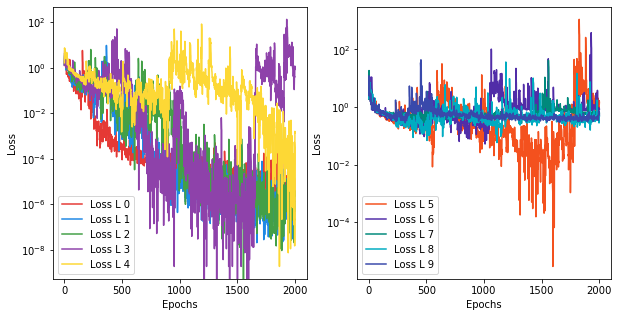

In [53]:
#Plot Loss

plot_test(losses_all_1, 'loss', plot_type='log')

In [ ]:
#Plot Accuracy

plot_test(acc_all_2, 'acc', plot_type='lin')

We consider now the same dropout model, with only 2 layers:

In [55]:
scores = np.array(score_test_all_1)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.577915,0.596491
1,2.0,0.626076,0.649123
2,3.0,0.752695,0.754386
3,4.0,0.781806,0.789474
4,5.0,0.599485,0.596491
5,6.0,0.560524,0.631579
6,7.0,0.545371,0.614035
7,8.0,0.602023,0.649123
8,9.0,0.706567,0.719298
9,10.0,0.611468,0.684211


And now we try with changing the dropout, from `0.6` to `0.1`...

In [56]:
# Empty lists to save the losses at each iteration
losses_all_2 = []
acc_all_2 = []
score_test_all_2 = []

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    if nl == nl_min:
        l_d = [0.6]
    else:
        new_drop = max(l_d[-1]-0.1, 0.1)
        l_d.append(new_drop)
    l_n = neurons_seed * nl
    print('Num. of neurons / layer : {}'.format(l_n))
    print('Dropout / layer : {}'.format(l_d))
    model_nl = None
    class_nl = None
    model_nl = modelDropout(l_n, l_d, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_2.append(class_nl.get_loss())
    acc_all_2.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_2.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [2048]
Dropout / layer : [0.6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [2048, 2048]
Dropout / layer : [0.6, 0.5]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [2048, 2048, 2048]
Dropout / layer : [0.6, 0.5, 0.4]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [2048, 2048, 2048, 2048]
Dropout / layer : [0.6, 0.5, 0.4, 0.30000000000000004]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of h

-------------------------------------------


Num. of hidden layers : 9
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Dropout / layer : [0.6, 0.5, 0.4, 0.30000000000000004, 0.20000000000000004, 0.10000000000000003, 0.1, 0.1, 0.1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 10
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Dropout / layer : [0.6, 0.5, 0.4, 0.30000000000000004, 0.20000000000000004, 0.10000000000000003, 0.1, 0.1, 0.1, 0.1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



And we check now the loss and the accuracy:

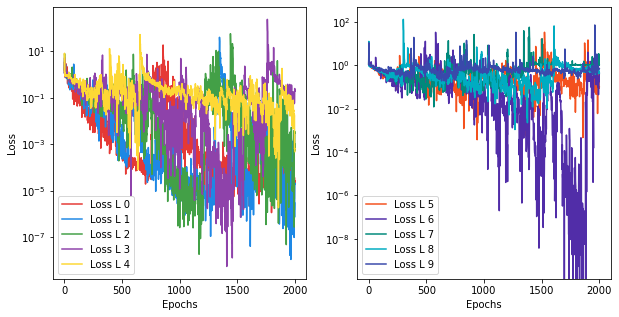

In [62]:
#Plot Loss

plot_test(losses_all_2, 'loss', plot_type='log')

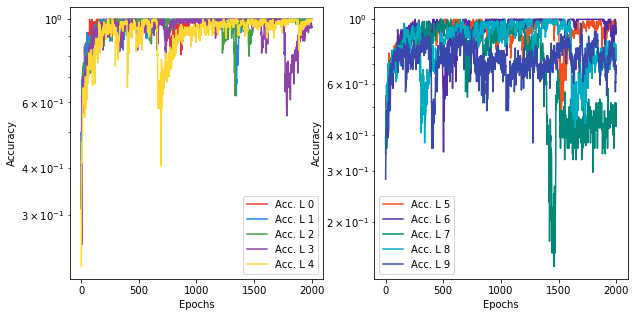

In [58]:
#Plot Accuracy

plot_test(acc_all_2, 'acc', plot_type='lin')

Let's modify a bit the dropout...

In [59]:
scores = np.array(score_test_all_2)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)


#l_dropout = [0.3, 0.3, 0.2, 0.2]

,Num. Layers,F1-Score,Accuracy
0,1.0,0.707086,0.684211
1,2.0,0.713172,0.719298
2,3.0,0.702311,0.701754
3,4.0,0.705918,0.736842
4,5.0,0.750939,0.754386
5,6.0,0.668820,0.666667
6,7.0,0.773128,0.771930
7,8.0,0.285775,0.456140
8,9.0,0.669143,0.701754
9,10.0,0.562800,0.526316


And a thrid test with a smallest dropout...

In [63]:
# Empty lists to save the losses at each iteration
losses_all_3 = []
acc_all_3 = []
score_test_all_3 = []

dr0, dr1 = 0.3, 0.2

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    n_half = max(int(nl/2), 1)
    if nl % 2 == 1:
        n_half += 1
    if nl == nl_min:
        l_d = [dr0]
    else:
        l_d = []
        for i in range(n_half):
            l_d.append(dr0)
        for i in range(n_half, nl):
            l_d.append(dr1)
    l_n = neurons_seed * nl
    print('Num. of neurons / layer : {}'.format(l_n))
    print('Dropout / layer : {}'.format(l_d))
    model_nl = None
    class_nl = None
    model_nl = modelDropout(l_n, l_d, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_3.append(class_nl.get_loss())
    acc_all_3.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_3.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [2048]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [2048, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [2048, 2048, 2048]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [2048, 2048, 2048, 2048]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 5

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 10
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



Let's check the loss, the accuracy and the scores:

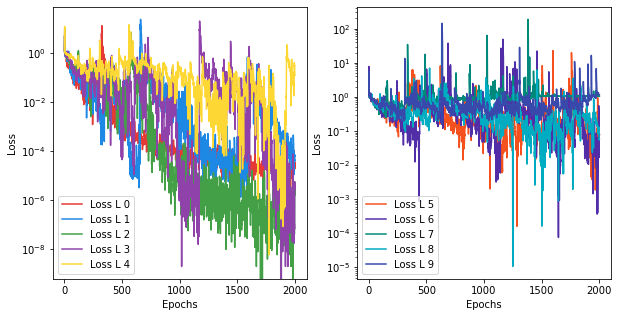

In [64]:
#Plot Loss

plot_test(losses_all_3, 'loss', plot_type='log')

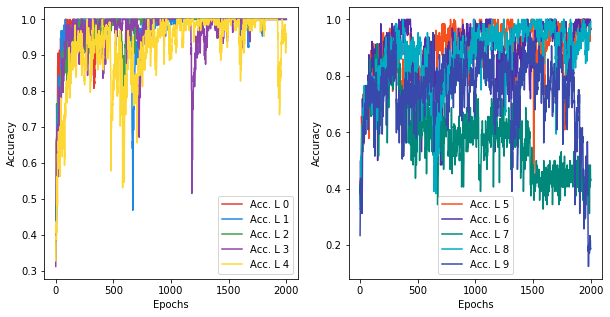

In [71]:
#Plot Acc.

plot_test(acc_all_3, 'acc', plot_type='lin')

In [66]:
scores = np.array(score_test_all_3)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.743923,0.736842
1,2.0,0.687073,0.684211
2,3.0,0.753734,0.754386
3,4.0,0.637602,0.631579
4,5.0,0.712121,0.701754
5,6.0,0.705143,0.719298
6,7.0,0.720005,0.719298
7,8.0,0.232018,0.403509
8,9.0,0.751467,0.736842
9,10.0,0.034548,0.140351


In [67]:
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save the losses at each iteration
losses_all_4 = []
acc_all_4 = []
score_test_all_4 = []

dr0, dr1 = 0.3, 0.2

nl_max = 10

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    n_half = max(int(nl/2), 1)
    if nl % 2 == 1:
        n_half += 1
    if nl == nl_min:
        l_d = [dr0]
    else:
        l_d = []
        for i in range(n_half):
            l_d.append(dr0)
        for i in range(n_half, nl):
            l_d.append(dr1)
    l_n = l_neurons[0:nl]
    print('Num. of neurons / layer : {}'.format(l_n))
    print('Dropout / layer : {}'.format(l_d))
    model_nl = None
    class_nl = None
    model_nl = modelDropout(l_n, l_d, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_4.append(class_nl.get_loss())
    acc_all_4.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_4.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 5


-------------------------------------------



Let's check the loss, the accuracy and the scores:

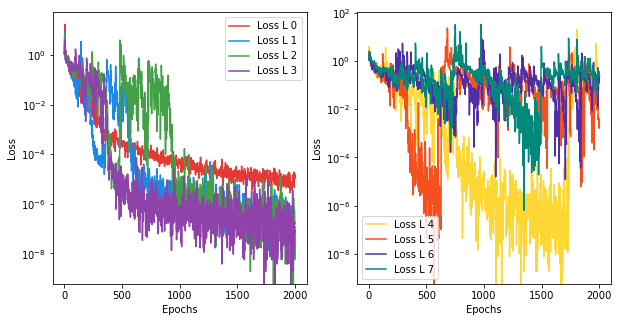

In [68]:
#Plot Loss

plot_test(losses_all_4, 'loss', plot_type='log')

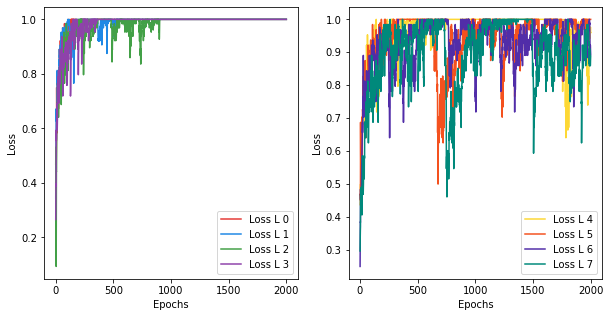

In [69]:
#Plot Acc.

plot_test(acc_all_4, 'loss', plot_type='lin')

In [70]:
scores = np.array(score_test_all_4)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.707657,0.719298
1,2.0,0.662162,0.666667
2,3.0,0.730245,0.736842
3,4.0,0.803093,0.807018
4,5.0,0.720295,0.719298
5,6.0,0.651061,0.666667
6,7.0,0.678636,0.666667
7,8.0,0.783012,0.771930
8,9.0,0.751674,0.771930


Now we can explore different loss functions...

In [58]:
losses = ["binary_crossentropy", "categorical_crossentropy", "poisson"]

l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save the losses at each iteration
losses_all_5 = []
acc_all_5 = []
score_test_all_5 = []

dr0, dr1 = 0.3, 0.2

nl_min = 1
nl_max = 10

# Loop in the number of layers
for loss_fun in losses:
    print()
    fig_title = 'Loss Function : {}'.format(loss_fun)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        n_half = max(int(nl/2), 1)
        if nl % 2 == 1:
            n_half += 1
        if nl == nl_min:
            l_d = [dr0]
        else:
            l_d = []
            for i in range(n_half):
                l_d.append(dr0)
            for i in range(n_half, nl):
                l_d.append(dr1)
        l_n = l_neurons[0:nl]
        print('Num. of neurons / layer : {}'.format(l_n))
        print('Dropout / layer : {}'.format(l_d))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelDropout(l_n, l_d, n_feat, lab_dim, loss_fun=loss_fun)
        class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
        class_nl.train()
#         losses_all_5.append(class_nl.get_loss())
#         acc_all_5.append(class_nl.get_acc())
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_5.append([loss_fun, nl, f1, acc])
        print('-----------------\n')
    losses_all_5.append(loss_i)
    acc_all_5.append(acc_i)


Loss Function : binary_crossentropy

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Loss Function : categorical_crossentropy

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Sh

-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Loss Function : poisson

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------

-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------



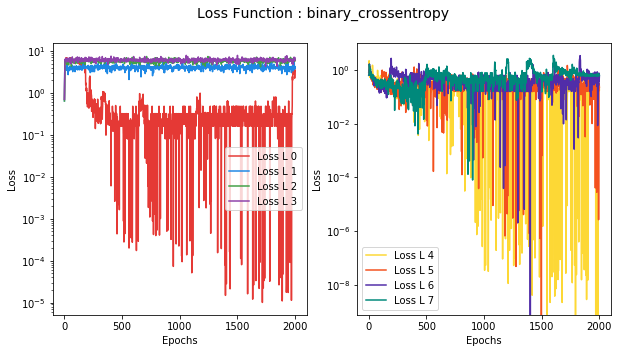

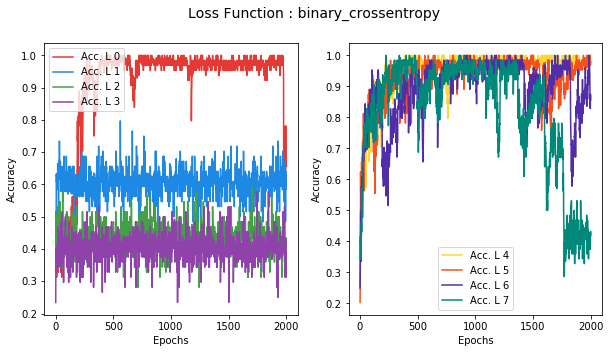

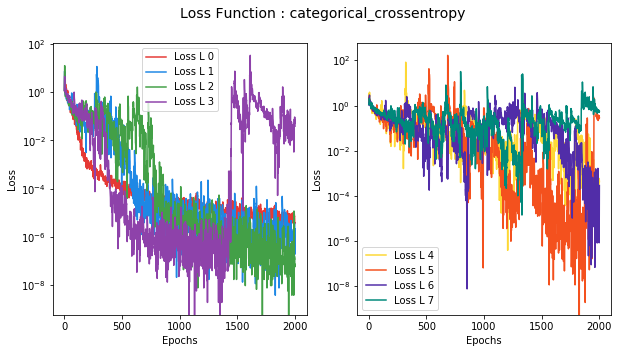

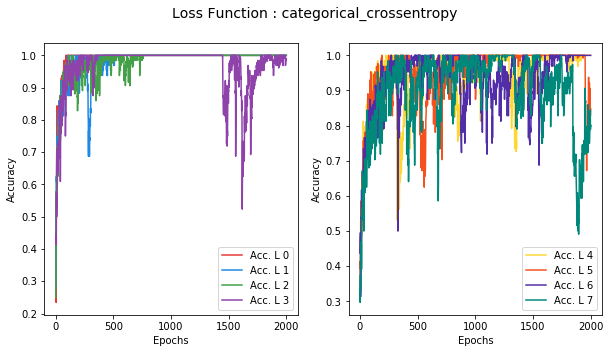

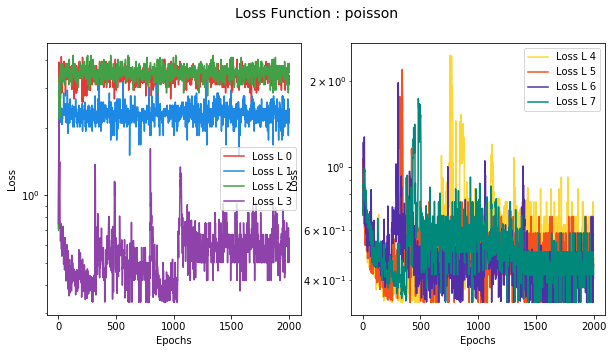

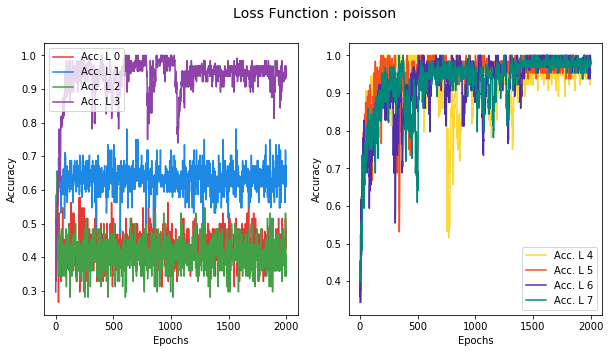

In [59]:
for i, loss_fun in enumerate(losses):
    fig_title = 'Loss Function : {}'.format(loss_fun)
    plot_test(losses_all_5[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_5[i], 'acc', plot_type='lin', fig_title=fig_title)

In [60]:
scores = np.array(score_test_all_5)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_losses_Dropout.csv')
df_scores.head(40)

,Loss-Func.,Num. Layers,F1-Score,Accuracy
0,binary_crossentropy,1,0.4969372584002379,0.543859649122807
1,binary_crossentropy,2,0.6573438426985337,0.7192982456140351
2,binary_crossentropy,3,0.09686187299234002,0.24561403508771928
3,binary_crossentropy,4,0.1822738664843928,0.3508771929824561
4,binary_crossentropy,5,0.5687552213868003,0.5789473684210527
5,binary_crossentropy,6,0.6649958228905597,0.6666666666666666
6,binary_crossentropy,7,0.6692905718292717,0.7192982456140351
7,binary_crossentropy,8,0.26743688489516476,0.43859649122807015
8,binary_crossentropy,9,0.6239085617268979,0.5789473684210527
9,categorical_crossentropy,1,0.7188340248380054,0.7192982456140351


In [61]:
optimizers = ['SGD', 'RMSprop', 'adam', 'adadelta', 'adagrad', 'adamax', 'nadam', 'ftrl']

l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save the losses at each iteration
losses_all_6 = []
acc_all_6 = []
score_test_all_6 = []

dr0, dr1 = 0.3, 0.2

nl_min = 1
nl_max = 10

# Loop in the number of layers
for opt_fun in optimizers:
    print()
    fig_title = 'Optimizer Function : {}'.format(opt_fun)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        n_half = max(int(nl/2), 1)
        if nl % 2 == 1:
            n_half += 1
        if nl == nl_min:
            l_d = [dr0]
        else:
            l_d = []
            for i in range(n_half):
                l_d.append(dr0)
            for i in range(n_half, nl):
                l_d.append(dr1)
        l_n = l_neurons[0:nl]
        print('Num. of neurons / layer : {}'.format(l_n))
        print('Dropout / layer : {}'.format(l_d))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelDropout(l_n, l_d, n_feat, lab_dim, opt_fun=opt_fun)
        class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_6.append([opt_fun, nl, f1, acc])
        print('-----------------\n')
    losses_all_6.append(loss_i)
    acc_all_6.append(acc_i)


Optimizer Function : SGD

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : 

-----------------


Optimizer Function : RMSprop

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num

-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Optimizer Function : adam

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Optimizer Function : adadelta

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
T

-----------------


Num. of hidden layers : 8
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Optimizer Function : adagrad

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. t

-----------------


Num. of hidden layers : 8
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Optimizer Function : adamax

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. te

-----------------


Num. of hidden layers : 7
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 8
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Optimizer Function : nadam

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Trai

-----------------


Num. of hidden layers : 7
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 8
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Optimizer Function : ftrl

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Dropout / layer : [0.3]
Train

-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 7
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 8
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 9
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128, 64, 32, 16]
Dropout / layer : [0.3, 0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2]
Training + Test data. Norm : Tru

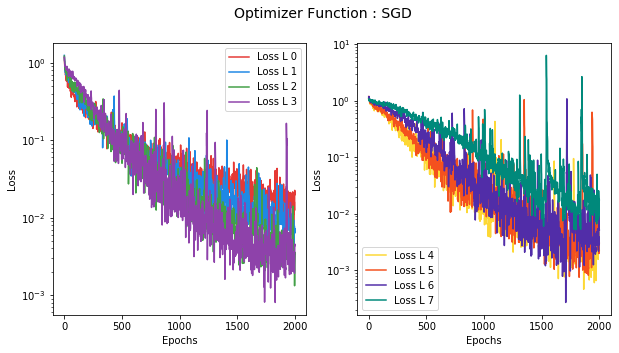

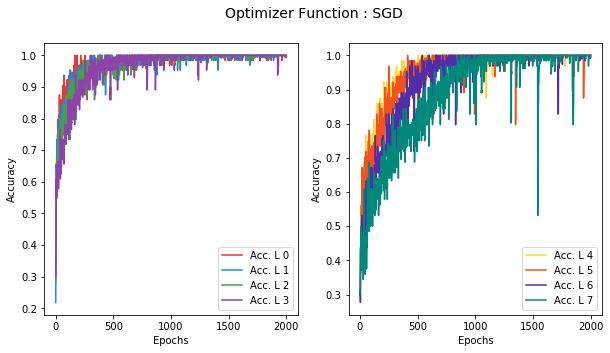

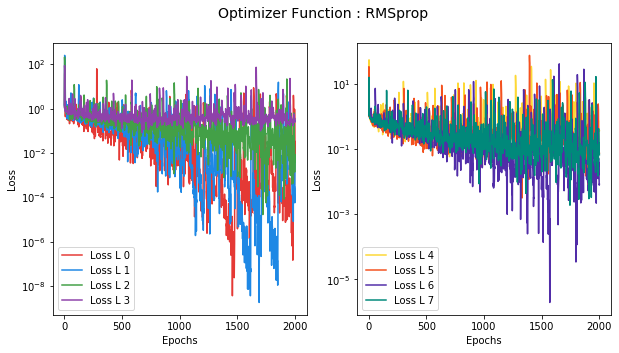

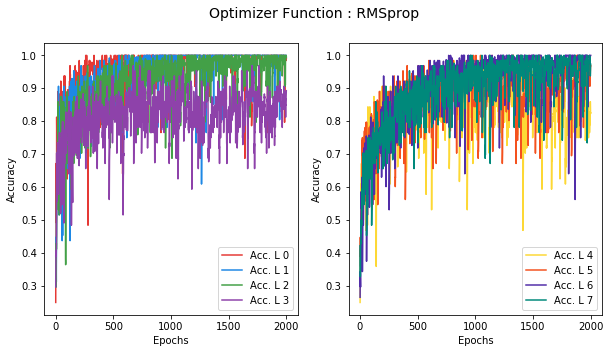

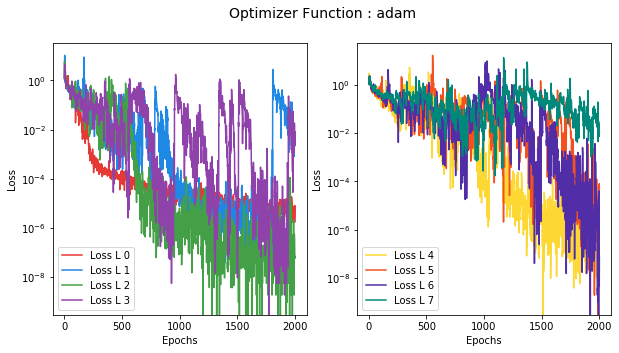

...

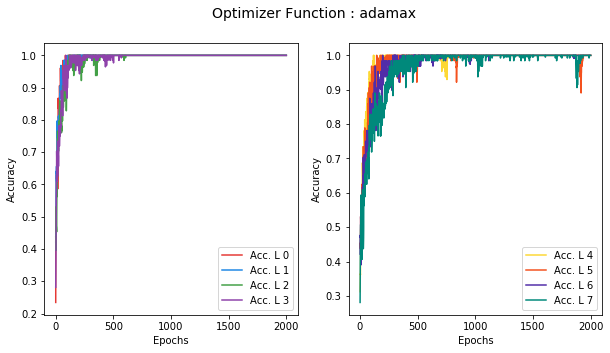

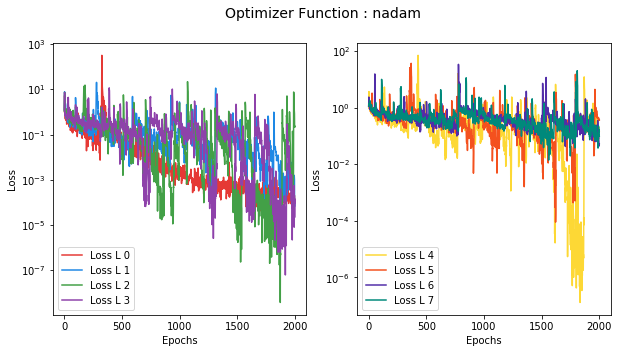

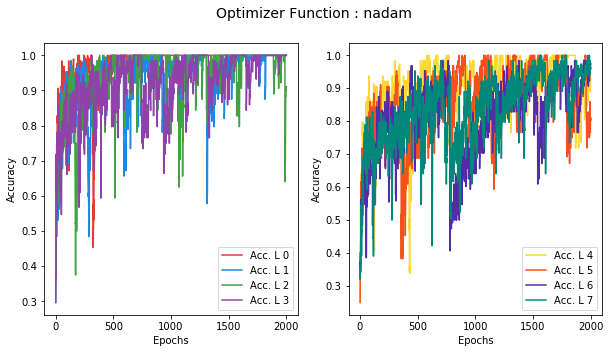

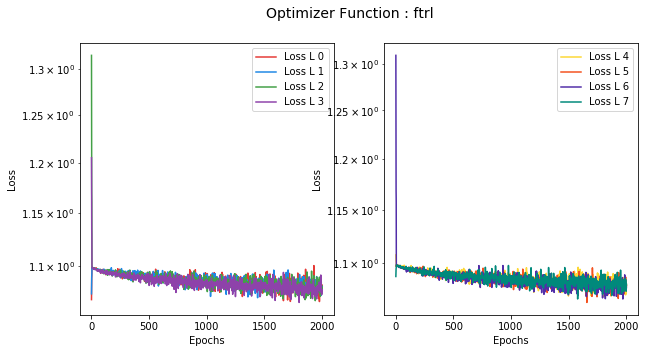

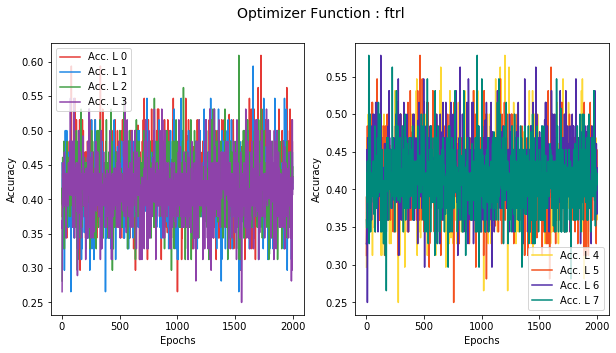

In [62]:
for i, opt_fun in enumerate(optimizers):
    fig_title = 'Optimizer Function : {}'.format(opt_fun)
    plot_test(losses_all_6[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_6[i], 'acc', plot_type='lin', fig_title=fig_title)

In [63]:
scores = np.array(score_test_all_6)
df_scores = pd.DataFrame(scores, columns=['Opt.-Func.', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_opts_Dropout.csv')
df_scores.head(50)

,Opt.-Func.,Num. Layers,F1-Score,Accuracy
0,SGD,1,0.6898911040667872,0.6842105263157895
1,SGD,2,0.8386689995428823,0.8421052631578947
2,SGD,3,0.71751165352996,0.7192982456140351
3,SGD,4,0.7714444213300049,0.7719298245614035
4,SGD,5,0.7469077638683238,0.7368421052631579
5,SGD,6,0.728754545615809,0.7368421052631579
6,SGD,7,0.7601002506265664,0.7543859649122807
7,SGD,8,0.7394617766134794,0.7368421052631579
8,SGD,9,0.8172178100836062,0.8245614035087719
9,RMSprop,1,0.7078899873033456,0.7017543859649122


As a final test, we check the influence of the `batch_number` on the training process:

In [17]:
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save the losses at each iteration
losses_all_7 = []
acc_all_7 = []
score_test_all_7 = []

dr0, dr1 = 0.3, 0.2

batch_min = 8
batch_max = 128

nl_min = 2
nl_max = 7

# Loop in the number of layers
for batch in range(batch_min, batch_max+1, 8):
    print()
    fig_title = 'Batch Size : {}'.format(batch)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        n_half = max(int(nl/2), 1)
        if nl % 2 == 1:
            n_half += 1
        if nl == 1:
            l_d = [dr0]
        else:
            l_d = []
            for i in range(n_half):
                l_d.append(dr0)
            for i in range(n_half, nl):
                l_d.append(dr1)
        l_n = l_neurons[0:nl]
        print('Num. of neurons / layer : {}'.format(l_n))
        print('Dropout / layer : {}'.format(l_d))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelDropout(l_n, l_d, n_feat, lab_dim,
                                opt_fun='adamax',
                                loss_fun='categorical_crossentropy')
        class_nl = classEval(features_all, labels_vec, model_nl,
                             epochs=500,
                             batch_size=batch,
                             verbose=0)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_7.append([batch, nl, f1, acc])
        print('-----------------\n')
    losses_all_7.append(loss_i)
    acc_all_7.append(acc_i)


Batch Size : 8

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 8
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 8
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 8
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 8
-----------------


Num. of hidden layers : 

-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 16
-----------------


Batch Size : 24

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 24
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 24
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 24
----------

-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 32
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 32
-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 32
-----------------


Batch Size : 40

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_

-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 48
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 48
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 48
-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 48
-----------------


Batch Size : 56

-----------

-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 56
-----------------


Batch Size : 64

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
----------

-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 72
-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 72
-----------------


Batch Size : 80

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 80
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 80


-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 88
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 88
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 88
-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 88
-----------------


Batch Size : 96

-----------

-----------------


Batch Size : 104

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 104
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 104
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 104
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 104
---------------

-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 112
-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 112
-----------------


Batch Size : 120

-------------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Dropout / layer : [0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 120
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Dropout / layer : [0.3, 0.3, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size :

-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Dropout / layer : [0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 128
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 128
-----------------


Num. of hidden layers : 6
Num. of neurons / layer : [4096, 2048, 1024, 512, 256, 128]
Dropout / layer : [0.3, 0.3, 0.3, 0.2, 0.2, 0.2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 128
-----------------



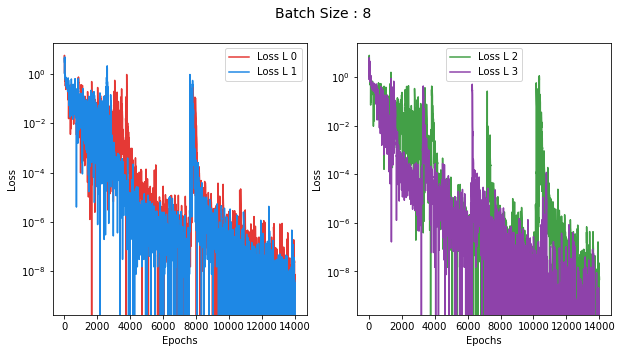

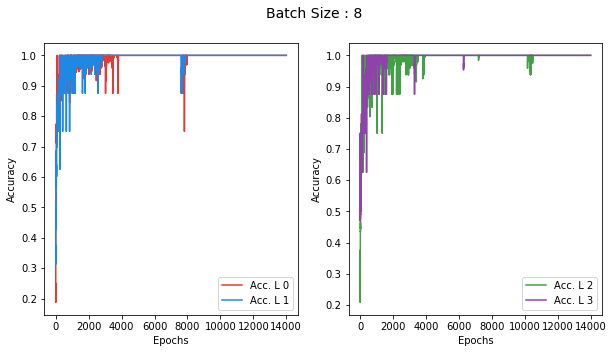

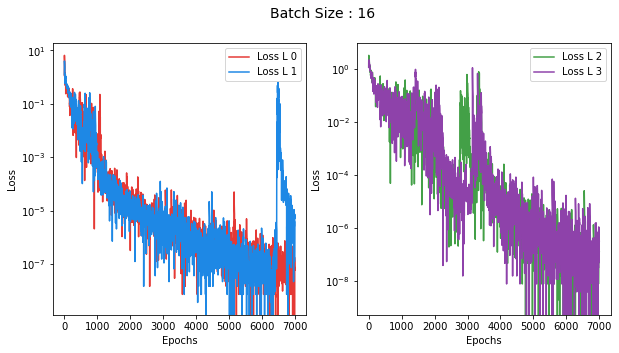

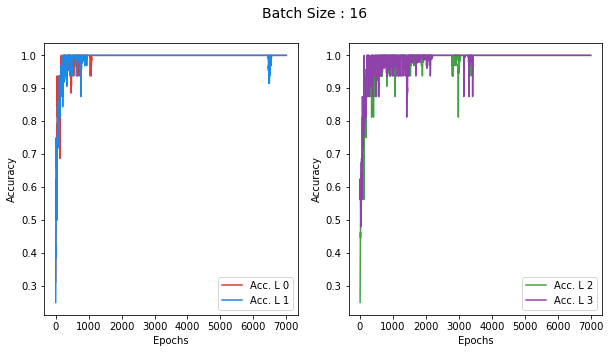

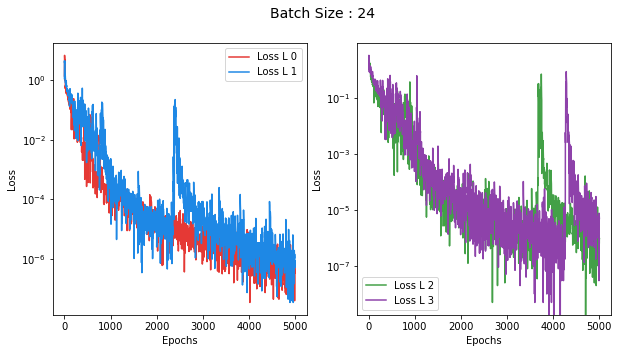

...

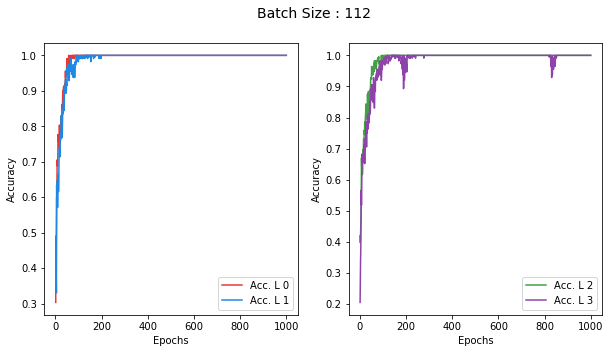

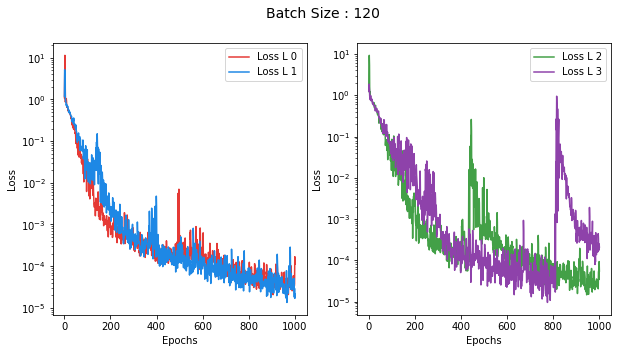

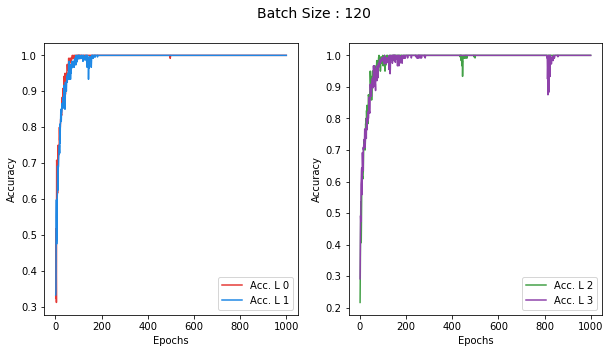

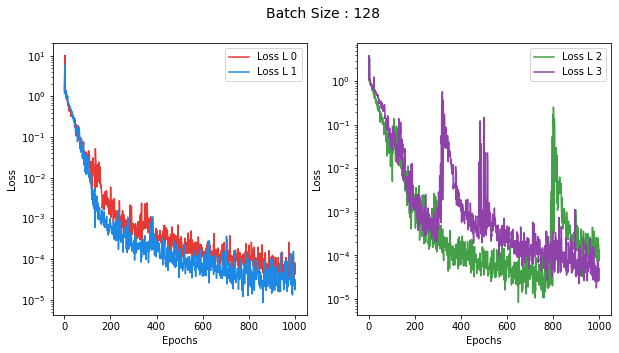

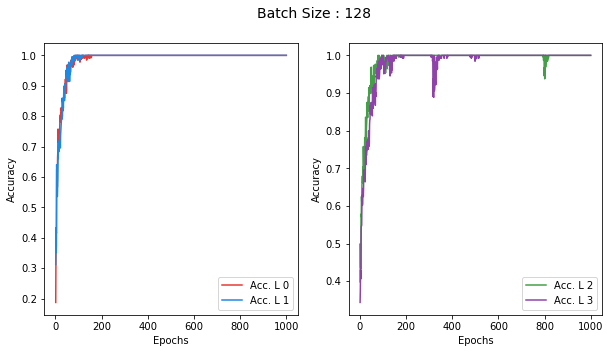

In [18]:
i = 0
for batch in range(batch_min, batch_max+1, 8):
    fig_title = 'Batch Size : {}'.format(batch)
    plot_test(losses_all_7[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_7[i], 'acc', plot_type='lin', fig_title=fig_title)
    i += 1

In [20]:
scores = np.array(score_test_all_7)
df_scores = pd.DataFrame(scores, columns=['batch_size', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(60)

,batch_size,Num. Layers,F1-Score,Accuracy
0,8.0,2.0,0.720133,0.719298
1,8.0,3.0,0.748102,0.754386
2,8.0,4.0,0.756598,0.754386
3,8.0,5.0,0.649397,0.649123
4,8.0,6.0,0.825704,0.824561
5,16.0,2.0,0.703990,0.719298
6,16.0,3.0,0.759146,0.754386
7,16.0,4.0,0.720050,0.719298
8,16.0,5.0,0.734321,0.736842
9,16.0,6.0,0.625468,0.631579


In [21]:
df_scores.to_csv('./saved/scores_batch_size.csv')

---




### 2.2 Deep Model

As a second classifier, we consider a neural network with several layers...

In [64]:
# Definition of the model

def modelDeep(l_neurons, dim_in, dim_out, opt_fun='adam', loss_fun='categorical_crossentropy'):
    nn = len(l_neurons)
    model = Sequential()
    # Input layer
    model.add(Dense(dim_in, activation='relu', input_shape=(dim_in,)))
    for i in range(nn):
        # i-th layer
        model.add(Dense(l_neurons[i], activation='relu'))
    # Output layer
    model.add(Dense(dim_out, activation='softmax'))
    # Compile model
    model.compile(loss=loss_fun,
                  optimizer=opt_fun,
                  metrics=['accuracy'])
    return model

We start now with the standar `adam` optimizer function and the `categorical_crossentropy` loss functions, to see how the Deep Model behaves with different layers, with a constant value of neurons / layer.

In [38]:
# Seed of number of neurons
neurons_seed = [n_neurons1]

# Empty lists to save losses, accuracy and the score
losses_all_0 = []
acc_all_0 = []
score_test_all_0 = []

# Num. of hidden layers
nl_min = 0
nl_max = 11

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_n = neurons_seed * nl
    print('Num. of neurons / layer : {}'.format(l_n))
    model_nl = None
    class_nl = None
    # Clear session, to start with a blank state on each loop
    tf.keras.backend.clear_session()
    model_nl = modelDeep(l_n, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_0.append(class_nl.get_loss())
    acc_all_0.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_0.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 0
Num. of neurons / layer : []
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [2048, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [2048, 2048, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [2048, 2048, 2048, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 6

-------------------------------------------


Num. of hidden layers : 9
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 10
Num. of neurons / layer : [2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



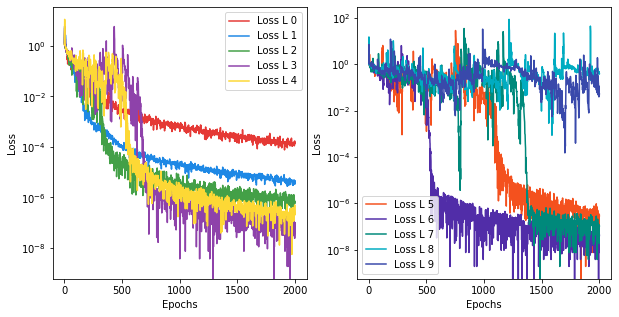

In [39]:
#Plot Loss

plot_test(losses_all_0, 'loss', plot_type='log')

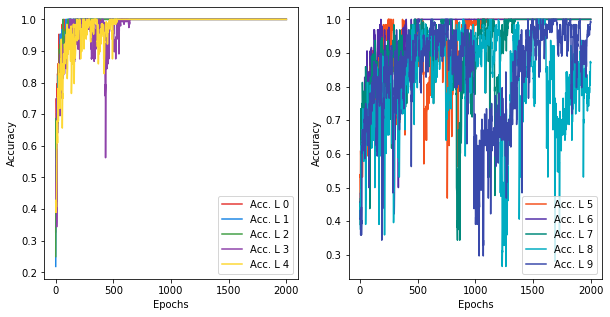

In [40]:
#Plot Loss

plot_test(acc_all_0, 'acc', plot_type='lin')

In [31]:
scores = np.array(score_test_all_0)
df_scores = pd.DataFrame(scores, columns=['num_hidden_layers', 'F1-Score', 'Accuracy'])
df_scores.head(11)

,num_hidden_layers,F1-Score,Accuracy
0,0.0,0.710759,0.701754
1,1.0,0.729825,0.719298
2,2.0,0.678031,0.684211
3,3.0,0.712880,0.701754
4,4.0,0.794754,0.807018
5,5.0,0.757822,0.754386
6,6.0,0.742697,0.736842
7,7.0,0.473588,0.543860
8,8.0,0.214968,0.385965
9,9.0,0.534861,0.526316


Now we evaluate a case with several layers, with decreasing number of neurons per layer:

In [44]:
#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save losses, accuracy and the score
losses_all_1 = []
acc_all_1 = []
score_test_all_1 = []

# Num. of hidden layers
nl_min = 1
nl_max = 10

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_n = l_neurons[0:nl]
    print('Num. of neurons / layer : {}'.format(l_n))
    model_nl = None
    class_nl = None
    # Clear session, to start with a blank state on each loop
    tf.keras.backend.clear_session()
    model_nl = modelDeep(l_n, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_1.append(class_nl.get_loss())
    acc_all_1.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_1.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epo

-------------------------------------------



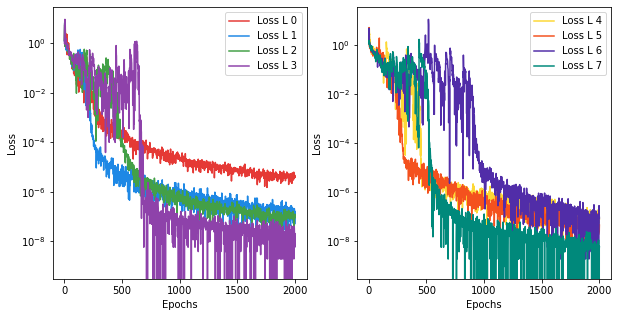

In [45]:
#Plot Loss

plot_test(losses_all_1, 'loss', plot_type='log')

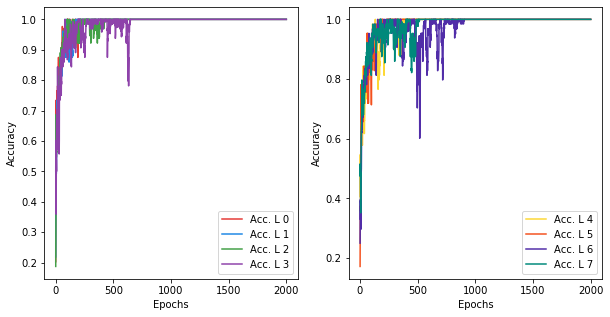

In [46]:
#Plot Loss

plot_test(acc_all_1, 'acc', plot_type='lin')

In [47]:
scores = np.array(score_test_all_1)
df_scores = pd.DataFrame(scores, columns=['num_hidden_layers', 'F1-Score', 'Accuracy'])
df_scores.head(11)

,num_hidden_layers,F1-Score,Accuracy
0,1.0,0.751834,0.754386
1,2.0,0.840610,0.842105
2,3.0,0.688647,0.684211
3,4.0,0.672101,0.684211
4,5.0,0.670029,0.684211
5,6.0,0.599729,0.614035
6,7.0,0.599833,0.596491
7,8.0,0.747354,0.736842
8,9.0,0.707061,0.701754


Now let's check how it behaves for different loss functions:

In [65]:
#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]


# Empty lists to save the losses at each iteration
losses_all_2 = []
acc_all_2 = []
score_test_all_2 = []

# Num. of hidden layers
nl_min = 1
nl_max = 10

# Losses to evaluate
losses = ["binary_crossentropy", "categorical_crossentropy", "poisson"]

# Loop in the number of layers
for loss_fun in losses:
    print()
    fig_title = 'Loss Function : {}'.format(loss_fun)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        l_n = l_neurons[0:nl]
        print('Num. of neurons / layer : {}'.format(l_n))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelDeep(l_n, n_feat, lab_dim, loss_fun=loss_fun)
        class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_2.append([loss_fun, nl, f1, acc])
        print('-----------------\n')
    losses_all_2.append(loss_i)
    acc_all_2.append(acc_i)


Loss Function : binary_crossentropy

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batc

-----------------


Loss Function : categorical_crossentropy

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size =

-----------------


Loss Function : poisson

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 50

-----------------



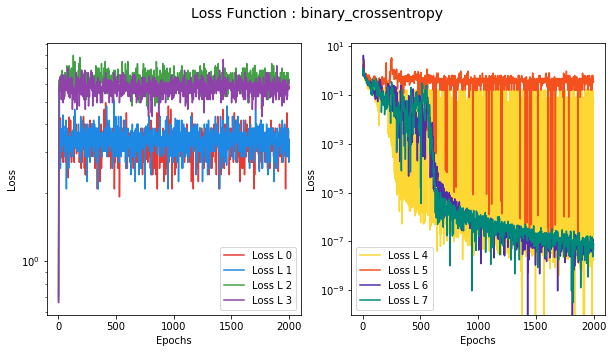

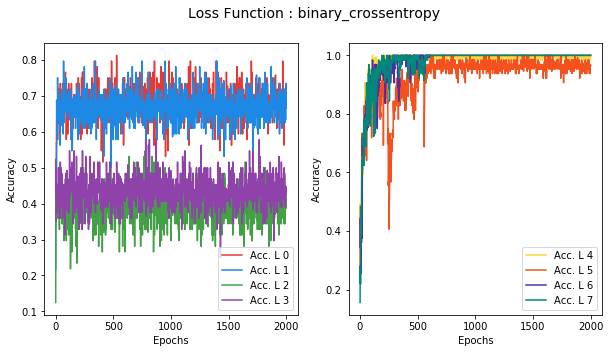

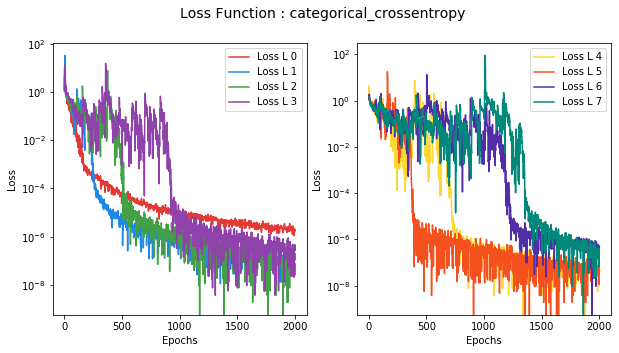

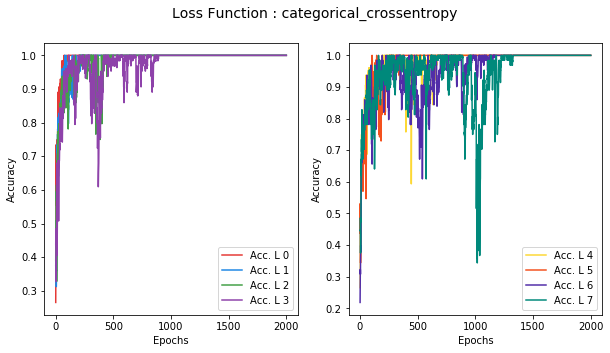

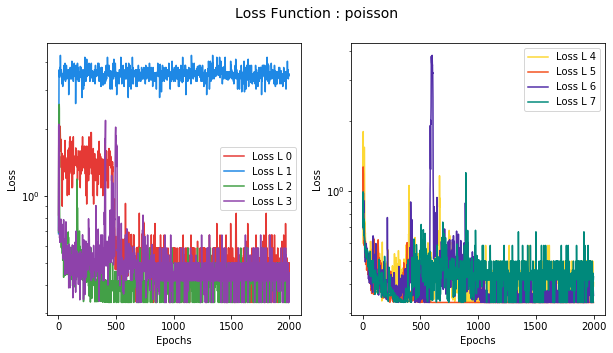

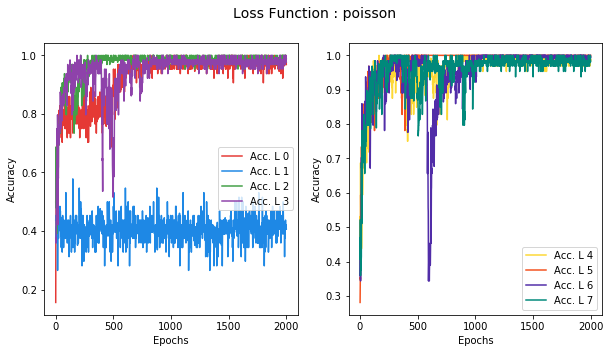

In [66]:
for i, loss_fun in enumerate(losses):
    fig_title = 'Loss Function : {}'.format(loss_fun)
    plot_test(losses_all_2[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_2[i], 'acc', plot_type='lin', fig_title=fig_title)

In [67]:
scores = np.array(score_test_all_2)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_losses_Deep.csv')
df_scores.head(40)

,Loss-Func.,Num. Layers,F1-Score,Accuracy
0,binary_crossentropy,1,0.4598695605333598,0.543859649122807
1,binary_crossentropy,2,0.4320096522794391,0.49122807017543857
2,binary_crossentropy,3,0.24951267056530213,0.42105263157894735
3,binary_crossentropy,4,0.2149677992449478,0.38596491228070173
4,binary_crossentropy,5,0.5753038356916473,0.5789473684210527
5,binary_crossentropy,6,0.6563437705264316,0.6491228070175439
6,binary_crossentropy,7,0.781015037593985,0.7894736842105263
7,binary_crossentropy,8,0.6268458213538305,0.631578947368421
8,binary_crossentropy,9,0.6403142621012877,0.6491228070175439
9,categorical_crossentropy,1,0.6252754693751924,0.6666666666666666


Now we check how the model behaves with different optimizers:

In [68]:
# List of optimizers to evaluate
optimizers = ['SGD', 'RMSprop', 'adam', 'adadelta', 'adagrad', 'adamax', 'nadam', 'ftrl']

#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]


# Empty lists to save the losses at each iteration
losses_all_3 = []
acc_all_3 = []
score_test_all_3 = []

# Num. of hidden layers
nl_min = 1
nl_max = 10

# Loop in the number of layers
for opt_fun in optimizers:
    print()
    fig_title = 'Optimizer Function : {}'.format(opt_fun)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        l_n = l_neurons[0:nl]
        print('Num. of neurons / layer : {}'.format(l_n))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelDeep(l_n, n_feat, lab_dim, opt_fun=opt_fun)
        class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_3.append([opt_fun, nl, f1, acc])
        print('-----------------\n')
    losses_all_3.append(loss_i)
    acc_all_3.append(acc_i)


Optimizer Function : SGD

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

-----------------


Optimizer Function : RMSprop

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs

-----------------


Optimizer Function : adam

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 

-----------------


Optimizer Function : adadelta

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epoch

-----------------


Optimizer Function : adagrad

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs

-----------------


Optimizer Function : adamax

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs 

-----------------


Optimizer Function : nadam

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs :

-----------------


Optimizer Function : ftrl

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [4096]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [4096, 2048]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [4096, 2048, 1024]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [4096, 2048, 1024, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [4096, 2048, 1024, 512, 256]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 

-----------------



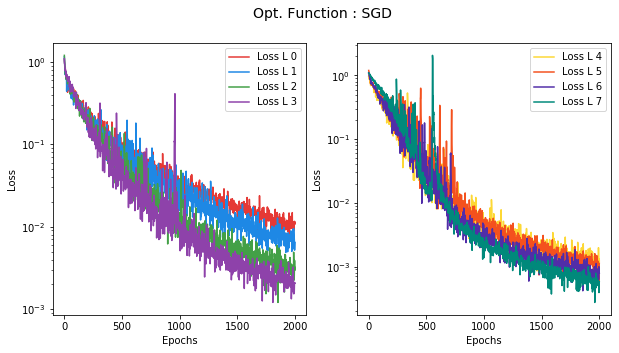

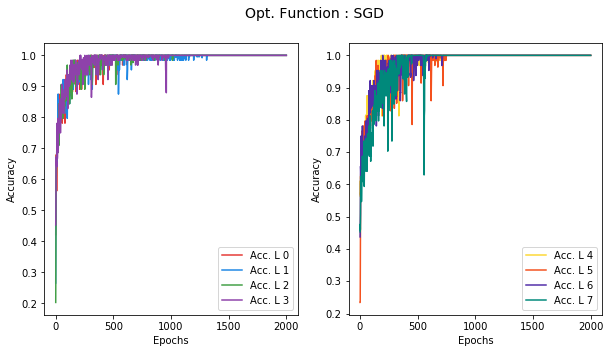

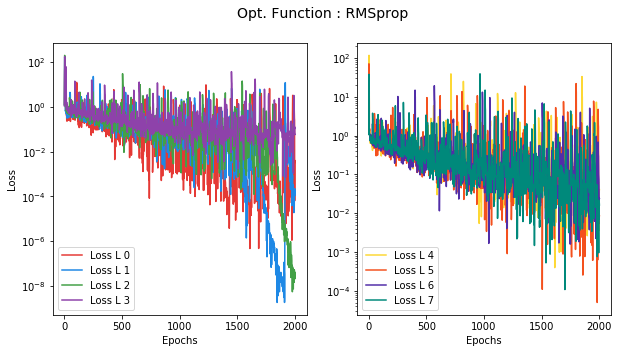

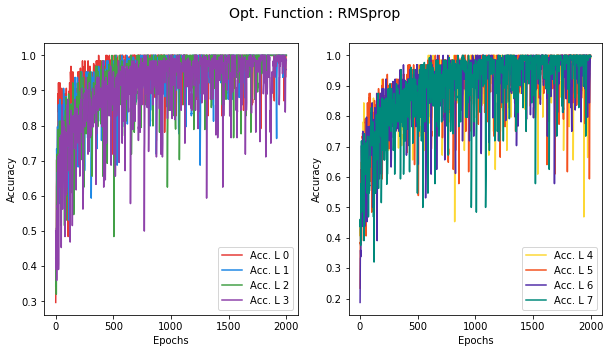

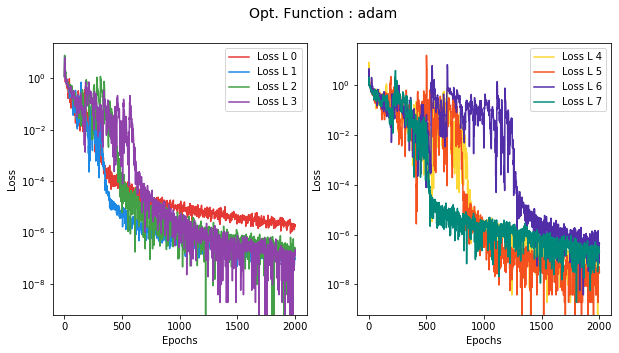

...

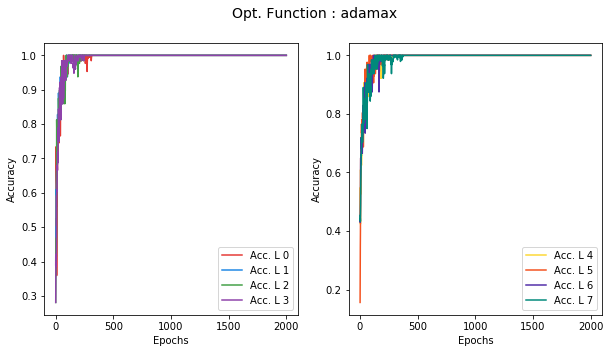

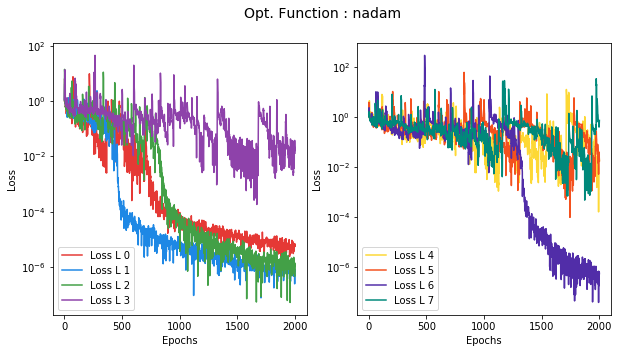

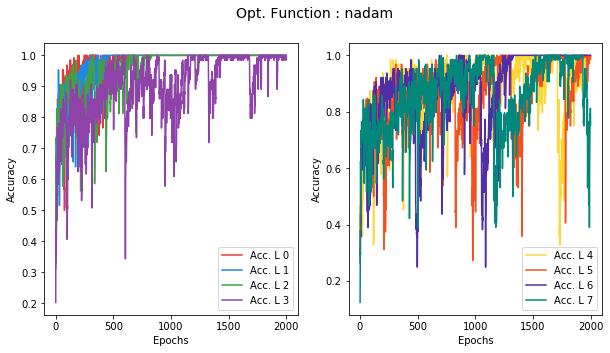

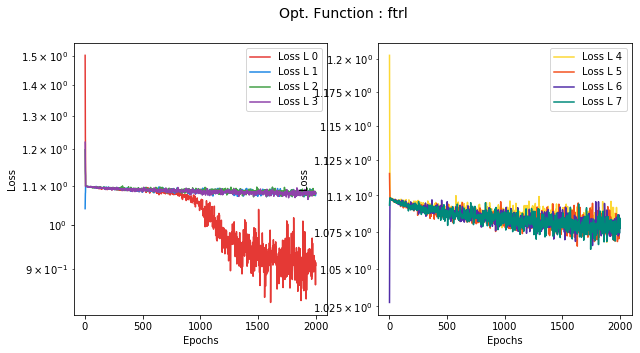

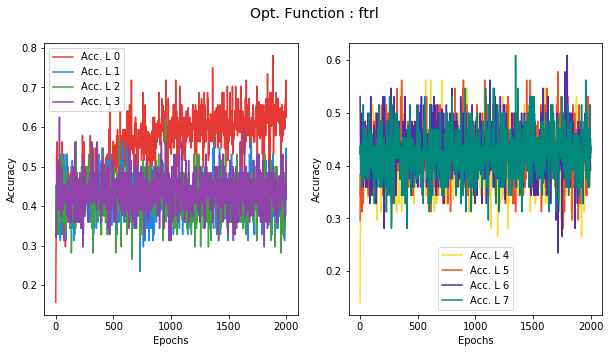

In [69]:
for i, opt_fun in enumerate(optimizers):
    fig_title = 'Opt. Function : {}'.format(opt_fun)
    plot_test(losses_all_3[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_3[i], 'acc', plot_type='lin', fig_title=fig_title)

In [70]:
scores = np.array(score_test_all_3)
df_scores = pd.DataFrame(scores, columns=['Opt.-Func.', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_opts_Deep.csv')
df_scores.head(40)

,Opt.-Func.,Num. Layers,F1-Score,Accuracy
0,SGD,1,0.7760981738233049,0.7719298245614035
1,SGD,2,0.7054834625152787,0.7192982456140351
2,SGD,3,0.68052999631947,0.7017543859649122
3,SGD,4,0.7848387992432314,0.8070175438596491
4,SGD,5,0.6821032720515033,0.7017543859649122
5,SGD,6,0.6775491456445707,0.7017543859649122
6,SGD,7,0.7223115999553279,0.7192982456140351
7,SGD,8,0.6867336549953521,0.7017543859649122
8,SGD,9,0.7111608809257186,0.7017543859649122
9,RMSprop,1,0.6491140394714923,0.6491228070175439


---




### 2.2 Autoencoder

Now that we define an autoencoder, to help us to classify our sounds!

In [71]:
def modelAuto(l_neurons, dim_in, dim_out, opt_fun='adam', loss_fun='categorical_crossentropy'):
    nn = len(l_neurons)
    # this is our input placeholder
    input_ = Input(shape=(dim_in,))
    # "encoded" is the encoded representation of the input
    encoded = Dense(l_neurons[0], activation='relu')(input_)
    for i in range(1, nn):
        encoded = Dense(l_neurons[i], activation='relu')(encoded)
    encoded = Dense(dim_out, activation='sigmoid')(encoded)
    # "decoded" is the lossy reconstruction of the input
    decoded = Dense(l_neurons[-1], activation='relu')(encoded)
    for i in range(nn-2, -1, -1):
        decoded = Dense(l_neurons[i], activation='relu')(decoded)
    decoded = Dense(dim_in)(decoded)
    # output layer
    output = Dense(dim_out, activation='softmax')(decoded)
    # this model maps an input to its reconstruction
    auto_mod = Model(input_, output)
    auto_mod.compile(optimizer=opt_fun, loss=loss_fun, metrics=['accuracy'])
    return auto_mod

We start with a small autoenconder, with 1 layer in both encoding and decoding layers:

In [90]:
#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save losses, accuracy and the score
losses_all_0 = []
acc_all_0 = []
score_test_all_0 = []

# Num. of hidden layers
nl_min = 1
nl_max = 10

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_n = l_neurons[-nl:]
    print('Num. of neurons / layer : {}'.format(l_n))
    model_nl = None
    class_nl = None
    # Clear session, to start with a blank state on each loop
    tf.keras.backend.clear_session()
    model_nl = modelAuto(l_n, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_0.append(class_nl.get_loss())
    acc_all_0.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_0.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 

-------------------------------------------



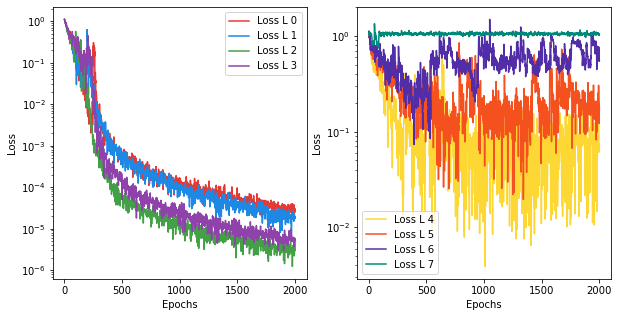

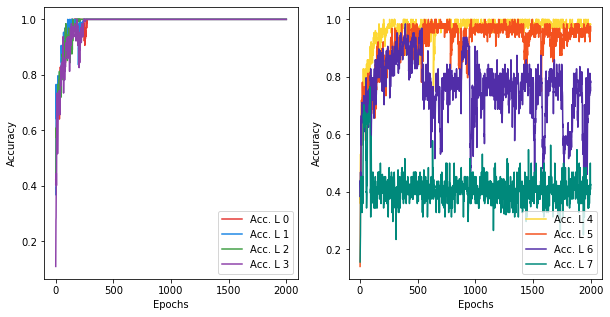

In [91]:
plot_test(losses_all_0, 'loss', plot_type='log')
plot_test(acc_all_0, 'acc', plot_type='lin')

In [92]:
scores = np.array(score_test_all_0)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.723282,0.719298
1,2.0,0.667756,0.666667
2,3.0,0.720450,0.736842
3,4.0,0.707124,0.719298
4,5.0,0.566328,0.561404
5,6.0,0.717321,0.736842
6,7.0,0.648367,0.701754
7,8.0,0.166667,0.333333
8,9.0,0.166667,0.333333


Not bad tobe our first attemp!

Now we can check the loss functions:

In [72]:
# Losses to evaluate
losses = ["binary_crossentropy", "categorical_crossentropy", "poisson"]

#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save losses, accuracy and the score
losses_all_1 = []
acc_all_1 = []
score_test_all_1 = []

# Num. of hidden layers
nl_min = 1
nl_max = 10

# Loop in the number of layers
for loss_fun in losses:
    print()
    fig_title = 'Loss Function : {}'.format(loss_fun)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        l_n = l_neurons[-nl:]
        print('Num. of neurons / layer : {}'.format(l_n))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelAuto(l_n, n_feat, lab_dim, loss_fun=loss_fun)
        class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_1.append([loss_fun, nl, f1, acc])
        print('-----------------\n')
    losses_all_1.append(loss_i)
    acc_all_1.append(acc_i)


Loss Function : binary_crossentropy

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
------------

-----------------


Loss Function : categorical_crossentropy

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batc

-----------------


Loss Function : poisson

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----

-----------------



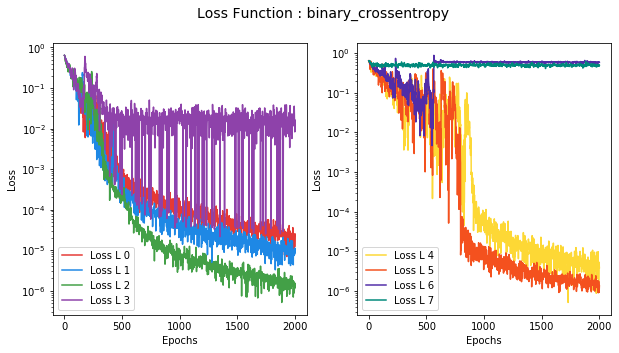

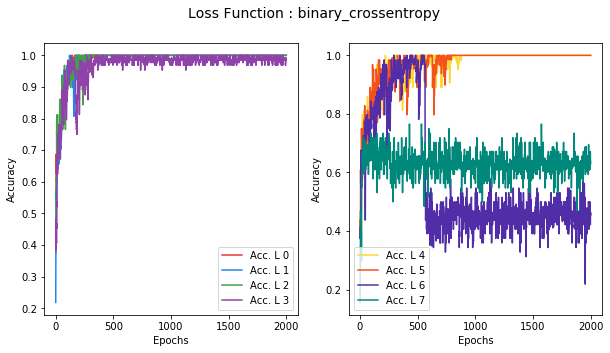

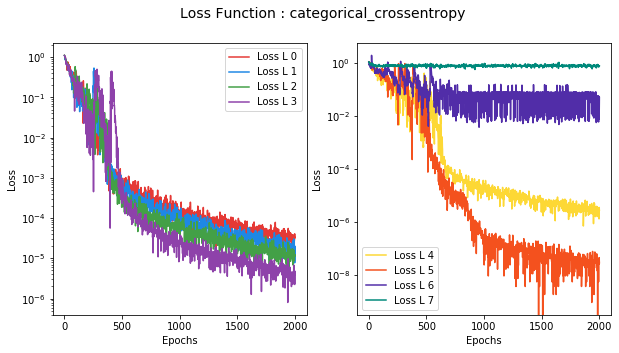

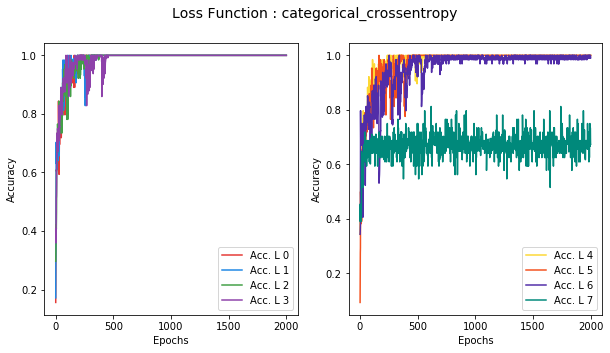

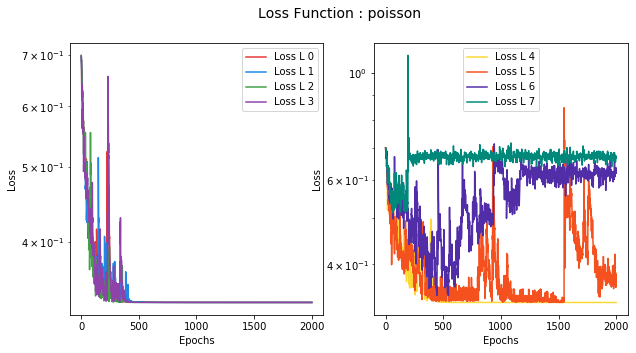

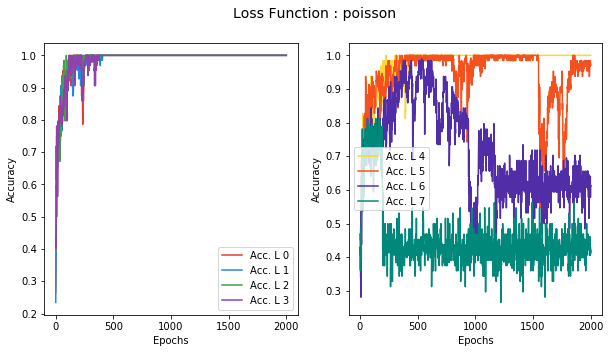

In [73]:
for i, loss_fun in enumerate(losses):
    fig_title = 'Loss Function : {}'.format(loss_fun)
    plot_test(losses_all_1[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_1[i], 'acc', plot_type='lin', fig_title=fig_title)

In [74]:
scores = np.array(score_test_all_1)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_losses_Autoencoder.csv')
df_scores.head(40)

,Loss-Func.,Num. Layers,F1-Score,Accuracy
0,binary_crossentropy,1,0.5888675805573312,0.6140350877192983
1,binary_crossentropy,2,0.7318366032368018,0.7368421052631579
2,binary_crossentropy,3,0.7711926876013563,0.7543859649122807
3,binary_crossentropy,4,0.7403576037257911,0.7368421052631579
4,binary_crossentropy,5,0.7141998442959825,0.7192982456140351
5,binary_crossentropy,6,0.6779949874686717,0.6842105263157895
6,binary_crossentropy,7,0.2149677992449478,0.38596491228070173
7,binary_crossentropy,8,0.487350622934147,0.5614035087719298
8,binary_crossentropy,9,0.6268195741879952,0.6666666666666666
9,categorical_crossentropy,1,0.7886186053368717,0.7894736842105263


In [75]:
# List of optimizers
optimizers = ['SGD', 'RMSprop', 'adam', 'adadelta', 'adagrad', 'adamax', 'nadam', 'ftrl']

#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Empty lists to save losses, accuracy and the score
losses_all_2 = []
acc_all_2 = []
score_test_all_2 = []

# Num. of hidden layers
nl_min = 1
nl_max = 10

# Loop in the number of layers
for opt_fun in optimizers:
    print()
    fig_title = 'Optimizer Function : {}'.format(opt_fun)
    print(fig_title)
    print('\n-------------------------------------------------\n')
    loss_i, acc_i = [], []
    for nl in range(nl_min, nl_max):
        print('\nNum. of hidden layers : {}'.format(nl))
        l_n = l_neurons[-nl:]
        print('Num. of neurons / layer : {}'.format(l_n))
        model_nl = None
        class_nl = None
        # Clear session, to start with a blank state on each loop
        tf.keras.backend.clear_session()
        model_nl = modelAuto(l_n, n_feat, lab_dim, opt_fun=opt_fun)
        class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_2.append([loss_fun, nl, f1, acc])
        print('-----------------\n')
    losses_all_2.append(loss_i)
    acc_all_2.append(acc_i)


Optimizer Function : SGD

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num

-----------------


Optimizer Function : RMSprop

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64


-----------------


Optimizer Function : adam

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
---

-----------------


Optimizer Function : adadelta

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

-----------------


Optimizer Function : adagrad

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64


-----------------


Optimizer Function : adamax

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-

-----------------


Optimizer Function : nadam

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
--

-----------------


Optimizer Function : ftrl

-------------------------------------------------


Num. of hidden layers : 1
Num. of neurons / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 2
Num. of neurons / layer : [32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 3
Num. of neurons / layer : [64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 4
Num. of neurons / layer : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-----------------


Num. of hidden layers : 5
Num. of neurons / layer : [256, 128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
---

-----------------



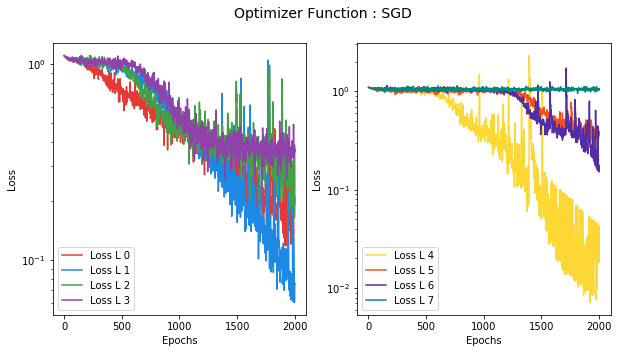

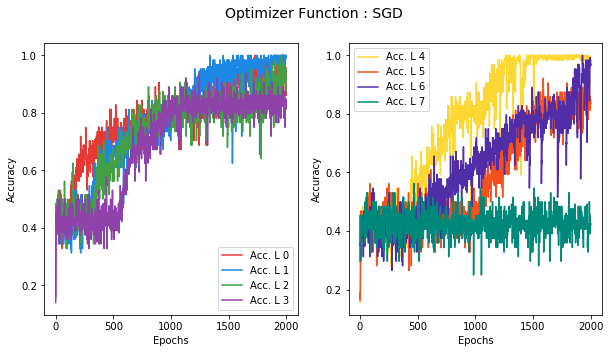

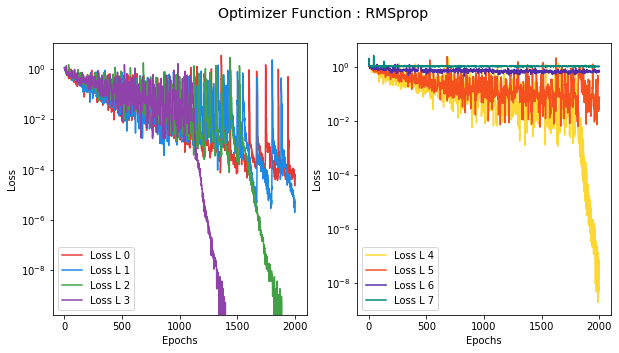

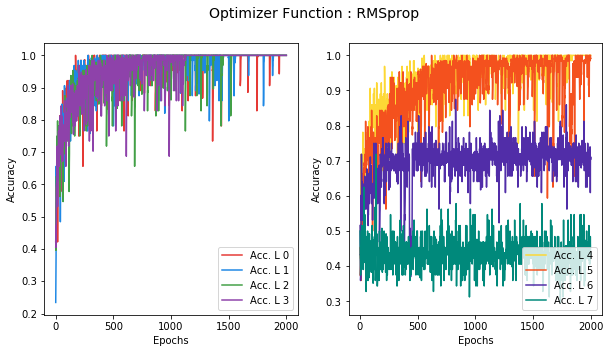

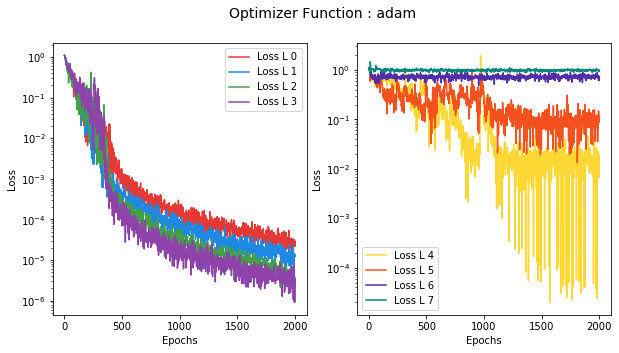

...

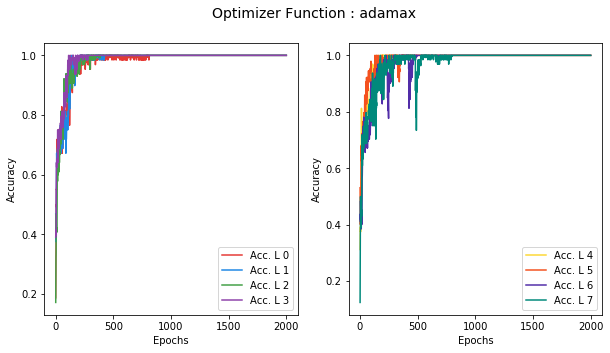

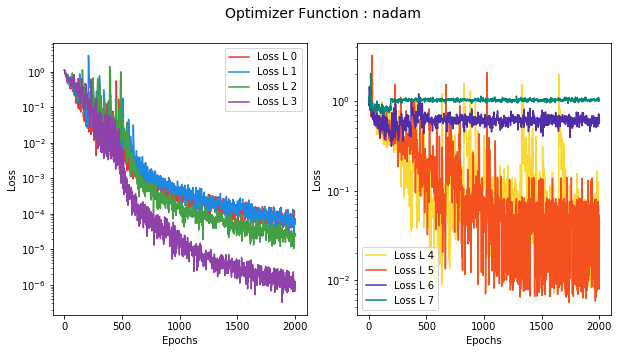

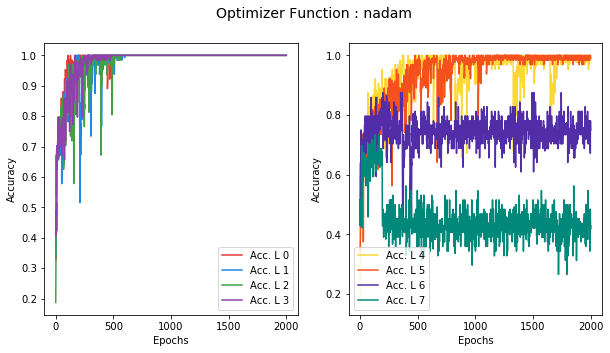

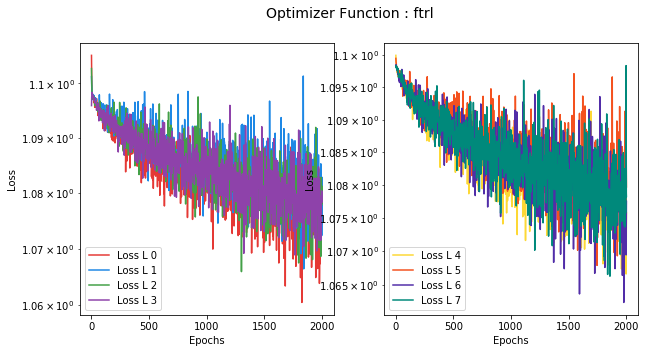

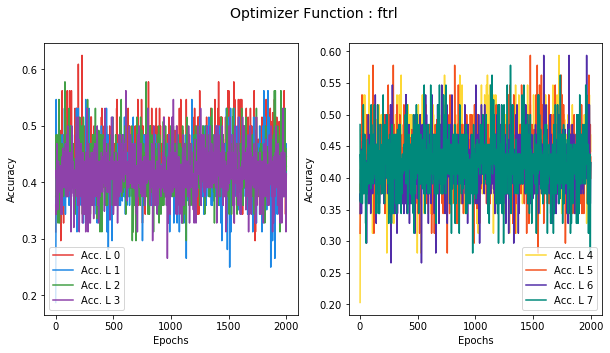

In [76]:
for i, opt_fun in enumerate(optimizers):
    fig_title = 'Optimizer Function : {}'.format(opt_fun)
    plot_test(losses_all_2[i], 'loss', plot_type='log', fig_title=fig_title)
    plot_test(acc_all_2[i], 'acc', plot_type='lin', fig_title=fig_title)

In [77]:
scores = np.array(score_test_all_2)
df_scores = pd.DataFrame(scores, columns=['Opt.-Func.', 'Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_opts_Autoencoder.csv')
df_scores.head(40)

,Opt.-Func.,Num. Layers,F1-Score,Accuracy
0,poisson,1,0.6705621195846759,0.6842105263157895
1,poisson,2,0.7898389384313497,0.7894736842105263
2,poisson,3,0.6365104135000573,0.6842105263157895
3,poisson,4,0.5670834173556495,0.6491228070175439
4,poisson,5,0.7086711995299252,0.7017543859649122
5,poisson,6,0.5936507936507937,0.6666666666666666
6,poisson,7,0.7079664974401816,0.7017543859649122
7,poisson,8,0.26743688489516476,0.43859649122807015
8,poisson,9,0.5009197412134988,0.5087719298245614
9,poisson,1,0.7153595700964122,0.7017543859649122


---




### 2.3 1D - Convolutional Neural Network

We try now a CNN as a classifier. We will use a 1D convolutional layer...

We start defining the model:

In [107]:
def modelCNN_1D(l_filters, dim_in, dim_out, l_kernels=None, opt_fun='adam', loss_fun='categorical_crossentropy'):
    # size of the input list
    nn = len(l_filters)
    input_ = Input((dim_in, 1))
    if l_kernels == None:
        l_kernels = [5] * nn
    # 1st Conv. Layer + Input
    x = Conv1D(l_filters[0], l_kernels[0], activation='relu')(input_)
    # 1st Pooling Layer
    x = MaxPooling1D(l_kernels[0])(x)
    for i in range(1, nn):
        # i-th Convolutional Layer
        x = Conv1D(l_filters[i], l_kernels[i], activation='relu')(x)
        # i-th Pooling layer
        x = MaxPooling1D(l_kernels[i])(x)
    x = GlobalMaxPooling1D()(x)
    x = Dense(l_filters[-1], activation='relu')(x)
    # Output layer
    output = Dense(dim_out, activation='softmax')(x)
    # Compile model
    model = Model(input_, output)
    model.compile(loss=loss_fun,
                  optimizer=opt_fun,
                  metrics=['accuracy'])
    return model

We start with one convolutional layer (1 `Conv1D` + 1 `MaxPooling1D`), and with a small number of filters (16). The kernels are to 5.

In [100]:
l_neurons

[4096, 2048, 1024, 512, 256, 128, 64, 32, 16]

In [112]:
# Empty lists to save the losses at each iteration
losses_all_0 = []
acc_all_0 = []
score_test_all_0 = []

nl_min = 1
nl_max = 5

# To set the number of filters per layer
filters_seed = [n_neurons8]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    print('Num. of filters / layer : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_0.append(class_nl.get_loss())
    acc_all_0.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_0.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [16, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [16, 16, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [16, 16, 16, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



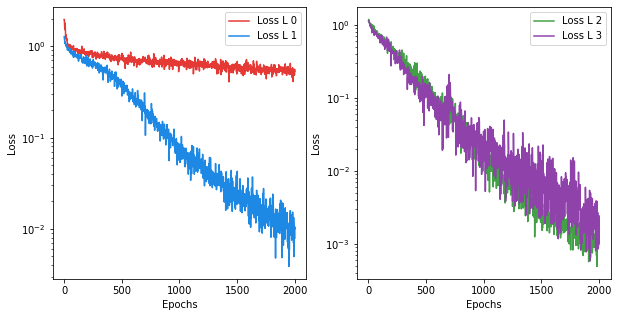

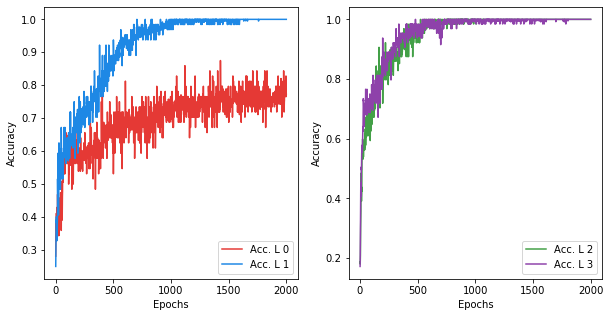

In [113]:
plot_test(losses_all_0, 'loss', plot_type='log')
plot_test(acc_all_0, 'acc', plot_type='lin')

In [114]:
scores = np.array(score_test_all_0)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.681141,0.684211
1,2.0,0.703601,0.684211
2,3.0,0.681836,0.684211
3,4.0,0.620424,0.631579


Not the best model, need mucho more layers, and maybe filters and kernels!

We move now to 32 fliters, using different number of Conv. layers (`Conv1D` + `MaxPooling1D`, from 1 to  4.

In [162]:
# Empty lists to save the losses at each iteration
losses_all_1 = []
acc_all_1 = []
score_test_all_1 = []

nl_min = 1
nl_max = 5

# To set the number of filters per layer
filters_seed = [n_neurons7]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    print('Num. of filters / layer : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_1.append(class_nl.get_loss())
    acc_all_1.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_1.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [32, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [32, 32, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [32, 32, 32, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



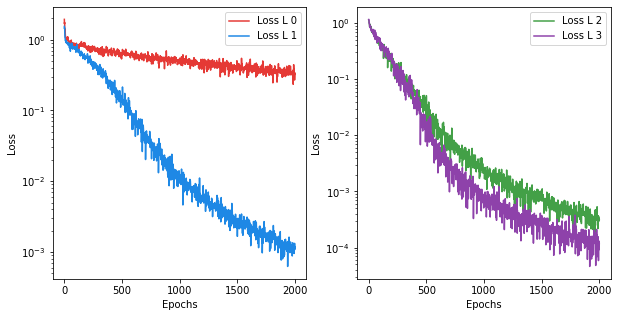

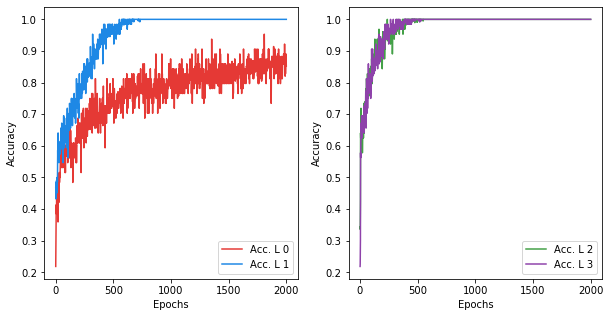

In [163]:
plot_test(losses_all_1, 'loss', plot_type='log')
plot_test(acc_all_1, 'acc', plot_type='lin')

In [164]:
scores = np.array(score_test_all_1)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.634731,0.631579
1,2.0,0.586107,0.614035
2,3.0,0.658412,0.666667
3,4.0,0.658617,0.666667


We see small improvements, but we can do better. Now we use 64 filters, with different Conv. layers:

In [122]:
# Empty lists to save the losses at each iteration
losses_all_2 = []
acc_all_2 = []
score_test_all_2 = []

nl_min = 1
nl_max = 5

# To set the number of filters per layer
filters_seed = [n_neurons6]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    print('Num. of filters / layer : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_2.append(class_nl.get_loss())
    acc_all_2.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_2.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [64, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [64, 64, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [64, 64, 64, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



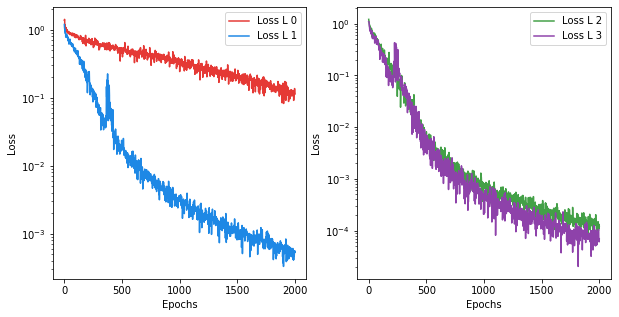

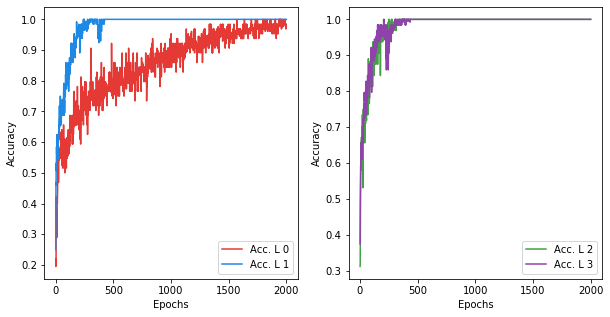

In [123]:
plot_test(losses_all_2, 'loss', plot_type='log')
plot_test(acc_all_2, 'acc', plot_type='lin')

In [124]:
scores = np.array(score_test_all_2)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.640226,0.649123
1,2.0,0.605062,0.614035
2,3.0,0.814654,0.807018
3,4.0,0.618512,0.631579


Much better! Now, what will happen with 512 filters?

In [125]:
# Empty lists to save the losses at each iteration
losses_all_3 = []
acc_all_3 = []
score_test_all_3 = []

nl_min = 1
nl_max = 5

# To set the number of filters per layer
filters_seed = [n_neurons3]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    print('Num. of filters / layer : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_3.append(class_nl.get_loss())
    acc_all_3.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_3.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [512, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [512, 512, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [512, 512, 512, 512]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



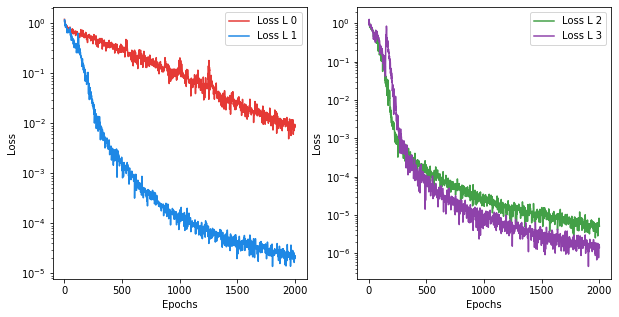

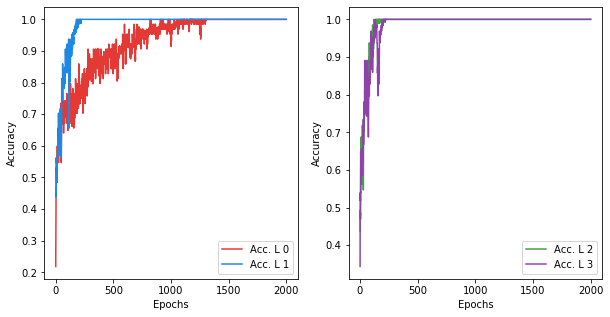

In [126]:
plot_test(losses_all_3, 'loss', plot_type='log')
plot_test(acc_all_3, 'acc', plot_type='lin')

In [128]:
scores = np.array(score_test_all_3)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.700808,0.701754
1,2.0,0.720999,0.701754
2,3.0,0.737079,0.736842
3,4.0,0.767028,0.771930


Relative large improvements in the scores, and also the losses decay faster, particularly using 4 Conv. layers.

Now, let's explore different sets of kernels (from 6 to 3), with different numbers of layers:

In [130]:
# Empty lists to save the losses at each iteration
losses_all_4 = []
acc_all_4 = []
score_test_all_4 = []

nl_min = 1
nl_max = 5

# To set the number of filters and kernels per layer
filters_seed = [n_neurons3]
l_kernels = [6, 5, 4, 3]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    l_k = l_kernels[0:nl]
    print('Num. of filters / layer : {}'.format(l_f))
    print('Num. of kernels / layer : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim, l_kernels=l_k)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_4.append(class_nl.get_loss())
    acc_all_4.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_4.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [512]
Num. of kernels / layer : [6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [512, 512]
Num. of kernels / layer : [6, 5]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [512, 512, 512]
Num. of kernels / layer : [6, 5, 4]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [6, 5, 4, 3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



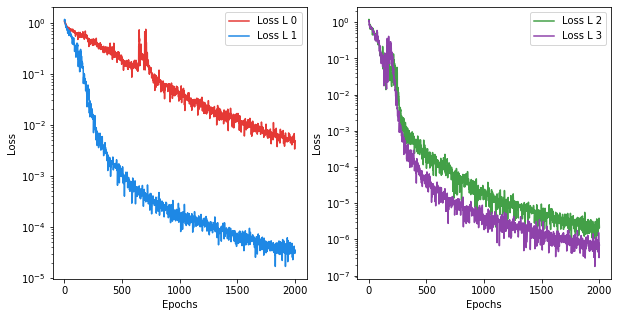

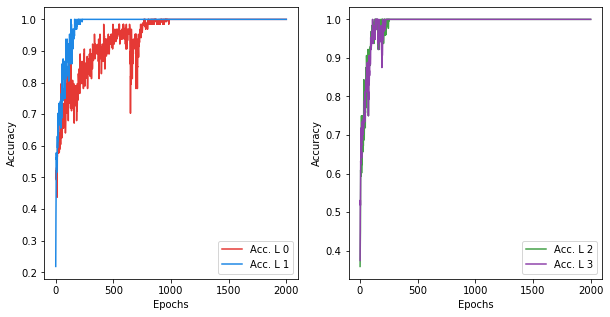

In [132]:
plot_test(losses_all_4, 'loss', plot_type='log')
plot_test(acc_all_4, 'acc', plot_type='lin')

In [133]:
scores = np.array(score_test_all_4)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.693536,0.684211
1,2.0,0.691801,0.719298
2,3.0,0.780964,0.771930
3,4.0,0.681519,0.684211


Which is an improvement! (We use more filters as before).

Now, for other set of kernels, from 5 to 2:

In [134]:
# Empty lists to save the losses at each iteration
losses_all_5 = []
acc_all_5 = []
score_test_all_5 = []

nl_min = 1
nl_max = 5

# To set the number of filters and kernels per layer
filters_seed = [n_neurons3]
l_kernels = [5, 4, 3, 2]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    l_k = l_kernels[0:nl]
    print('Num. of filters / layer : {}'.format(l_f))
    print('Num. of kernels / layer : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim, l_kernels=l_k)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_5.append(class_nl.get_loss())
    acc_all_5.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_5.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [512]
Num. of kernels / layer : [5]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [512, 512]
Num. of kernels / layer : [5, 4]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [512, 512, 512]
Num. of kernels / layer : [5, 4, 3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [5, 4, 3, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



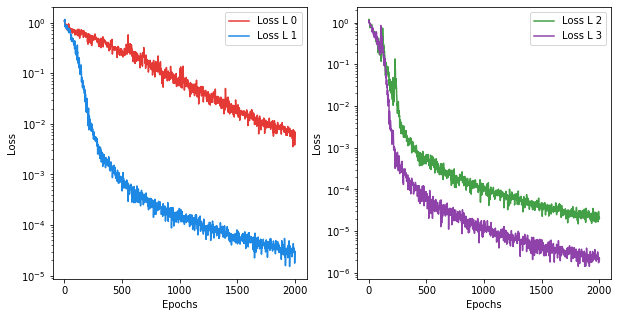

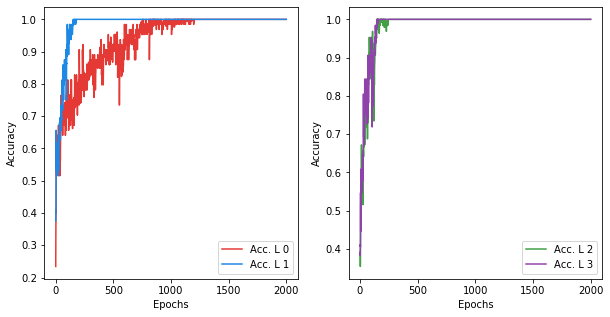

In [135]:
plot_test(losses_all_5, 'loss', plot_type='log')
plot_test(acc_all_5, 'acc', plot_type='lin')

In [136]:
scores = np.array(score_test_all_5)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.656864,0.666667
1,2.0,0.682800,0.684211
2,3.0,0.708014,0.736842
3,4.0,0.714017,0.719298


The second set of kernels did not work so well as before... Now let's check another one, increasing from 2 to 5:

In [138]:
# Empty lists to save the losses at each iteration
losses_all_6 = []
acc_all_6 = []
score_test_all_6 = []

nl_min = 1
nl_max = 5

# To set the number of filters and kernels per layer
filters_seed = [n_neurons3]
l_kernels = [2, 3, 4, 5]

# Loop in the number of layers
for nl in range(nl_min, nl_max):
    print('\nNum. of hidden layers : {}'.format(nl))
    l_f = filters_seed * nl
    l_k = l_kernels[0:nl]
    print('Num. of filters / layer : {}'.format(l_f))
    print('Num. of kernels / layer : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim, l_kernels=l_k)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_6.append(class_nl.get_loss())
    acc_all_6.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_6.append([nl, f1, acc])
    print('-------------------------------------------\n')


Num. of hidden layers : 1
Num. of filters / layer : [512]
Num. of kernels / layer : [2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 2
Num. of filters / layer : [512, 512]
Num. of kernels / layer : [2, 3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 3
Num. of filters / layer : [512, 512, 512]
Num. of kernels / layer : [2, 3, 4]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of hidden layers : 4
Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [2, 3, 4, 5]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



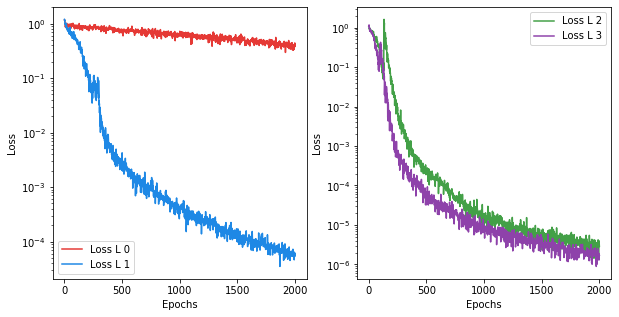

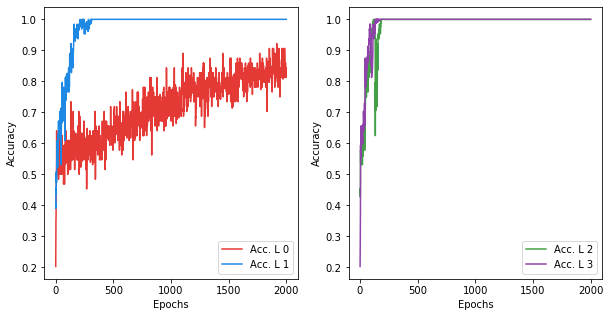

In [139]:
plot_test(losses_all_6, 'loss', plot_type='log')
plot_test(acc_all_6, 'acc', plot_type='lin')

In [140]:
scores = np.array(score_test_all_6)
df_scores = pd.DataFrame(scores, columns=['Num. Layers', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num. Layers,F1-Score,Accuracy
0,1.0,0.524190,0.526316
1,2.0,0.700596,0.701754
2,3.0,0.824391,0.824561
3,4.0,0.786775,0.771930


Mixed results, but for the result for one Conv. layers with 2 kernels is one of the worts for this kind of models.

Now, for 4 Conv. layers, let's try different set of decreasing kernels, starting with 7:

In [156]:
# Empty lists to save the losses at each iteration
losses_all_7 = []
acc_all_7 = []
score_test_all_7 = []

i_min = 0
i_max = 4

# To set the number of filters and kernels per layer
filters_seed = [n_neurons3, n_neurons3, n_neurons3, n_neurons3]
l_kernels = [7, 6, 5, 4, 3, 2, 1]

# Loop in the number of layers
for i in range(i_min, i_max):
    l_f = filters_seed
    l_k = l_kernels[i:i+4]
    print('Num. of filters / layer : {}'.format(l_f))
    print('Num. of kernels / layer : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim, l_kernels=l_k)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_7.append(class_nl.get_loss())
    acc_all_7.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_7.append([l_k[0], l_k[-1], f1, acc])
    print('-------------------------------------------\n')

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [7, 6, 5, 4]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [6, 5, 4, 3]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [5, 4, 3, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [4, 3, 2, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



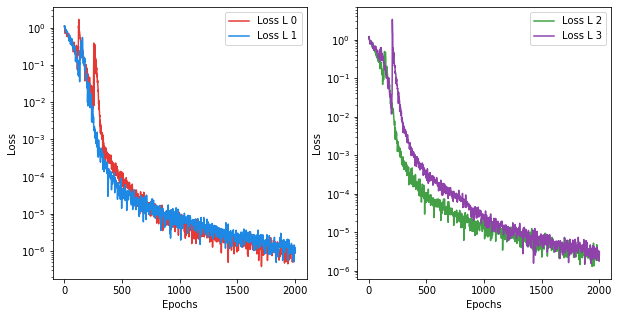

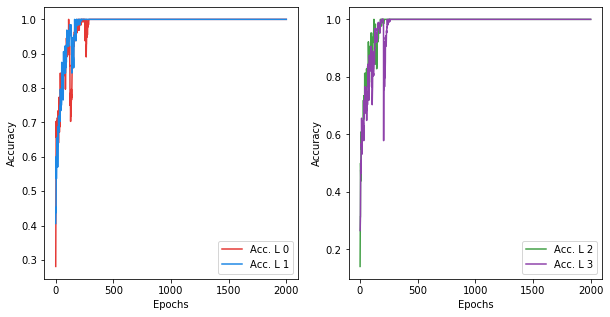

In [157]:
plot_test(losses_all_7, 'loss', plot_type='log')
plot_test(acc_all_7, 'acc', plot_type='lin')

In [158]:
scores = np.array(score_test_all_7)
df_scores = pd.DataFrame(scores, columns=['kernel_max', 'kernel_min', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_kernel_decreasing_CNN_1D.csv')
df_scores.head(10)

,kernel_max,kernel_min,F1-Score,Accuracy
0,7.0,4.0,0.811371,0.807018
1,6.0,3.0,0.683960,0.649123
2,5.0,2.0,0.699884,0.701754
3,4.0,1.0,0.727173,0.736842


For the point of the view of the lost, the set 0 (kernels: `[7, 6, 5, 4]`) behaves the best, and also it gives the best scores.

Now, we do a check similar as before, but with increasing kernels, starting with 1:

In [159]:
# Empty lists to save the losses at each iteration
losses_all_8 = []
acc_all_8 = []
score_test_all_8 = []

i_min = 0
i_max = 4

# To set the number of filters and kernels per layer
filters_seed = [n_neurons3, n_neurons3, n_neurons3, n_neurons3]
l_kernels = [1, 2, 3, 4, 5, 6, 7]

# Loop in the number of layers
for i in range(i_min, i_max):
    l_f = filters_seed
    l_k = l_kernels[i:i+4]
    print('Num. of filters / layer : {}'.format(l_f))
    print('Num. of kernels / layer : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_f, n_feat, lab_dim, l_kernels=l_k)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_8.append(class_nl.get_loss())
    acc_all_8.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_8.append([l_k[0], l_k[-1], f1, acc])
    print('-------------------------------------------\n')

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [1, 2, 3, 4]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [2, 3, 4, 5]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [3, 4, 5, 6]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Num. of filters / layer : [512, 512, 512, 512]
Num. of kernels / layer : [4, 5, 6, 7]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



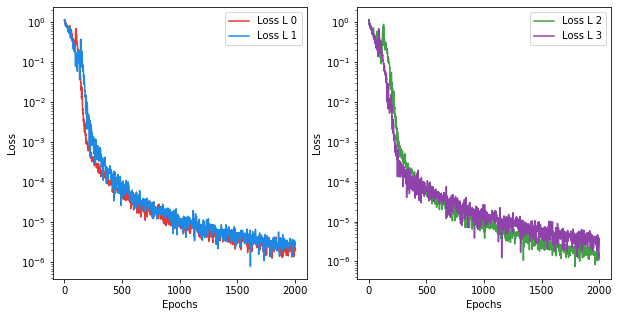

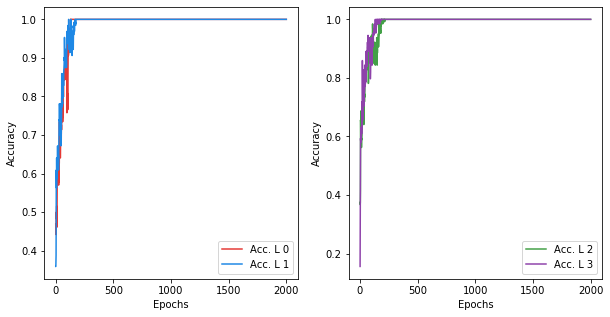

In [160]:
plot_test(losses_all_8, 'loss', plot_type='log')
plot_test(acc_all_8, 'acc', plot_type='lin')

In [161]:
scores = np.array(score_test_all_8)
df_scores = pd.DataFrame(scores, columns=['kernel_min', 'kernel_max', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_kernel_increasing_CNN_1D.csv')
df_scores.head(10)

,kernel_min,kernel_max,F1-Score,Accuracy
0,1.0,4.0,0.661914,0.666667
1,2.0,5.0,0.711612,0.719298
2,3.0,6.0,0.764575,0.771930
3,4.0,7.0,0.730238,0.736842


As before, we see the best results using relative large kernels.

Now, using 4 Conv. layers, each with `512` filters and the kernels `[7, 6, 5, 4]`, we evaluate how the model behaves for different loss functions.

In [166]:
# Losses to evaluate
losses = ["binary_crossentropy", "categorical_crossentropy", "poisson"]

# Empty lists to save the losses at each iteration
losses_all_9 = []
acc_all_9 = []
score_test_all_9 = []

# To set the number of filters and kernels per layer
l_filters = [n_neurons3, n_neurons3, n_neurons3, n_neurons3]
l_kernels = [7, 6, 5, 4]

# Loop in the losses
for loss_fun in losses:
    print('Loss Function : {}\n'.format(loss_fun))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_filters, n_feat, lab_dim, l_kernels=l_k, loss_fun=loss_fun)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_9.append(class_nl.get_loss())
    acc_all_9.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_9.append([loss_fun, f1, acc])
    print('-------------------------------------------\n')

Loss Function : binary_crossentropy

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Loss Function : categorical_crossentropy

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Loss Function : poisson

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



No handles with labels found to put in legend.


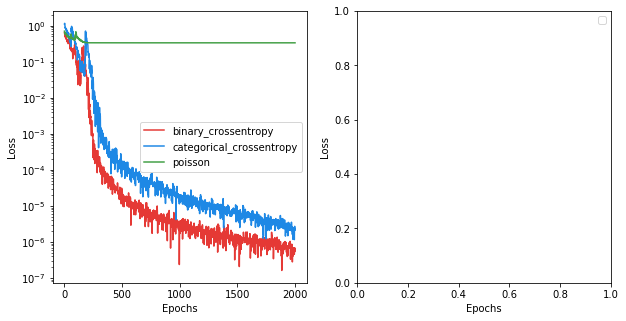

No handles with labels found to put in legend.


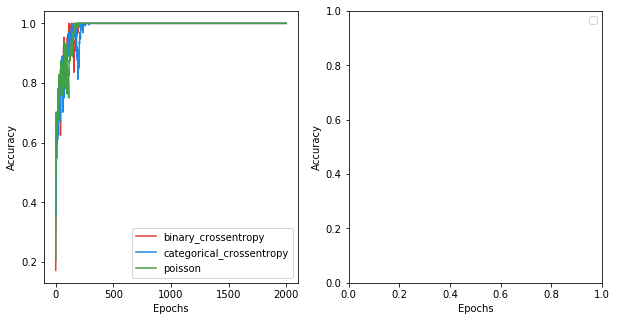

In [203]:
plot_test(losses_all_9, 'loss', plot_type='log', n_plots=1, labels=losses)
plot_test(acc_all_9, 'acc', plot_type='lin', n_plots=1, labels=losses)

In [175]:
len(losses_all_9[0])

2000

In [168]:
scores = np.array(score_test_all_9)
df_scores = pd.DataFrame(scores, columns=['loss_fun', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_losses_CNN_1D.csv')
df_scores.head(10)

,loss_fun,F1-Score,Accuracy
0,binary_crossentropy,0.830818304502515,0.8421052631578947
1,categorical_crossentropy,0.826281389748882,0.8245614035087719
2,poisson,0.8279564158623509,0.8245614035087719


And now we check different optimizers

In [169]:
# List of optimizers to evaluate
optimizers = ['SGD', 'RMSprop', 'adam', 'adadelta', 'adagrad', 'adamax', 'nadam', 'ftrl']


# Empty lists to save the losses at each iteration
losses_all_10 = []
acc_all_10 = []
score_test_all_10 = []

# To set the number of filters and kernels per layer
l_filters = [n_neurons3, n_neurons3, n_neurons3, n_neurons3]
l_kernels = [7, 6, 5, 4]

# Loop in the losses
for opt_fun in optimizers:
    print('Optimizer Function : {}\n'.format(opt_fun))
    model_nl = None
    class_nl = None
    model_nl = modelCNN_1D(l_filters, n_feat, lab_dim, l_kernels=l_k, opt_fun=opt_fun)
    class_nl = classEval(features_all, labels_vec, model_nl, epochs=500, verbose=0)
    class_nl.train()
    losses_all_10.append(class_nl.get_loss())
    acc_all_10.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_10.append([opt_fun, f1, acc])
    print('-------------------------------------------\n')

Optimizer Function : SGD

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Optimizer Function : RMSprop

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Optimizer Function : adam

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Optimizer Function : adadelta

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Optimizer Function : adagrad

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------

Optimizer Function : adamax

Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
--------------

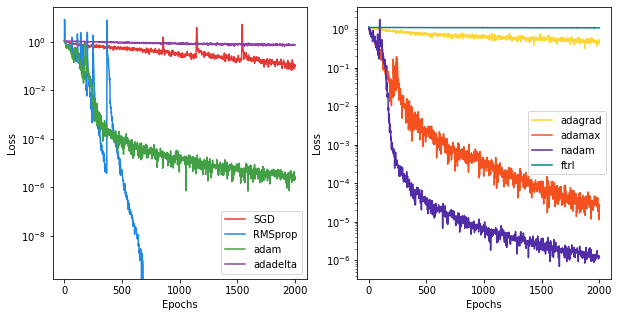

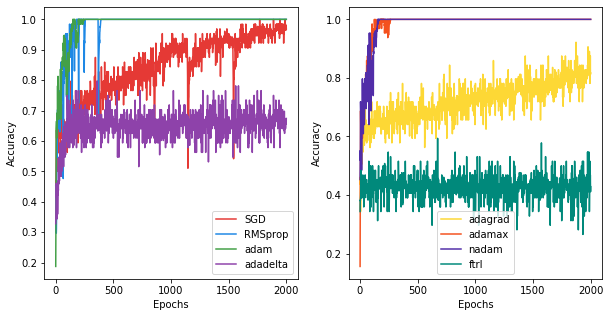

In [205]:
plot_test(losses_all_10, 'loss', plot_type='log', labels=optimizers)
plot_test(acc_all_10, 'acc', plot_type='lin', labels=optimizers)

In [112]:
scores = np.array(score_test_all_10)
df_scores = pd.DataFrame(scores, columns=['Opt.-Fun.', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_opts_CNN_1D.csv')
df_scores.head(10)

,Opt.-Fun.,F1-Score,Accuracy
0,SGD,0.755775,0.736842
1,RMSprop,0.768116,0.771930
2,adam,0.724142,0.736842
3,adadelta,0.606140,0.684211
4,adagrad,0.764989,0.771930
5,adamax,0.754494,0.736842
6,nadam,0.668875,0.666667
7,ftrl,0.249513,0.421053


In [362]:
scores_all

[['Drop-3L', 0.628962342964329, 0.631578947368421],
 ['Drop-2L', 0.6414686470677513, 0.631578947368421],
 ['Drop-4L', 0.6972328737166363, 0.6842105263157895],
 ['Drop-4L-Drop2', 0.7321655296887495, 0.7368421052631579],
 ['Drop-5L', 0.734144072301967, 0.7543859649122807],
 ['Deep-2L', 0.7368076210181472, 0.7192982456140351],
 ['Deep-3L', 0.7651362448674879, 0.7543859649122807],
 ['Deep-4L', 0.6744639376218324, 0.6666666666666666],
 ['Deep-5L', 0.5928456954959382, 0.631578947368421],
 ['Auto-1L', 0.6822312747813807, 0.6842105263157895],
 ['Auto-2L', 0.7001432151808092, 0.7017543859649122],
 ['Auto-3L', 0.769879243563454, 0.7719298245614035],
 ['Auto-4L', 0.6823185414516684, 0.7543859649122807],
 ['Auto-5L', 0.5713370183449492, 0.631578947368421],
 ['1D-CNN-1L', 0.660777336422818, 0.6666666666666666],
 ['1D-CNN-2L', 0.6355924899969221, 0.631578947368421],
 ['1D-CNN-1L', 0.601545881510499, 0.631578947368421],
 ['1D-CNN-2L', 0.7137581570611418, 0.7192982456140351],
 ['1D-CNN-3L', 0.71759702

---




### 2.4 2D - Convolutional Neural Network

We try now a CNN (2D) as a classifier...

We start defining the model:

In [11]:
def modelCNN(l_filters, n_rows, n_cols, dim_out, l_kernels=None,
             loss_fun='categorical_crossentropy', opt_fun='adam'):
    # size of the input list
    nn = len(l_filters)
    input_shape = (n_rows, n_cols, 1)
    if l_kernels == None:
        l_kernels = [2] * nn
    # Initialize model
    model = Sequential()
    # 1st Conv. Layer + Input
    nl = l_filters[0]
    nk = l_kernels[0]
    pool = (nk, nk)
    model.add(Conv2D(nl, kernel_size=pool, strides=(2, 2),
                     activation='relu', input_shape=input_shape))
    # 1st Pooling Layer
    model.add(MaxPooling2D(pool_size=pool, strides=(2, 2)))
    for i in range(1, nn):
        nl = l_filters[i]
        nk = l_kernels[i]
        pool = (nk, nk)
        #i-th Convolutional Layer
        model.add(Conv2D(nl, kernel_size=pool, activation='relu'))
        # i-th Pooling layer
        model.add(MaxPooling2D(pool_size=pool, strides=(2, 2)))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    # Output layer
    model.add(Dense(dim_out, activation='softmax'))
    # Compile model
    model.compile(loss=loss_fun,
                  optimizer=opt_fun,
                  metrics=['accuracy'])
    return model

We also define a function to try to save a bit of memory...

In [12]:
# Function to determine the Max. number of elements in an array
#  to avoid using TOO much RAM:
def max_elem(dim0, mem_val=5, ref_val=1.0):
    """
    Function to determine the number of elements on an array, to
    not exceed the specified size (in GB) in memory, once one of
    the dimentions have been specifiedt.
    dim0    : (int) One dimension of the array
    mem_val : (float, int...) Desired Max. value, in GB (5 GB by default)
    """
    # We get the memory size of one element, in bytes.
    # It can be machine/implementation dependent...
    ref_arr = np.array(ref_val)
    one_size = ref_arr.nbytes
    # We transform the Max. size from GB to B
    mem_max = mem_val * 1073741274
    # We will have now an array (dim0, dim_threshold)...
    # Total number of elements dim0 * dim_threshold will use
    # mem_val in memory...
    dim_threshold = int(mem_max / (one_size * dim0))
    print('For dim_0 : {}, Max. Num. of Elements : {}'.format(dim0, dim_threshold))
    return dim_threshold

### 2.4.1 Mel-Spectrograms

Now, for the "D-CNN model we need images. We can use the Mel-Spectrograms. So we start calculating them!

In [15]:
# Load the audio data...
try:
    del audio_data
except NameError:
    None    
audio_data = load_save('sound', 'load')

# Initialization variables to save the features:
dim_feat = 128
dim_labels = labels_vec.shape[1]
dict_mel = {}

# Set Max. dim of an array, to avoid excessively large arrays:
max_dim = max_elem(dim_feat, mem_val=10)

# Calculate the Mel-Scale Spectrograms
print(':', end='')
for ind in range(len(audio_data)):
    print('=', end='')
    ndim = audio_data[ind].shape[0]
    if ndim > max_dim:
        ndim = max_dim
    # Spectral distribution
    melspec  = melspectrogram(y=audio_data[ind][:ndim], sr=44100, n_mels=dim_feat)
    # save each spectrogram to an array...
    dict_mel[ind] = melspec

# print('\n\nFeatures shape:{}'.format(features.shape))

sound loaded
For dim_0 : 128, Max. Num. of Elements : 10485754
:=========================================================================================================================================================================================================================================================================================

Now we find the smallest spectrogram, and then we will slice all other arrays to the same shape...

In [210]:
# find smallest array...
len_min = max_dim
for i in dict_mel.keys():
    data = dict_mel[i]
    len_i = data.shape[1]
    if len_i > 500:
        len_min = min(len_min, len_i)

print('Minimal length : {}'.format(len_min))

features_mel = np.empty((0, dim_feat*len_min))
for i in dict_mel.keys():
    data = dict_mel[i]
#     print(data.shape)
    len_i = min(data.shape[1], len_min)
    tmp = np.zeros((dim_feat, len_min))
    tmp[:dim_feat,:len_i] = data[:dim_feat,:len_i]
    tmp = np.reshape(tmp, (1,dim_feat*len_min))
    features_mel = np.vstack([features_mel, tmp])

print('\n\nFeatures shape:{}'.format(features_mel.shape))

Minimal length : 256


Features shape:(281, 32768)


In [211]:
load_save('feat_mel', 'save', features_mel, file_name='features_mel_128x256_data.npy')

feat_mel saved


In [12]:
features_mel = load_save('feat_mel', 'load', file_name='features_mel_128x256_data.npy')

feat_mel loaded


In [13]:
#Full list of neurons per layer...
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8]
l_neurons

[4096, 2048, 1024, 512, 256, 128, 64, 32, 16]

We start with one convolutional layer (`Conv2D` and `MaxPooling2d`) and with different number of filters. Setting maximal number of filters to 128, because for larger numbers the machine basically crashed!

filters = `[128, 64, 32, 16]`

In [28]:
# Empty lists to save the losses at each iteration
losses_all_0 = []
acc_all_0 = []
score_test_all_0 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Loop in the number of layers
for nf in filters_seed:
    print('\nNum. of filters : {}'.format(nf))
    l_f = [nf]
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=200, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_0.append(class_nl.get_loss())
    acc_all_0.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_0.append([nf, f1, acc])
    print('-------------------------------------------\n')


Num. of filters : 128
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------


Num. of filters : 64
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------


Num. of filters : 32
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------


Num. of filters : 16
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------



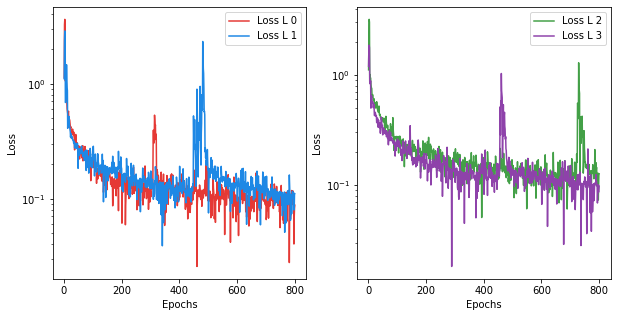

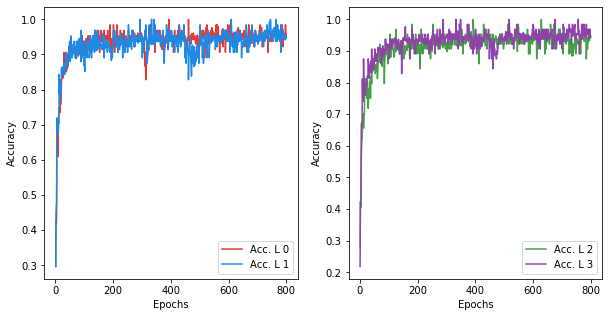

In [29]:
plot_test(losses_all_0, 'loss', plot_type='log')
plot_test(acc_all_0, 'acc', plot_type='lin')

In [30]:
scores = np.array(score_test_all_0)
df_scores = pd.DataFrame(scores, columns=['Num.-Filters', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num.-Filters,F1-Score,Accuracy
0,128.0,0.630844,0.631579
1,64.0,0.474241,0.473684
2,32.0,0.671537,0.666667
3,16.0,0.490457,0.543860


In [15]:
n_neurons9 = int(n_neurons8 / 2)
dim_feat = 128
dim_labels = labels_vec.shape[1]
len_min = 256
features_mel.shape

(281, 32768)

Test with several layers, increasing grdually the number of filters:

In [42]:
# Empty lists to save the losses at each iteration
losses_all_1 = []
acc_all_1 = []
score_test_all_1 = []

# To set the number of filters and kernels per layer
n_neurons9 = int(n_neurons8 / 2)
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]

# Loop in the number of layers
for nf in range(2, 6):
    print('\nNum. of filters : {}'.format(nf))
    l_f = filters_seed[0:nf]
    print('\nFilters : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_1.append(class_nl.get_loss())
    acc_all_1.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_1.append([nf, f1, acc])
    print('-------------------------------------------\n')


Num. of filters : 2

Filters : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 3

Filters : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 4

Filters : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 5

Filters : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



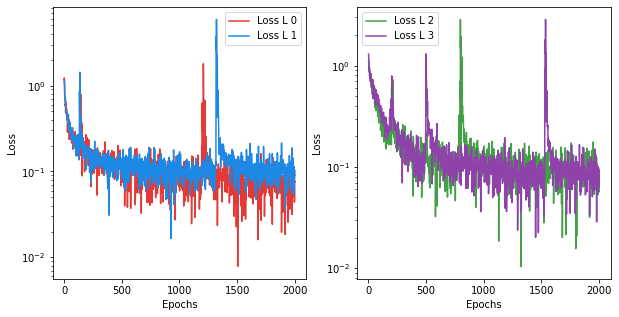

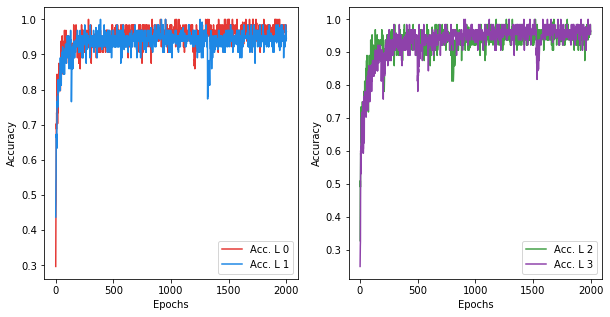

In [43]:
plot_test(losses_all_1, 'loss', plot_type='log')
plot_test(acc_all_1, 'acc', plot_type='lin')

In [44]:
scores = np.array(score_test_all_1)
df_scores = pd.DataFrame(scores, columns=['Num.-Filters', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num.-Filters,F1-Score,Accuracy
0,2.0,0.627624,0.631579
1,3.0,0.626279,0.631579
2,4.0,0.616238,0.614035
3,5.0,0.572537,0.561404


Test with several layers, decreasing the number of filters:

In [46]:
# Empty lists to save the losses at each iteration
losses_all_2 = []
acc_all_2 = []
score_test_all_2 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]

# Loop in the number of layers
for nf in range(2, 6):
    print('\nNum. of filters : {}'.format(nf))
    l_f = filters_seed[0:nf]
    print('\nFilters : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_2.append(class_nl.get_loss())
    acc_all_2.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_2.append([nf, f1, acc])
    print('-------------------------------------------\n')


Num. of filters : 2

Filters : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 3

Filters : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 4

Filters : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 5

Filters : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



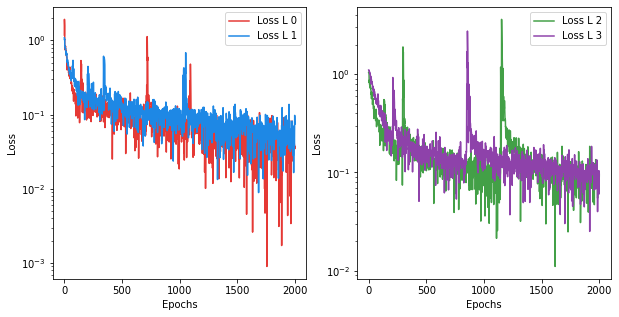

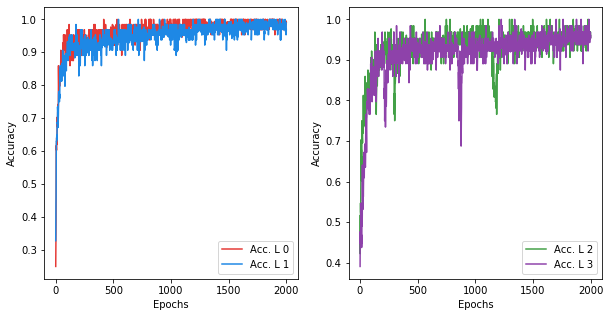

In [47]:
plot_test(losses_all_2, 'loss', plot_type='log')
plot_test(acc_all_2, 'acc', plot_type='lin')

In [48]:
scores = np.array(score_test_all_2)
df_scores = pd.DataFrame(scores, columns=['Num.-Set-Filters', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num.-Set-Filters,F1-Score,Accuracy
0,2.0,0.735812,0.736842
1,3.0,0.644164,0.649123
2,4.0,0.493637,0.508772
3,5.0,0.643859,0.631579


Now we perform a look on the lost kernels / pools, while increasing the number of filters:

In [51]:
# Empty lists to save the losses at each iteration
losses_all_3 = []
acc_all_3 = []
score_test_all_3 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]

# Loop in the number of layers
for nk in range(1, 3):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = [nk] * nf
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_3.append(class_nl.get_loss())
    acc_all_3.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_3.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



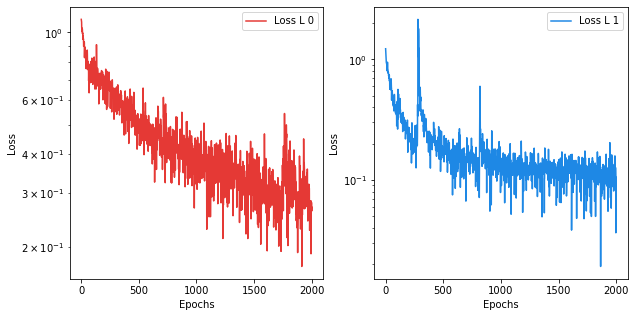

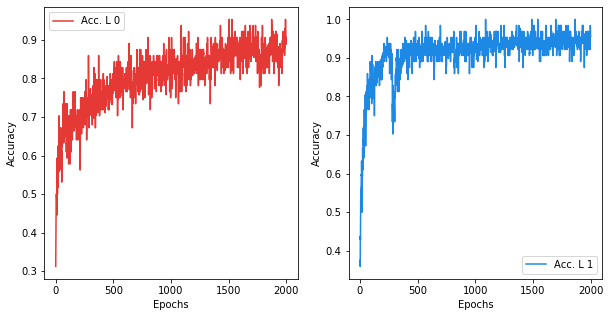

In [52]:
plot_test(losses_all_3, 'loss', plot_type='log')
plot_test(acc_all_3, 'acc', plot_type='lin')

In [53]:
scores = np.array(score_test_all_3)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_size', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_size,F1-Score,Accuracy
0,1.0,0.414400,0.403509
1,2.0,0.634405,0.631579


In [62]:
# Empty lists to save the losses at each iteration
losses_all_4 = []
acc_all_4 = []
score_test_all_4 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]

kernels_seed=[[1, 1, 1, 2, 2], [1, 1, 2, 2, 2], [2, 2, 1, 1, 1], [2, 2, 2, 1, 1]]

# Loop in the number of layers
for nk in range(4):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = kernels_seed[nk]
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_4.append(class_nl.get_loss())
    acc_all_4.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_4.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [1, 1, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



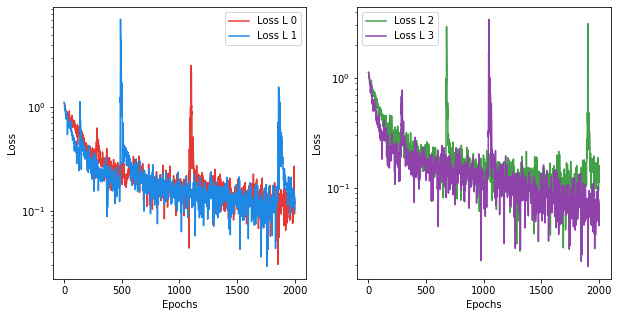

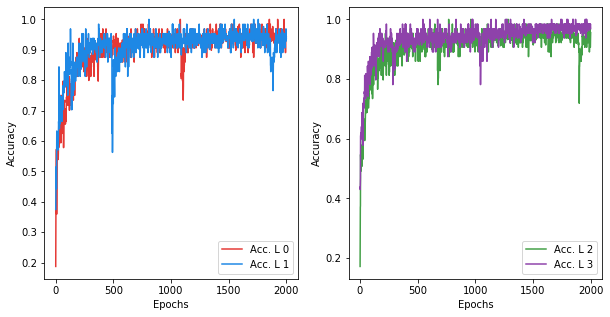

In [63]:
plot_test(losses_all_4, 'loss', plot_type='log')
plot_test(acc_all_4, 'acc', plot_type='lin')

In [64]:
scores = np.array(score_test_all_4)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_set', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_set,F1-Score,Accuracy
0,0.0,0.479278,0.526316
1,1.0,0.603360,0.614035
2,2.0,0.496317,0.491228
3,3.0,0.519737,0.526316


Now we perform a look on the lost kernels / pools, while decreasing the number of filters:

In [54]:
# Empty lists to save the losses at each iteration
losses_all_5 = []
acc_all_5 = []
score_test_all_5 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]

# Loop in the number of layers
for nk in range(1, 3):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = [nk] * nf
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_4.append(class_nl.get_loss())
    acc_all_4.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_4.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



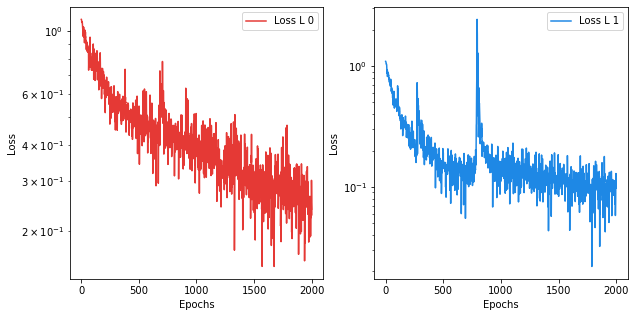

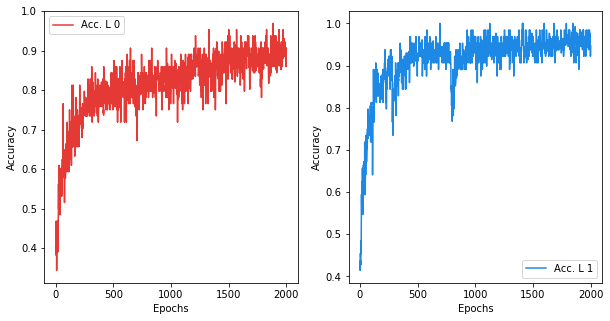

In [55]:
plot_test(losses_all_5, 'loss', plot_type='log')
plot_test(acc_all_5,acc', plot_type='lin')

In [56]:
scores = np.array(score_test_all_5)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_size', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_size,F1-Score,Accuracy
0,1.0,0.476536,0.456140
1,2.0,0.711778,0.719298


In [65]:
# Empty lists to save the losses at each iteration
losses_all_6 = []
acc_all_6 = []
score_test_all_6 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]

kernels_seed=[[1, 1, 1, 2, 2], [1, 1, 2, 2, 2], [2, 2, 1, 1, 1], [2, 2, 2, 1, 1]]

# Loop in the number of layers
for nk in range(4):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = kernels_seed[nk]
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_6.append(class_nl.get_loss())
    acc_all_6.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_6.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [1, 1, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



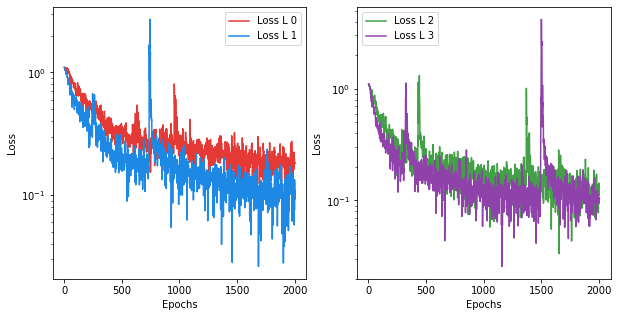

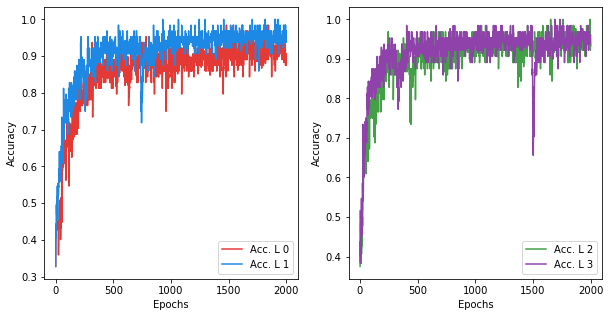

In [67]:
plot_test(losses_all_6, 'loss', plot_type='log')
plot_test(acc_all_6, 'acc', plot_type='lin')

In [68]:
scores = np.array(score_test_all_6)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_set', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_set,F1-Score,Accuracy
0,0.0,0.571165,0.578947
1,1.0,0.581617,0.578947
2,2.0,0.500744,0.526316
3,3.0,0.578947,0.578947


In [19]:
# Losses to evaluate
losses = ["binary_crossentropy", "categorical_crossentropy", "poisson"]

# Empty lists to save the losses at each iteration
losses_all_7 = []
acc_all_7 = []
score_test_all_7 = []


# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]
kernels_seed = [2]

# Loop in the number of layers
for loss in losses:
    print('\nLoss function : {}\n'.format(loss))
    loss_i, acc_i = [], []
    for nf in range (1, 6):
        l_f = filters_seed[0:nf]
        l_k = kernels_seed * nf
        print('\nNum. filters : {}'.format(nf))
        print('Filters        : {}'.format(l_f))
        model_nl = None
        class_nl = None
        model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k, loss_fun=loss)
        class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                             dim_data=2, dim0=dim_feat, dim1=len_min)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_7.append([loss, nf, f1, acc])
    losses_all_7.append(loss_i)
    acc_all_7.append(acc_i)
    print('-------------------------------------------\n')


Loss function : binary_crossentropy


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Loss function : categorical_crossentropy


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64




Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



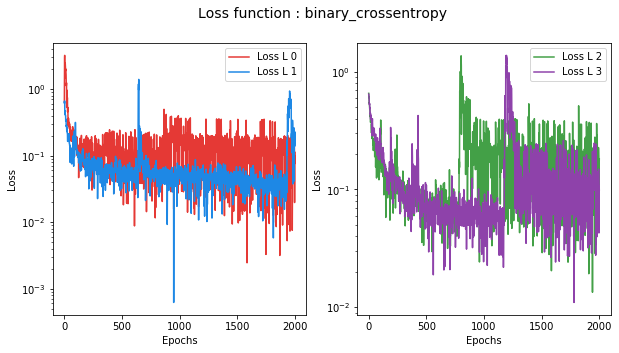

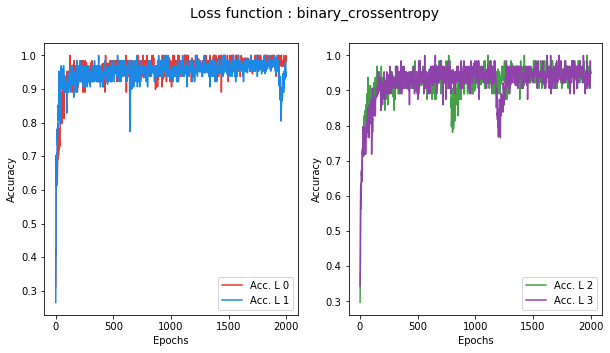

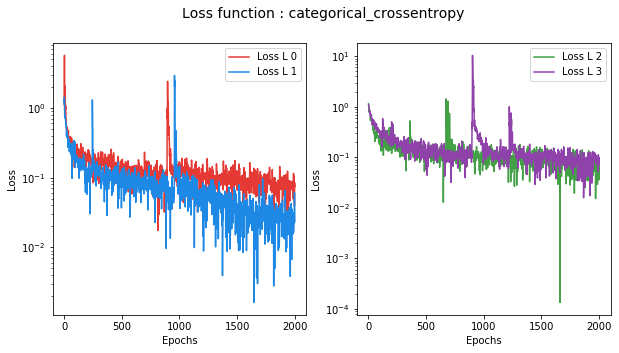

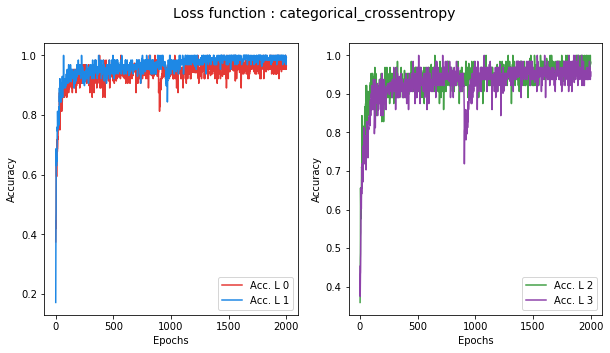

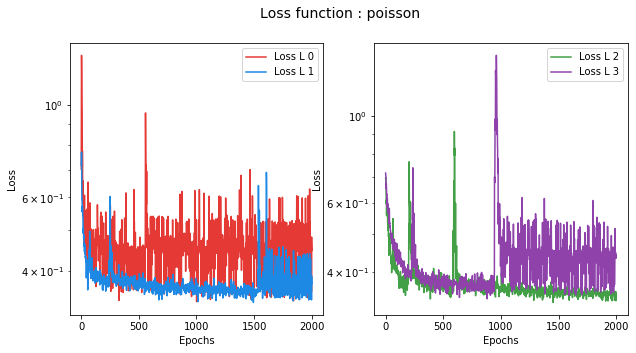

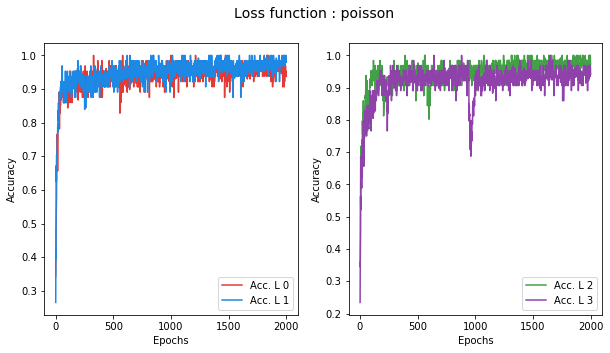

In [21]:
for i, loss in enumerate(losses):
    plot_title="Loss function : {}".format(loss)
    plot_test(losses_all_7[i], 'loss', plot_type='log', fig_title=plot_title)
    plot_test(acc_all_7[i], 'acc', plot_type='lin', fig_title=plot_title)

In [22]:
scores = np.array(score_test_all_7)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Filters', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_loss_CNN_2D.csv')
df_scores.head(40)

,Loss-Func.,Num. Filters,F1-Score,Accuracy
0,binary_crossentropy,1,0.5835240274599542,0.5789473684210527
1,binary_crossentropy,2,0.6186974093950838,0.6140350877192983
2,binary_crossentropy,3,0.5703093779505082,0.5614035087719298
3,binary_crossentropy,4,0.45713782784720997,0.45614035087719296
4,binary_crossentropy,5,0.6069353986974124,0.6140350877192983
5,categorical_crossentropy,1,0.6517809675704412,0.6666666666666666
6,categorical_crossentropy,2,0.5220193340494093,0.543859649122807
7,categorical_crossentropy,3,0.6668461434917218,0.6666666666666666
8,categorical_crossentropy,4,0.6208064019698368,0.631578947368421
9,categorical_crossentropy,5,0.7115671005831189,0.7017543859649122


In [23]:
# Losses to evaluate
optimizers = ['SGD', 'RMSprop', 'adam', 'adadelta', 'adagrad', 'adamax', 'nadam', 'ftrl']

# Empty lists to save the losses at each iteration
losses_all_8 = []
acc_all_8 = []
score_test_all_8 = []


# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]
kernels_seed = [2]

# Loop in the number of layers
for opt in optimizers:
    print('\nOptimizer function : {}\n'.format(opt))
    loss_i, acc_i = [], []
    for nf in range (1, 6):
        l_f = filters_seed[0:nf]
        l_k = kernels_seed * nf
        print('\nNum. filters : {}'.format(nf))
        print('Filters        : {}'.format(l_f))
        model_nl = None
        class_nl = None
        model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k, opt_fun=opt)
        class_nl = classEval(features_mel, labels_vec, model_nl, epochs=500, verbose=0,
                             dim_data=2, dim0=dim_feat, dim1=len_min)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_8.append([loss, nf, f1, acc])
    losses_all_8.append(loss_i)
    acc_all_8.append(acc_i)
    print('-------------------------------------------\n')


Optimizer function : SGD


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : RMSprop


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filter


Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : adam


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
---------------------------------------


Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : adagrad


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128


Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : nadam


Num. filters : 1
Filters        : [128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 


Num. filters : 2
Filters        : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



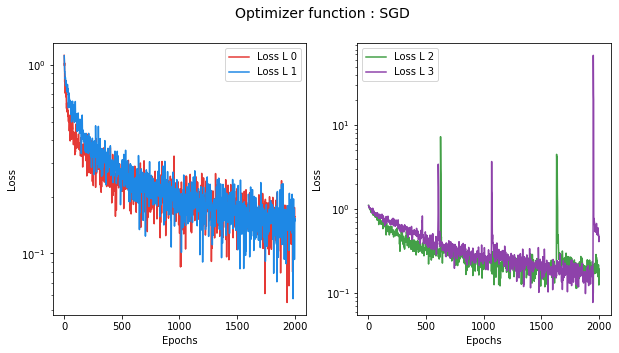

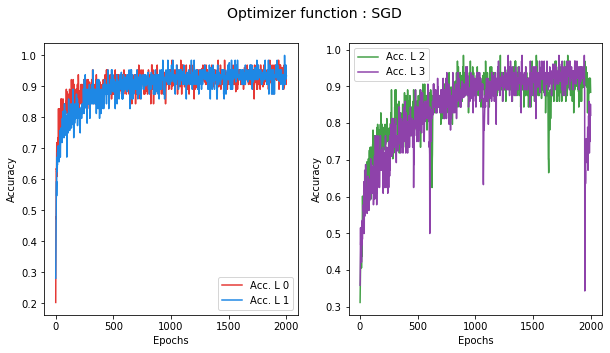

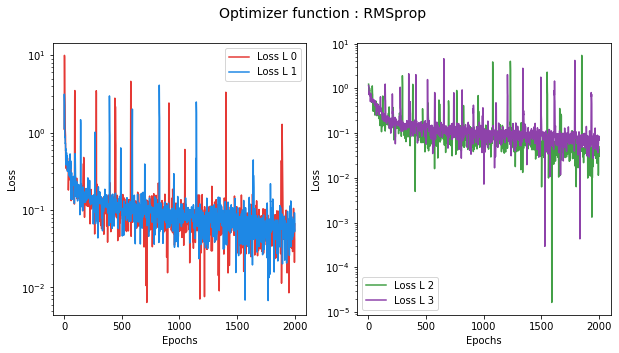

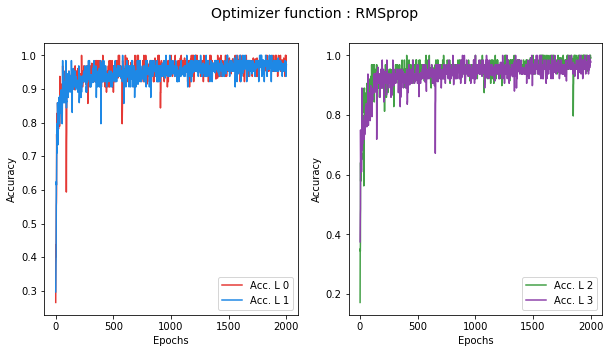

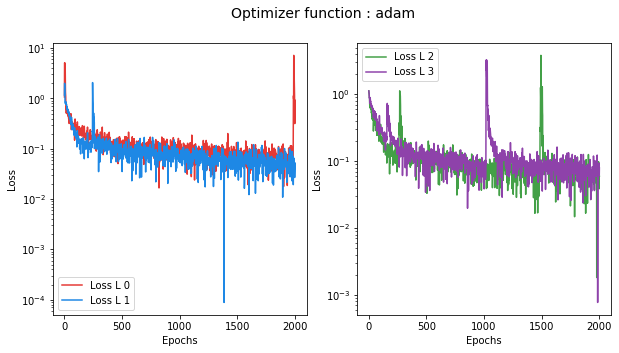

...

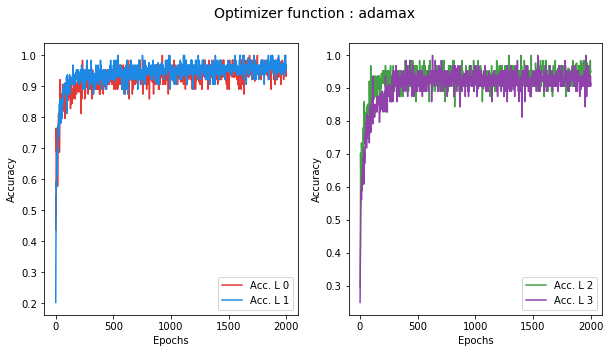

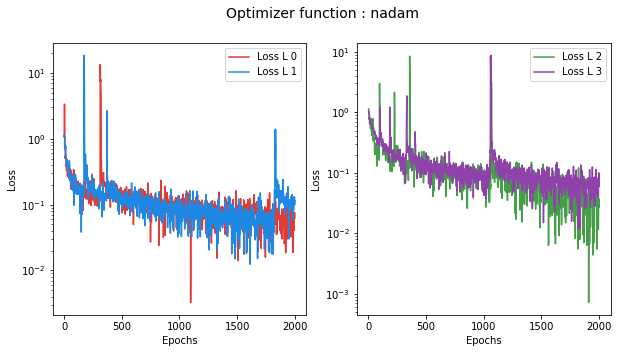

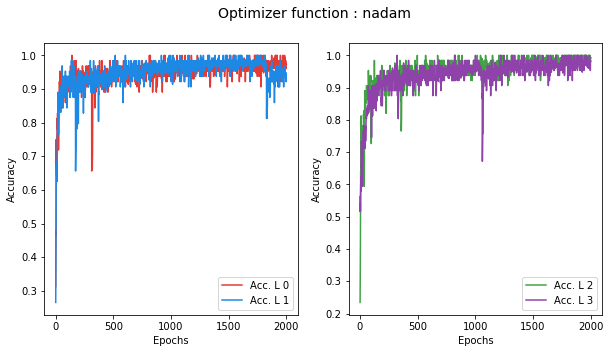

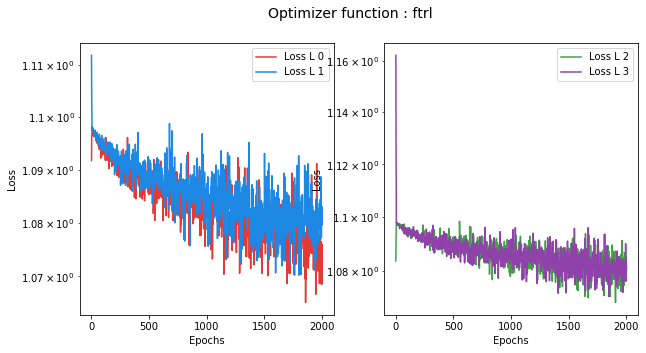

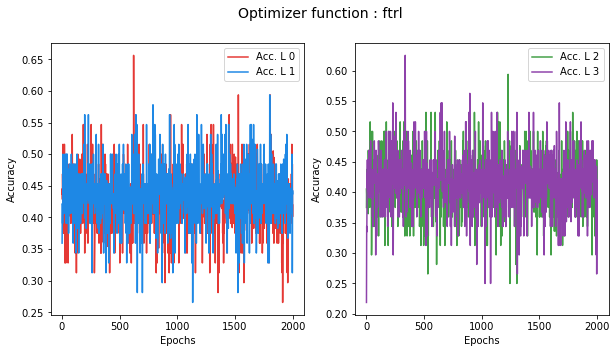

In [24]:
for i, opt in enumerate(optimizers):
    plot_title="Optimizer function : {}".format(opt)
    plot_test(losses_all_8[i], 'loss', plot_type='log', fig_title=plot_title)
    plot_test(acc_all_8[i], 'acc', plot_type='lin', fig_title=plot_title)

In [31]:
scores = np.array(score_test_all_8)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Filters', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_opts_CNN_2D.csv')
df_scores.head(40)

,Loss-Func.,Num. Filters,F1-Score,Accuracy
0,SGD,1,0.6891341599701986,0.6842105263157895
1,SGD,2,0.6078900956093939,0.6140350877192983
2,SGD,3,0.7274238227146815,0.7192982456140351
3,SGD,4,0.5349822029009974,0.5614035087719298
4,SGD,5,0.6998050682261211,0.7017543859649122
5,RMSprop,1,0.5532672260361047,0.5614035087719298
6,RMSprop,2,0.5382243487506646,0.5263157894736842
7,RMSprop,3,0.4843679712100765,0.5263157894736842
8,RMSprop,4,0.578530045443847,0.5964912280701754
9,RMSprop,5,0.6656413761676919,0.7017543859649122


---

### 2.4.2 Spectral Representation (STFT)

For a second test we use now the spectral representation, calculated through `STFT`.

In [16]:
# Load the audio data...
try:
    del audio_data
except NameError:
    None    
audio_data = load_save('sound', 'load')

# Initialization variables to save the features:
sr = 44100      # sample rate
dt = 23         # sampling duration in ms
n0 = dt * sr / 1000
n0 = int(math.log(n0, 2))
n_fft = 2**n0
print('Length of windowed signal : {}'.format(n_fft))

# Num. of features
dim_feat = 1 + int(n_fft / 2)
print('Number of features : {}'.format(dim_feat))

# Empty arrays and dict to save the features
dim_labels = labels_vec.shape[1]
dict_stft = {}

# Set Max. dim of an array, to avoid excessively large arrays:
max_dim = max_elem(dim_feat*dim_labels, mem_val=5)

# Calculate the Mel-Scale Spectrograms
print(':', end='')
for ind in range(len(audio_data)):
    print('=', end='')
    ndim = audio_data[ind].shape[0]
    if ndim > max_dim:
        ndim = max_dim
    # Spectral distribution
    spectral  = np.abs(librosa.stft(y=audio_data[ind][:max_dim], n_fft=n_fft))
    # save each spectrogram to an array...
    dict_stft[ind] = spectral

sound loaded
Length of windowed signal : 512
Number of features : 257
For dim_0 : 771, Max. Num. of Elements : 870412
:=========================================================================================================================================================================================================================================================================================

In [17]:
# To save some memory

del audio_data

Now we find the smallest spectrogram, and then we will slice all other arrays to the same shape...

In [18]:
# find smallest array...
# len_min = max_dim
# for i in dict_stft.keys():
#     data = dict_stft[i]
#     len_i = data.shape[1]
#     if len_i > 500:
#         len_min = min(len_min, len_i, dim_feat)
len_min = dim_feat

print('Minimal length : {}'.format(len_min))

features_stft = np.empty((0, dim_feat*len_min))
for i in dict_stft.keys():
    data = dict_stft[i]
#     print(data.shape)
    len_i = min(data.shape[1], len_min)
    tmp = np.zeros((dim_feat, len_min))
    tmp[:dim_feat,:len_i] = data[:dim_feat,:len_i]
    tmp = np.reshape(tmp, (1,dim_feat*len_min))
    features_stft = np.vstack([features_stft, tmp])

del dict_stft
print('\n\nFeatures shape:{}'.format(features_stft.shape))

Minimal length : 257


Features shape:(281, 66049)


In [20]:
load_save('feat_stft', 'save', features_stft, file_name='features_stft_257x257_data.npy')

feat_stft saved


In [12]:
features_stft = load_save('feat_stft', 'load', file_name='features_stft_2049x2049_data.npy')

feat_mel loaded


In [21]:
#Full list of neurons per layer...
n_neurons9 = int(n_neurons8 / 2)
l_neurons = [n_neurons0, n_neurons1, n_neurons2, n_neurons3, n_neurons4,
             n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]
l_neurons

[4096, 2048, 1024, 512, 256, 128, 64, 32, 16, 8]

We start with one convolutional layer (`Conv2D` and `MaxPooling2d`) and with different number of filters. Setting maximal number of filters to 128, because for larger numbers the machine basically crashed!

filters = `[128, 64, 32, 16]`

In [22]:
# Empty lists to save the losses at each iteration
losses_all_0 = []
acc_all_0 = []
score_test_all_0 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8]

# Loop in the number of layers
for nf in filters_seed:
    print('\nNum. of filters : {}'.format(nf))
    l_f = [nf]
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=200, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_0.append(class_nl.get_loss())
    acc_all_0.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_0.append([nf, f1, acc])
    print('-------------------------------------------\n')


Num. of filters : 128
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------


Num. of filters : 64
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------


Num. of filters : 32
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------


Num. of filters : 16
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 200. batch_size : 64
-------------------------------------------



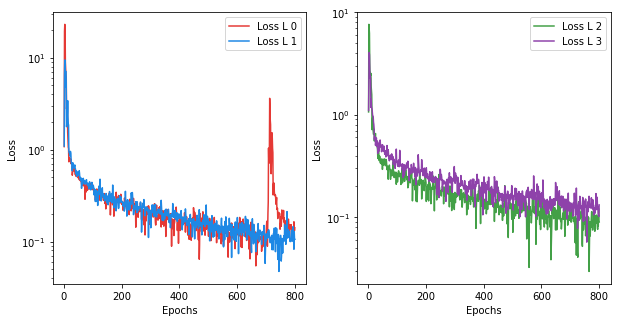

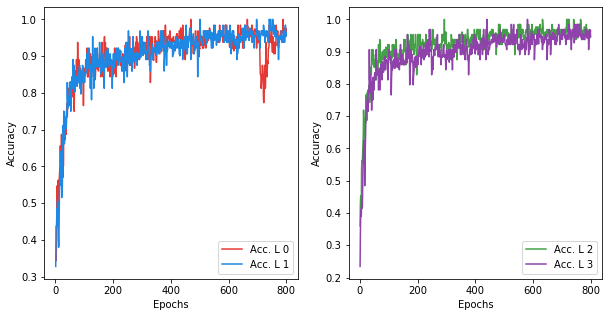

In [23]:
plot_test(losses_all_0, 'loss', plot_type='log')
plot_test(acc_all_0, 'acc', plot_type='lin')

In [24]:
scores = np.array(score_test_all_0)
df_scores = pd.DataFrame(scores, columns=['Num.-Filters', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num.-Filters,F1-Score,Accuracy
0,128.0,0.742882,0.754386
1,64.0,0.648297,0.649123
2,32.0,0.534120,0.543860
3,16.0,0.595295,0.578947


Test with several layers, increasing grdually the number of filters:

In [25]:
# Empty lists to save the losses at each iteration
losses_all_1 = []
acc_all_1 = []
score_test_all_1 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]

# Loop in the number of layers
for nf in range(2, 6):
    print('\nNum. of filters : {}'.format(nf))
    l_f = filters_seed[0:nf]
    print('\nFilters : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_1.append(class_nl.get_loss())
    acc_all_1.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_1.append([nf, f1, acc])
    print('-------------------------------------------\n')


Num. of filters : 2

Filters : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 3

Filters : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 4

Filters : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 5

Filters : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



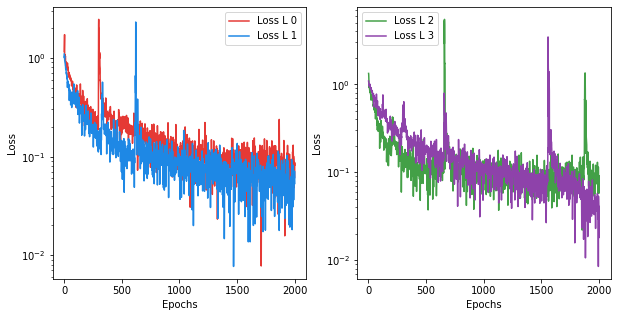

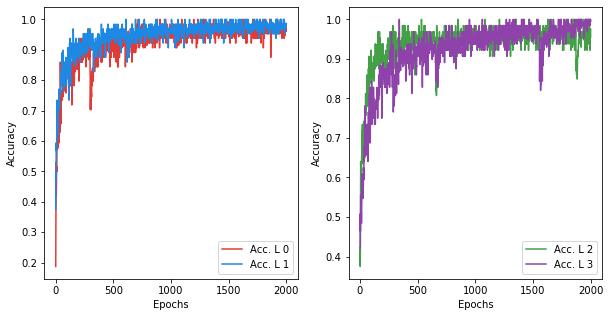

In [26]:
plot_test(losses_all_1, 'loss', plot_type='log')
plot_test(acc_all_1, 'acc', plot_type='lin')

In [27]:
scores = np.array(score_test_all_1)
df_scores = pd.DataFrame(scores, columns=['Num.-Filters', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num.-Filters,F1-Score,Accuracy
0,2.0,0.518700,0.526316
1,3.0,0.583559,0.578947
2,4.0,0.479763,0.491228
3,5.0,0.607749,0.614035


Test with several layers, decreasing the number of filters:

In [28]:
# Empty lists to save the losses at each iteration
losses_all_2 = []
acc_all_2 = []
score_test_all_2 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]

# Loop in the number of layers
for nf in range(2, 6):
    print('\nNum. of filters : {}'.format(nf))
    l_f = filters_seed[0:nf]
    print('\nFilters : {}'.format(l_f))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_2.append(class_nl.get_loss())
    acc_all_2.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_2.append([nf, f1, acc])
    print('-------------------------------------------\n')


Num. of filters : 2

Filters : [128, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 3

Filters : [128, 64, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 4

Filters : [128, 64, 32, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Num. of filters : 5

Filters : [128, 64, 32, 16, 8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



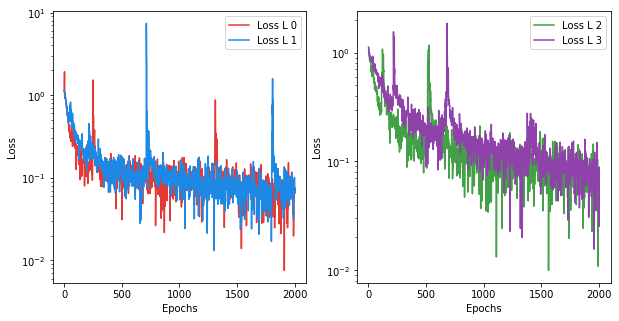

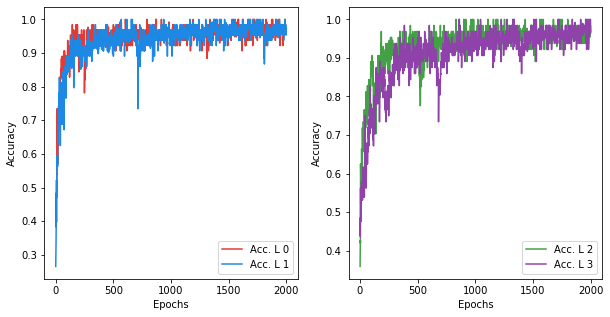

In [29]:
plot_test(losses_all_2, 'loss', plot_type='log')
plot_test(acc_all_2, 'acc', plot_type='lin')

In [30]:
scores = np.array(score_test_all_2)
df_scores = pd.DataFrame(scores, columns=['Num.-Set-Filters', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Num.-Set-Filters,F1-Score,Accuracy
0,2.0,0.593567,0.596491
1,3.0,0.653043,0.631579
2,4.0,0.537612,0.526316
3,5.0,0.594518,0.614035


Now we perform a look on the lost kernels / pools, while increasing the number of filters:

In [31]:
# Empty lists to save the losses at each iteration
losses_all_3 = []
acc_all_3 = []
score_test_all_3 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]

# Loop in the number of layers
for nk in range(1, 3):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = [nk] * nf
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_3.append(class_nl.get_loss())
    acc_all_3.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_3.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



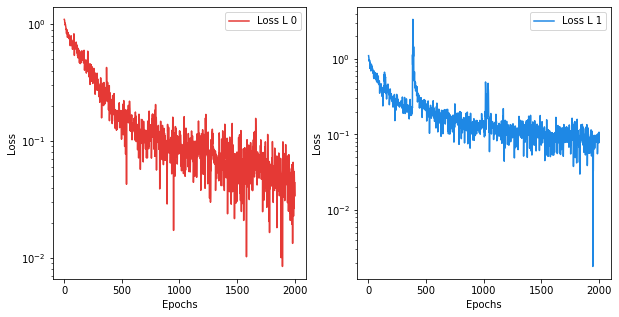

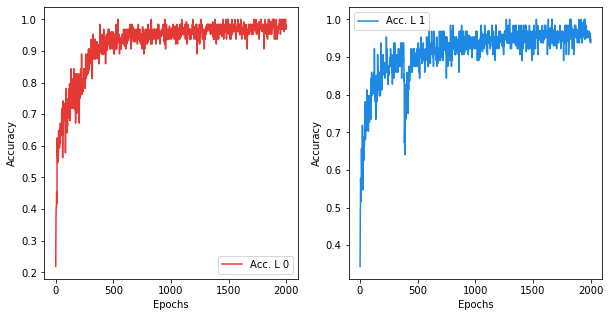

In [32]:
plot_test(losses_all_3, 'loss', plot_type='log')
plot_test(acc_all_3, 'acc', plot_type='lin')

In [33]:
scores = np.array(score_test_all_3)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_size', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_size,F1-Score,Accuracy
0,1.0,0.483937,0.473684
1,2.0,0.530065,0.543860


In [34]:
# Empty lists to save the losses at each iteration
losses_all_4 = []
acc_all_4 = []
score_test_all_4 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]

kernels_seed=[[1, 1, 1, 2, 2], [1, 1, 2, 2, 2], [2, 2, 1, 1, 1], [2, 2, 2, 1, 1]]

# Loop in the number of layers
for nk in range(4):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = kernels_seed[nk]
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_4.append(class_nl.get_loss())
    acc_all_4.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_4.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [1, 1, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



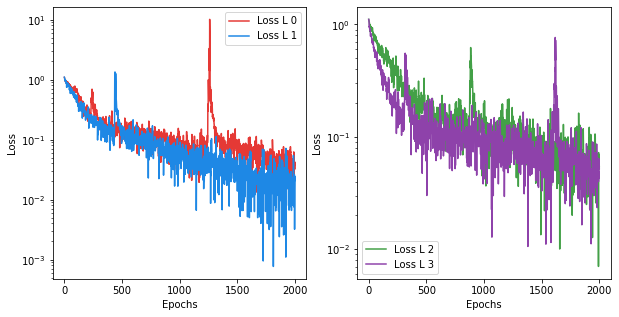

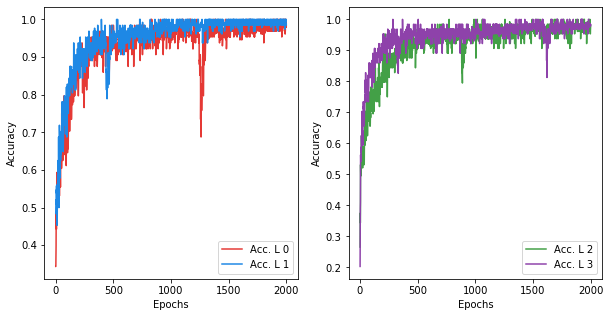

In [35]:
plot_test(losses_all_4, 'loss', plot_type='log')
plot_test(acc_all_4, 'acc', plot_type='lin')

In [36]:
scores = np.array(score_test_all_4)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_set', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_set,F1-Score,Accuracy
0,0.0,0.529279,0.543860
1,1.0,0.579660,0.561404
2,2.0,0.683254,0.666667
3,3.0,0.409140,0.421053


Now we perform a look on the lost kernels / pools, while decreasing the number of filters:

In [46]:
# Empty lists to save the losses at each iteration
losses_all_5 = []
acc_all_5 = []
score_test_all_5 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]

# Loop in the number of layers
for nk in range(1, 3):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = [nk] * nf
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_5.append(class_nl.get_loss())
    acc_all_5.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_5.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



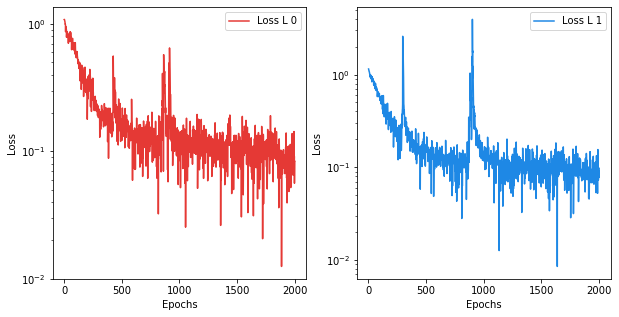

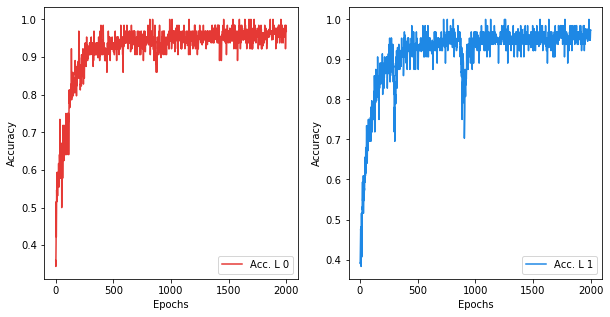

In [47]:
plot_test(losses_all_5, 'loss', plot_type='log')
plot_test(acc_all_5, 'acc', plot_type='lin')

In [48]:
scores = np.array(score_test_all_5)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_size', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_size,F1-Score,Accuracy
0,1.0,0.593700,0.596491
1,2.0,0.601584,0.596491


In [43]:
# Empty lists to save the losses at each iteration
losses_all_6 = []
acc_all_6 = []
score_test_all_6 = []

# To set the number of filters and kernels per layer
filters_seed = [n_neurons5, n_neurons6, n_neurons7, n_neurons8, n_neurons9]

kernels_seed=[[1, 1, 1, 2, 2], [1, 1, 2, 2, 2], [2, 2, 1, 1, 1], [2, 2, 2, 1, 1]]

# Loop in the number of layers
for nk in range(4):
    nf = len(filters_seed)
    l_f = filters_seed
    l_k = kernels_seed[nk]
    print('\nKernels : {}'.format(l_k))
    model_nl = None
    class_nl = None
    model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k)
    class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                         dim_data=2, dim0=dim_feat, dim1=len_min)
    class_nl.train()
    losses_all_6.append(class_nl.get_loss())
    acc_all_6.append(class_nl.get_acc())
    f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
    score_test_all_6.append([nk, f1, acc])
    print('-------------------------------------------\n')


Kernels : [1, 1, 1, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [1, 1, 2, 2, 2]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 1, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Kernels : [2, 2, 2, 1, 1]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



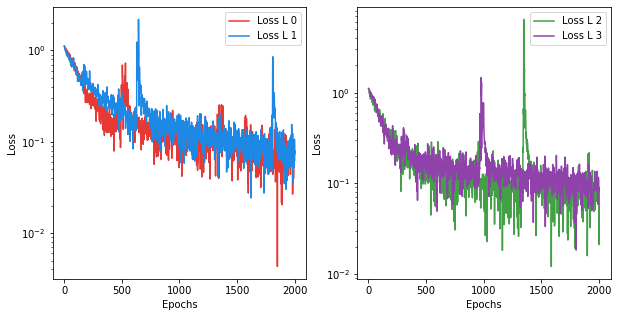

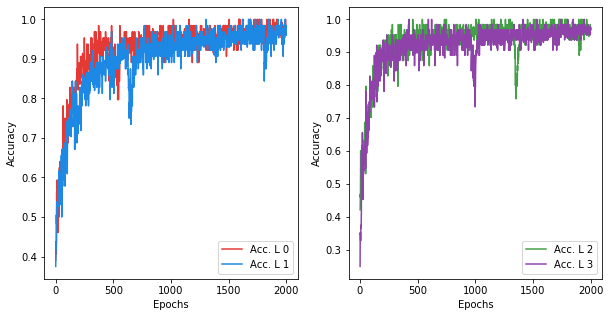

In [44]:
plot_test(losses_all_6, 'loss', plot_type='log')
plot_test(acc_all_6, 'acc', plot_type='lin')

In [45]:
scores = np.array(score_test_all_6)
df_scores = pd.DataFrame(scores, columns=['Kernel_pool_set', 'F1-Score', 'Accuracy'])
df_scores.head(10)

,Kernel_pool_set,F1-Score,Accuracy
0,0.0,0.600346,0.596491
1,1.0,0.495828,0.526316
2,2.0,0.488521,0.491228
3,3.0,0.492982,0.491228


In [50]:
# Losses to evaluate
losses = ["binary_crossentropy", "categorical_crossentropy", "poisson"]

# Empty lists to save the losses at each iteration
losses_all_7 = []
acc_all_7 = []
score_test_all_7 = []


# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]
kernels_seed = [2]

# Loop in the number of layers
for loss in losses:
    print('\nLoss function : {}\n'.format(loss))
    loss_i, acc_i = [], []
    for nf in range (1, 6):
        l_f = filters_seed[0:nf]
        l_k = kernels_seed * nf
        print('\nNum. filters : {}'.format(nf))
        print('Filters        : {}'.format(l_f))
        model_nl = None
        class_nl = None
        model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k, loss_fun=loss)
        class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                             dim_data=2, dim0=dim_feat, dim1=len_min)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_7.append([loss, nf, f1, acc])
    losses_all_7.append(loss_i)
    acc_all_7.append(acc_i)
    print('-------------------------------------------\n')


Loss function : binary_crossentropy


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Loss function : categorical_crossentropy


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filte


Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Loss function : poisson


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



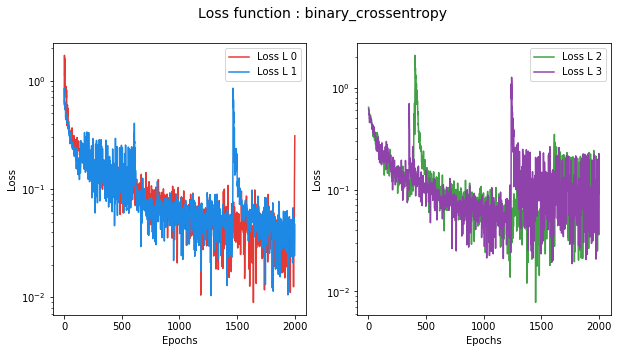

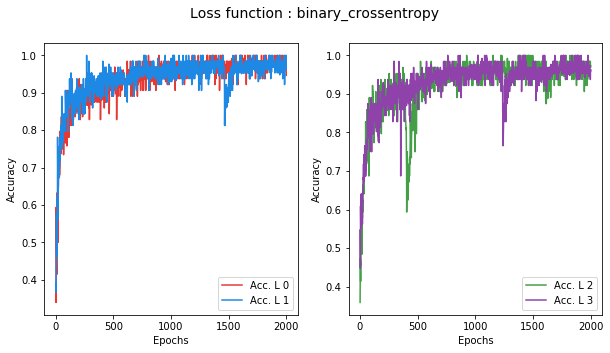

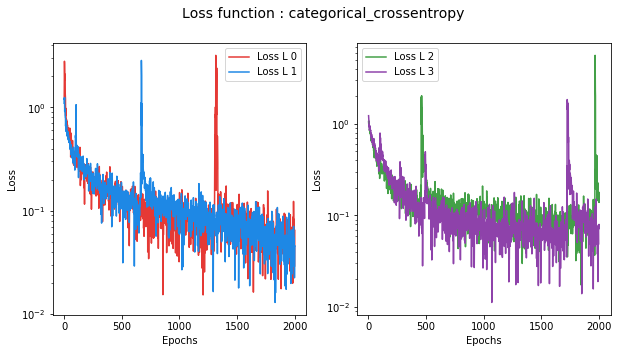

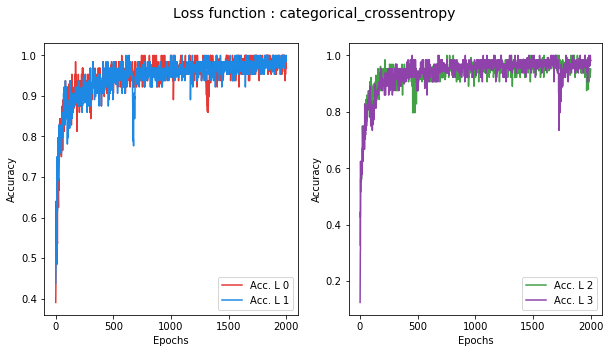

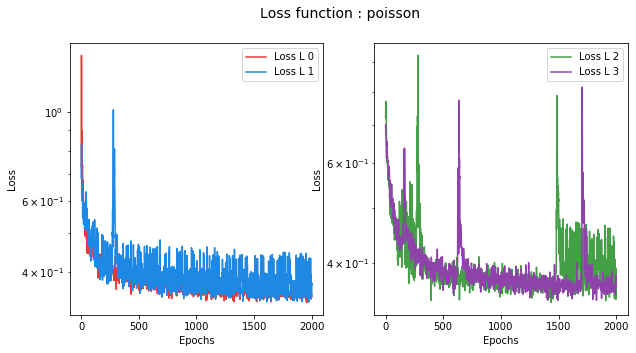

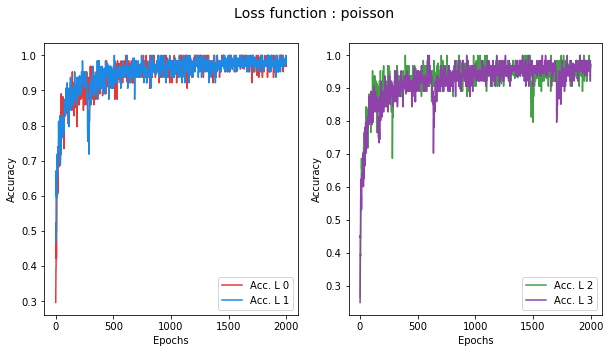

In [51]:
for i, loss in enumerate(losses):
    plot_title="Loss function : {}".format(loss)
    plot_test(losses_all_7[i], 'loss', plot_type='log', fig_title=plot_title)
    plot_test(acc_all_7[i], 'acc', plot_type='lin', fig_title=plot_title)

In [52]:
scores = np.array(score_test_all_7)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Filters', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_loss_CNN_2D.csv')
df_scores.head(40)

,Loss-Func.,Num. Filters,F1-Score,Accuracy
0,binary_crossentropy,1,0.4204541383488752,0.40350877192982454
1,binary_crossentropy,2,0.5602787764483999,0.5789473684210527
2,binary_crossentropy,3,0.639048601896899,0.6491228070175439
3,binary_crossentropy,4,0.5425110726245154,0.543859649122807
4,binary_crossentropy,5,0.43076441102756896,0.43859649122807015
5,categorical_crossentropy,1,0.6380724538619276,0.6842105263157895
6,categorical_crossentropy,2,0.49449485783424074,0.5087719298245614
7,categorical_crossentropy,3,0.4876105357733957,0.49122807017543857
8,categorical_crossentropy,4,0.5477701345562488,0.5614035087719298
9,categorical_crossentropy,5,0.5139011049636671,0.5263157894736842


In [54]:
# Losses to evaluate
optimizers = ['SGD', 'RMSprop', 'adam', 'adadelta', 'adagrad', 'adamax', 'nadam', 'ftrl']

# Empty lists to save the losses at each iteration
losses_all_8 = []
acc_all_8 = []
score_test_all_8 = []


# To set the number of filters and kernels per layer
filters_seed = [n_neurons9, n_neurons8, n_neurons7, n_neurons6, n_neurons5]
kernels_seed = [2]

# Loop in the number of layers
for opt in optimizers:
    print('\nOptimizer function : {}\n'.format(opt))
    loss_i, acc_i = [], []
    for nf in range (1, 6):
        l_f = filters_seed[0:nf]
        l_k = kernels_seed * nf
        print('\nNum. filters : {}'.format(nf))
        print('Filters        : {}'.format(l_f))
        model_nl = None
        class_nl = None
        model_nl = modelCNN(l_f, dim_feat, len_min, dim_labels, l_kernels=l_k, opt_fun=opt)
        class_nl = classEval(features_stft, labels_vec, model_nl, epochs=500, verbose=0,
                             dim_data=2, dim0=dim_feat, dim1=len_min)
        class_nl.train()
        loss_i.append(class_nl.get_loss())
        acc_i.append(class_nl.get_acc())
        f1, acc = class_nl.pred_score(save_vals=True, print_vals=False)
        score_test_all_8.append([opt, nf, f1, acc])
    losses_all_8.append(loss_i)
    acc_all_8.append(acc_i)
    print('-------------------------------------------\n')


Optimizer function : SGD


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : RMSprop


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        :


Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : adam


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


O


Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : adagrad


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64


Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------


Optimizer function : nadam


Num. filters : 1
Filters        : [8]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Trai


Num. filters : 2
Filters        : [8, 16]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 3
Filters        : [8, 16, 32]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 4
Filters        : [8, 16, 32, 64]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64

Num. filters : 5
Filters        : [8, 16, 32, 64, 128]
Training + Test data. Norm : True. Shuffle : True. test_size = 0.2.
Epochs : 500. batch_size : 64
-------------------------------------------



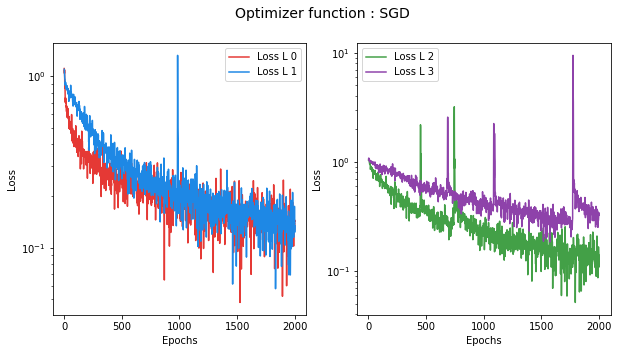

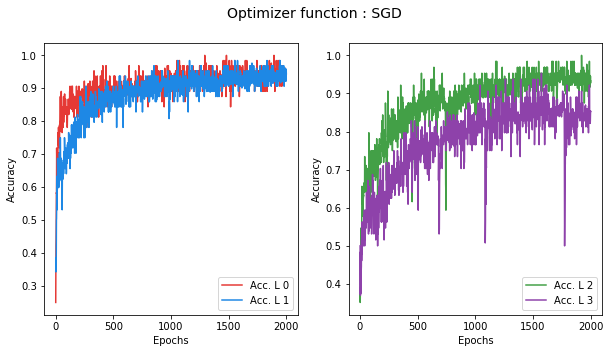

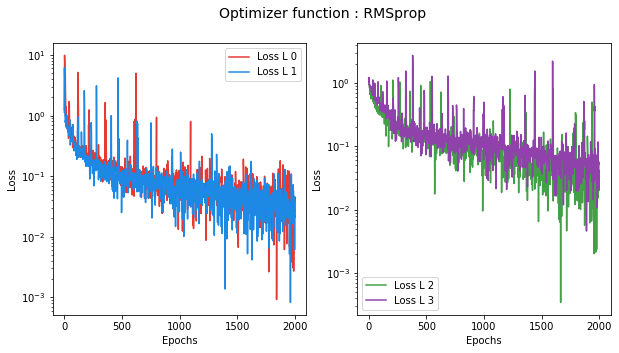

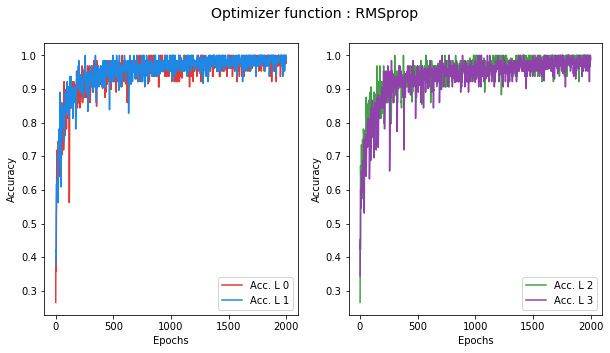

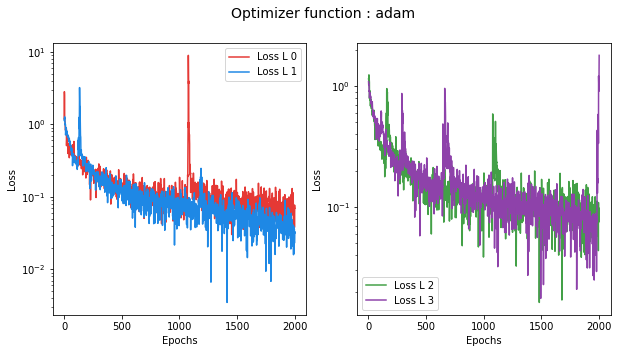

...

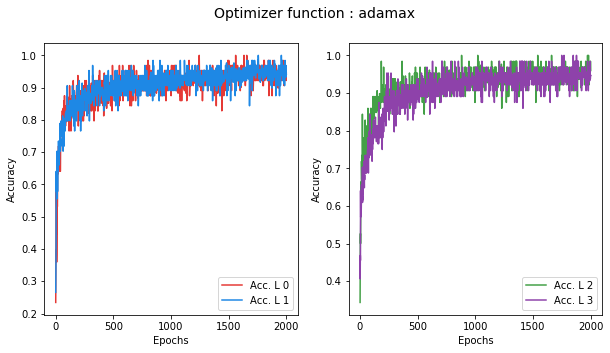

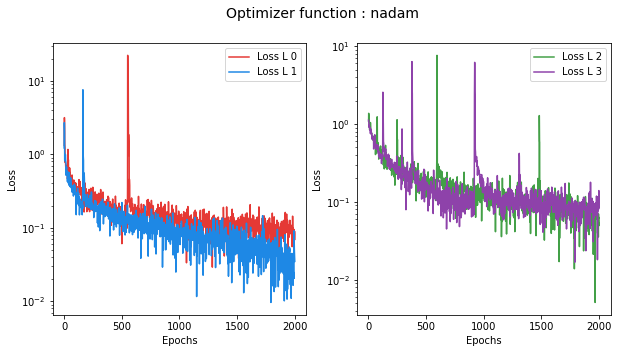

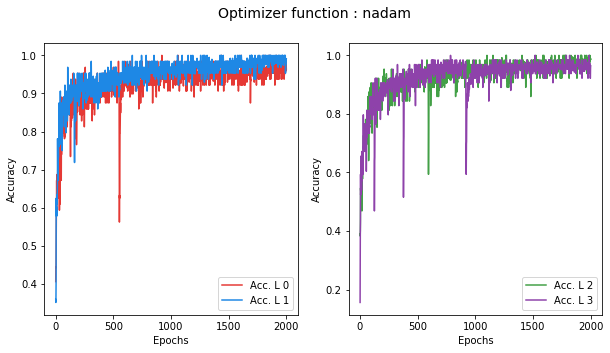

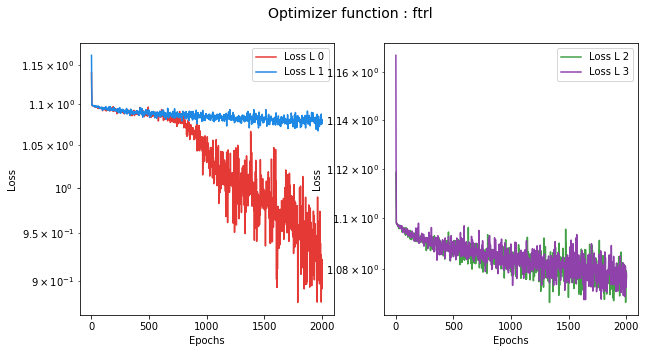

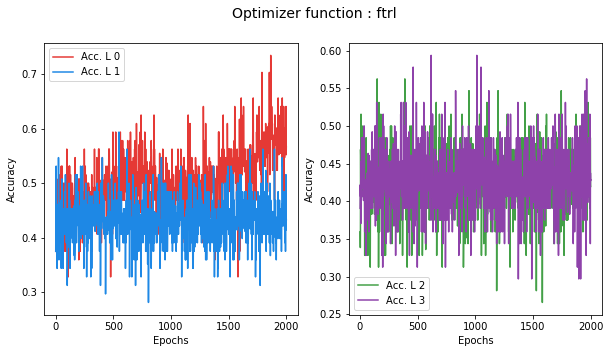

In [55]:
for i, opt in enumerate(optimizers):
    plot_title="Optimizer function : {}".format(opt)
    plot_test(losses_all_8[i], 'loss', plot_type='log', fig_title=plot_title)
    plot_test(acc_all_8[i], 'acc', plot_type='lin', fig_title=plot_title)

In [56]:
scores = np.array(score_test_all_8)
df_scores = pd.DataFrame(scores, columns=['Loss-Func.', 'Num. Filters', 'F1-Score', 'Accuracy'])
df_scores.to_csv('./saved/scores_opts_CNN_2D.csv')
df_scores.head(40)

,Loss-Func.,Num. Filters,F1-Score,Accuracy
0,SGD,1,0.5495707145453947,0.5789473684210527
1,SGD,2,0.5117272453124723,0.5087719298245614
2,SGD,3,0.4360902255639098,0.47368421052631576
3,SGD,4,0.6041363913986647,0.5964912280701754
4,SGD,5,0.6615644924531896,0.6666666666666666
5,RMSprop,1,0.624905400756794,0.6140350877192983
6,RMSprop,2,0.5352567498700734,0.5614035087719298
7,RMSprop,3,0.612017967624375,0.5964912280701754
8,RMSprop,4,0.6438731098846862,0.6491228070175439
9,RMSprop,5,0.5690416517484187,0.5614035087719298


In [78]:
score_test_all_8

[['SGD', 1, 0.5495707145453947, 0.5789473684210527],
 ['SGD', 2, 0.5117272453124723, 0.5087719298245614],
 ['SGD', 3, 0.4360902255639098, 0.47368421052631576],
 ['SGD', 4, 0.6041363913986647, 0.5964912280701754],
 ['SGD', 5, 0.6615644924531896, 0.6666666666666666],
 ['RMSprop', 1, 0.624905400756794, 0.6140350877192983],
 ['RMSprop', 2, 0.5352567498700734, 0.5614035087719298],
 ['RMSprop', 3, 0.612017967624375, 0.5964912280701754],
 ['RMSprop', 4, 0.6438731098846862, 0.6491228070175439],
 ['RMSprop', 5, 0.5690416517484187, 0.5614035087719298],
 ['adam', 1, 0.4615419076647387, 0.47368421052631576],
 ['adam', 2, 0.6076236044657097, 0.6140350877192983],
 ['adam', 3, 0.6130382775119618, 0.6140350877192983],
 ['adam', 4, 0.49730094466936575, 0.5614035087719298],
 ['adam', 5, 0.5156001959357598, 0.5263157894736842],
 ['adadelta', 1, 0.49690363969625556, 0.5263157894736842],
 ['adadelta', 2, 0.5227652464494569, 0.543859649122807],
 ['adadelta', 3, 0.5444300810505797, 0.5614035087719298],
 ['ad

---
***

## 4.0 Summary

Here some of the scores for the different classification methods:

To end with this model definition phase, we check all the obtained scores for the different models, using different loss and optimizer functions.

To do so, we start defining a function to extract the highest scores...

In [105]:
def maxExtract(df_score, n=20):
    """
    Function to obtain the highest n scores from a data frame.
    df_score : DF with all loss values
    actFuns : Array with the name of the activation functions in df_All
    n       : Num. of values to extract
    """
    # Column with the score to order
    col_sel = "F1-Score"
    # Extract the n highest values for each function in actFuns
    temp = df_score.sort_values(ascending=False, by=col_sel)
    temp.drop(columns=["Unnamed: 0"], inplace=True)
    #The index must be restarted, to avoid confusions when merging DFs
    temp = temp.head(n).reset_index(drop=True)
    return temp

#### 4.1 Dropout Model:

In [107]:
df_opts = pd.read_csv('./saved/scores_opts_Dropout.csv')
df_loss = pd.read_csv('./saved/scores_losses_Dropout.csv')

df0 = maxExtract(df_loss)
df1 = maxExtract(df_opts)
df = pd.concat([df0, df1], axis=1, sort=False)
df.head(10)

,Loss-Func.,Num. Layers,F1-Score,Accuracy,Opt.-Fun.,Num. Layers,F1-Score,Accuracy
0,categorical_crossentropy,2,0.770651,0.754386,nadam,7,0.842268,0.842105
1,categorical_crossentropy,7,0.754737,0.736842,SGD,2,0.838669,0.842105
2,categorical_crossentropy,3,0.743675,0.754386,adagrad,1,0.825278,0.824561
3,poisson,7,0.735814,0.736842,nadam,2,0.822184,0.824561
4,categorical_crossentropy,5,0.733431,0.736842,SGD,9,0.817218,0.824561
5,poisson,9,0.719721,0.719298,adadelta,2,0.802266,0.807018
6,categorical_crossentropy,1,0.718834,0.719298,adagrad,9,0.787392,0.824561
7,categorical_crossentropy,6,0.713450,0.701754,adagrad,8,0.778904,0.807018
8,poisson,4,0.712121,0.736842,nadam,8,0.776506,0.771930
9,poisson,8,0.699750,0.701754,adamax,5,0.773784,0.771930


For the loss function, it is clear that the `categorical_crossentropy` gave us the best results, also the most stable, for a relative small number of hidden layers, particularly between the options `0` to `3` for the hidden layers (between 1 and 4, with a maximum of `4096` neurons/layer and a minimum of `512`).

For the optmizer, maybe the best results were obtained using the `nadam` function, but the more stables were the ones given by the `adamax` function. We need to take a closer look to the number of hidden layers, since most of all results with different optimizers oscillate wildly for a relative large number of hidden layers.

**Selection:** To use this model further, we decided to use `categorical_crossentropy` loss function, both `nadam` and `adamax` optimizers, and 3 hidden layers with `[4096, 2048, 1024]` neurons/layer, using the dropouts `[0.3, 0.3, 0.2]` after each hidden layer.

---

#### 4.2 Deep Model:

In [108]:
df_opts = pd.read_csv('./saved/scores_opts_Deep.csv')
df_loss = pd.read_csv('./saved/scores_losses_Deep.csv')

df0 = maxExtract(df_loss)
df1 = maxExtract(df_opts)
df = pd.concat([df0, df1], axis=1, sort=False)
df.head(10)

,Loss-Func.,Num. Layers,F1-Score,Accuracy,Opt.-Func.,Num. Layers,F1-Score,Accuracy
0,poisson,3,0.812949,0.807018,adam,1,0.807933,0.807018
1,categorical_crossentropy,2,0.800805,0.807018,adadelta,5,0.785039,0.807018
2,binary_crossentropy,7,0.781015,0.789474,SGD,4,0.784839,0.807018
3,categorical_crossentropy,6,0.719838,0.736842,SGD,1,0.776098,0.771930
4,poisson,5,0.705046,0.719298,adagrad,4,0.769348,0.771930
5,poisson,1,0.694367,0.701754,nadam,6,0.765906,0.736842
6,categorical_crossentropy,4,0.691041,0.719298,RMSprop,7,0.759132,0.754386
7,categorical_crossentropy,8,0.687621,0.684211,adadelta,6,0.759128,0.771930
8,poisson,9,0.682056,0.684211,adagrad,5,0.754307,0.754386
9,poisson,4,0.679393,0.684211,adagrad,9,0.748097,0.754386


For the loss function, the most stable were those obtained with the `categorical_crossentropy`, with some exceptions for the `Poisson` results.

For the optimizers, we see good results using both the `adam` and `adamax` optimizers, with some exceptions for the `SGD` and the `adadelta` functions, but the last depends deeply on the number of hidden layers.

**Selection:** To use this model, we decided to use the `categorical_crossentropy` loss function, the `adam` and `adamax` optimizers, using 4 hidden layers with `[4096, 2048, 1024, 512]` neurons/layer.

---

#### 4.3 Autoencoder Model:

In [125]:
df_opts = pd.read_csv('./saved/scores_opts_Autoencoder.csv')
df_loss = pd.read_csv('./saved/scores_losses_Autoencoder.csv')

df0 = maxExtract(df_loss)
df1 = maxExtract(df_opts)
df = pd.concat([df0, df1], axis=1, sort=False)
df.head(10)

,Loss-Func.,Num. Layers,F1-Score,Accuracy,U0,Opt.-Fun.,Num. Layers,F1-Score,Accuracy
0,poisson,3,0.817251,0.824561,1,SGD,2,0.789839,0.789474
1,poisson,1,0.803391,0.807018,14,RMSprop,6,0.777778,0.771930
2,categorical_crossentropy,1,0.788619,0.789474,53,adamax,9,0.771930,0.771930
3,binary_crossentropy,3,0.771193,0.754386,15,RMSprop,7,0.768640,0.807018
4,poisson,5,0.755814,0.754386,23,adam,6,0.763419,0.754386
5,categorical_crossentropy,6,0.748516,0.736842,19,adam,2,0.758745,0.754386
6,binary_crossentropy,4,0.740358,0.736842,52,adamax,8,0.744361,0.754386
7,binary_crossentropy,2,0.731837,0.736842,57,nadam,4,0.743447,0.754386
8,poisson,6,0.729971,0.736842,11,RMSprop,3,0.739433,0.736842
9,binary_crossentropy,5,0.714200,0.719298,54,nadam,1,0.720823,0.719298


We see excelent results using the `categorical_crossentropy` and the `Poisson` loss functions, but the last converges slowly.

For the optimizers wee see that the scores are relatively good for different functions, but the most stable ones are `adam`, `adamax` and `nadam`. The number of hidden layers has a big influence on the behavior of the scores.

**Selection:** For this model we decided to use the `categorical_crossentropy` loss function, together with the `adamax` and `nadam` optimizers and `[128, 64, 32, 16]` neurons/layer for the decoding layers.

***

#### 4.4 CNN-1D Model:

In [126]:
df_opts = pd.read_csv('./saved/scores_opts_CNN_1D.csv')
df_loss = pd.read_csv('./saved/scores_losses_CNN_1D.csv')

df0 = maxExtract(df_loss)
df1 = maxExtract(df_opts)
df = pd.concat([df0, df1], axis=1, sort=False)
df.head(10)

,loss_fun,F1-Score,Accuracy,Opt.-Fun.,F1-Score,Accuracy
0,binary_crossentropy,0.830818,0.842105,RMSprop,0.768116,0.771930
1,poisson,0.827956,0.824561,adagrad,0.764989,0.771930
2,categorical_crossentropy,0.826281,0.824561,SGD,0.755775,0.736842
3,NaN,NaN,NaN,adamax,0.754494,0.736842
4,NaN,NaN,NaN,adam,0.724142,0.736842
5,NaN,NaN,NaN,nadam,0.668875,0.666667
6,NaN,NaN,NaN,adadelta,0.606140,0.684211
7,NaN,NaN,NaN,ftrl,0.249513,0.421053


For this case, we see that both `binary_crossentropy` and `categorical_crossentropy` give us good results, and the obtained accuracy is quite stable after a few epochs.

For the optimizers we see that several behaves good too, in particular `RMSprop`, `adam`, `adamax` and `nadam`.

**Selection:** For this model, we decided to use the `binary_crossentropy` loss function, together with the `RMSprop`, `adamax` and `nadam` optimizers. We will use 4 convolutional-1D layers, each with `512` filters and with the kernels `[7, 6, 5, 4]`.

---

#### 4.5 CNN-2D Model:

At the moment we decided to not continue with this model, because we are not satisfied with the preliminar results. The scores are not high enough and we do not see that the losses converge relatively quick. Maybe we need to use more data or other strategies... 

---
***
---